<h1>Aprendizaje Automatico 1</h1>

Tecnicatura Universitaria en Inteligencia Artificial

Materia: Aprendizaje Automático 1 (IA4.1)

**Trabajo Práctico: Predicción de lluvia en Australia**

**Docentes:**
- Agustín Almada
- Bruno Cocitto
- Joel Spak

**Integrantes:**

| Apellido y Nombre | Legajo   |
| --- | --- |
| Palermo, Leonel    | P-5192/6 |
| Wagner, Juan       | W-0557/6 |

Año: 2023

>[Importamos la información y librerías que vamos a usar](#scrollTo=MOomegpDIvbP)

>[EDA](#scrollTo=ex2gZ1QuaweE)

>>>[Variables Dependiente $y$](#scrollTo=m5Cd2lp-AIgg)

>>>[Variables Independientes $X$](#scrollTo=5UBeKu40Th_v)

>>>>[Variables Cuantitativas](#scrollTo=66dX-zNGivLP)

>>>>>[Variable Temporal Date](#scrollTo=1215UbVeOyUu)

>>>>>[RainToday](#scrollTo=4BESrmddwqXQ)

>>>>>>[Inferimos los datos faltanes](#scrollTo=Ll-pCXSk7JBy)

>>>>>[WindGustDir,    WindDir9am,    WindDir3pm](#scrollTo=RAU9MrNrwtFy)

>>>>[Variables Cuantitativas](#scrollTo=WJBFoFmGXw-A)

>>>>>[MinTemp,MaxTemp,Temp9am,Temp3pm](#scrollTo=G9JAlnJeuzBa)

>>>>>[WindGustSpeed,WindSpeed9am,WindSpeed3pm](#scrollTo=Vnph4_5230jP)

>>>>>[Humidity9am,Humidity3pm](#scrollTo=_Ysz-Wa24CrD)

>>>>>[Pressure9am,Pressure3pm](#scrollTo=g3LRMw9v4Hjb)

>>>>>>[Intento de completado de datos](#scrollTo=XXfHnPu2muDe)

>>>>>[Cloud9am,Cloud3pm](#scrollTo=FapU57OK4LFE)

>>>>>[Rainfall](#scrollTo=c9y67eO44X24)

>>>>>[Evaporation](#scrollTo=OHh4F_nr4bG7)

>>>>>[Sunshine](#scrollTo=vKP6tNNcdZYB)

>>>>>>[Completamos datos falantes en Sunshine](#scrollTo=8hRrwfpBniOk)

>>>[Valores Faltantes en $X$](#scrollTo=gYpY7pWekPxw)

>>>[Correlación](#scrollTo=5C1gJpQIhslA)

>>>>[Correlación $y$ RainfallTomorrow con el resto de las variables explicativas cuantitativas](#scrollTo=8NSE92wBz-kO)

>>>>>[Comparando RainTomorrow = No con RainTomorrow = Yes](#scrollTo=FnxGLGSJbvgp)

>>>>>>[RainTomorrow "No"](#scrollTo=-hFrx52vAmUv)

>>>>>>[RainTomorrow "Yes"](#scrollTo=_2z94QImAuuY)

>>>>[correlación $X$](#scrollTo=cln0-TnJ4Fas)

>>>[Normalización: StandardScaler vs RobustScaler](#scrollTo=3zglDDaIRaCg)

>>>>[Normalización: $y$](#scrollTo=7r6rnlvafVKl)

>>>>[Normalización: $X$](#scrollTo=8zf0mmG4fZkN)

>>>[Outliers](#scrollTo=_k1b3KOe38Md)

>[Imputaciones](#scrollTo=PGhr5tPkGPh4)

>[Regresión $y$ RainfallTomorrow](#scrollTo=DdtjeV0OC0Kh)

>>[Modelo Base](#scrollTo=R-WBaTmTP5A4)

>>[Regresión Lineal Múltiple](#scrollTo=9TKA-T2Fzbn2)

>>>[Funciones utilizadas](#scrollTo=ENOC1hSWI55r)

>>>[Balanceo de datos](#scrollTo=6g2HTZB1EEAS)

>>>[Modelos](#scrollTo=eHB-bWk10Bbz)

>>>[Modelo Seleccionado](#scrollTo=HzV_V_SAx4Gf)

>>[Red Neuronal](#scrollTo=lTVHmiwUSD_U)

>>[Optimización de hiperparámetros para la Red Neuronal empleada en la regresión. Aplicaremos Optuna](#scrollTo=zRSiHbDBP2t1)

>[Clasificación $y$ RainTomorrow](#scrollTo=n17_YrdQDTiX)

>>[Modelo Base](#scrollTo=DEU9kthzOFv-)

>>[Regresión Logística](#scrollTo=f7Eqwk7fE708)

>>>[Conclusión](#scrollTo=kMw0plgVE71A)

>>[Red Neuronal](#scrollTo=EbUDVqj5RbMb)

>>[Optimización de hiperparámetros para la red neuronal de clasificación. Aplicaremos Optuna](#scrollTo=daubHhYjR5jY)

>[MLOps](#scrollTo=tkqeJx36EjxD)

>[Conclusion](#scrollTo=c4K_tGNTTOQA)



- Introduccion
    - Importamos
    - EDA

    - Imputaciones en otro apartado.

- Regresion
    - Modelo Base
    - Regresion Lineal Multiple
        - Optimizacion hiperparametros
        - SHAP
!    - Red Neuronal
        - Optimizacion hiperparametros
        - SHAP

- Clasifcacion
    - Modelo Base
    - Regresión Logistica
        - Optimizacion hiperparametros
        - SHAP Modelo no optimizado / Optimizado
    - Red Neuronal
        - Optimizacion hiperparametros
        - SHAP

- MLOps -> elegimos un modelo y lo desplegamos
    - Eleeccion demodelo
    - Despliegue

- Conclusión

# Importamos la información y librerías que vamos a usar
Creamos un dataframe crudo, luego ubicamos nuestras localidades de interés y creamos un df que posea sólo esas localidades para concentrarnos en nuestro objetivo de estudio.

In [165]:
!command -v gdown && gdown "1Xmv6uMuQr7IrmwKx4qdC_zSjYZETpi5k"

/usr/local/bin/gdown
Downloading...
From: https://drive.google.com/uc?id=1Xmv6uMuQr7IrmwKx4qdC_zSjYZETpi5k
To: /content/weatherAUS.csv
100% 17.2M/17.2M [00:00<00:00, 100MB/s] 


In [166]:
!head -n 5 weatherAUS.csv

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,,,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,,16.9,21.8,No,No,0.0
1,2008-12-02,Albury,7.4,25.1,0.0,,,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,,,17.2,24.3,No,No,0.0
2,2008-12-03,Albury,12.9,25.7,0.0,,,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,,2.0,21.0,23.2,No,No,0.0
3,2008-12-04,Albury,9.2,28.0,0.0,,,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,,,18.1,26.5,No,No,1.0


In [167]:
!tail -n 5 weatherAUS.csv

145454,2017-06-20,Uluru,3.5,21.8,0.0,,,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,,,9.4,20.9,No,No,0.0
145455,2017-06-21,Uluru,2.8,23.4,0.0,,,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,,,10.1,22.4,No,No,0.0
145456,2017-06-22,Uluru,3.6,25.3,0.0,,,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,,,10.9,24.5,No,No,0.0
145457,2017-06-23,Uluru,5.4,26.9,0.0,,,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,,,12.5,26.1,No,No,0.0
145458,2017-06-24,Uluru,7.8,27.0,0.0,,,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,0.0


In [168]:
!cut -d ',' -f 1 weatherAUS.csv | sort | uniq -d

Como ningun valor de la primer columna se repite podemos usar esa columna como indice.

In [169]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.linear_model import  LassoCV, \
                                  RidgeCV, \
                                  ElasticNetCV, \
                                  LinearRegression, \
                                  SGDRegressor
from sklearn.metrics import classification_report, \
                            confusion_matrix, \
                            ConfusionMatrixDisplay, \
                            explained_variance_score, \
                            max_error, \
                            mean_absolute_error, \
                            mean_absolute_percentage_error, \
                            mean_squared_error, \
                            mean_squared_log_error, \
                            median_absolute_error, \
                            PredictionErrorDisplay, \
                            r2_score, \
                            recall_score, \
                            roc_auc_score, \
                            roc_curve
import tensorflow.keras as ke
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import joblib

import numpy as np; np.random.seed(777)
import warnings; warnings.filterwarnings("ignore")

In [170]:
df_raw=pd.read_csv('weatherAUS.csv', index_col=0)
y_target_name=['RainTomorrow','RainfallTomorrow']
df_raw.shape

(145412, 24)

In [171]:
# No hay datos faltantes en Date
df_raw["Date"].isna().any()

False

In [172]:
# Asignamos el tipo de dato adecuado a Date
df_raw["Date"]=pd.to_datetime(df_raw["Date"])

In [173]:
# Guardamos solo aquellas zonas que son consideradas de interes y las consideramos como un solo lugar, por lo que podemos luego, descartar la columna.
LOI=['Sydney','SydneyAirport','Canberra', 'Melbourne','MelbourneAirport']
print("Cantidad de Locations of Interest", len(LOI))
MASK_LOCATION=df_raw["Location"].isin(LOI)
df=df_raw[MASK_LOCATION]

Cantidad de Locations of Interest 5


In [174]:
!pip install --quiet optuna

# **EDA**

### Variables Dependiente $y$
- $y$: `RainTomorrow`,`RainfallTomorrow`
- Eliminamos aquellas filas las cuales no tengan valores en $y$ dado que es un problema de regresión y es un metodo supervisado. Necesitamos tener datos etiquetados. -> no existen valores faltantes en $y$ para las ubicaciones de interés.
- Se observa que en los días en los cuales llovió,`RainfallTomorrow` tiene valores superiores a `1`.
- Existe en desbalanceo de datos sobre la variable dependiente ~1:4
- Por último analizámos la variable dependiente a lo largo del tiempo

In [175]:
# Estamos en un problema de clasificación, no nos aporta tener variables cuyo target no este presente.
df[y_target_name].isna().sum()

RainTomorrow        787
RainfallTomorrow    787
dtype: int64

In [176]:
# vamos a borrar el ~5% de los datos (787) filas
to_be_removed=df.dropna(how="any", subset=y_target_name).shape[0]
df.shape[0]-to_be_removed, 1-to_be_removed/df.shape[0]

(787, 0.04923057675466036)

In [177]:
df.dropna(how="any", subset=y_target_name, inplace=True)
df.reset_index(drop=True, inplace=True)

In [178]:
# Agregamos las fechas que nos faltan
# df2=df.set_index('Date')
# date_range = pd.date_range(start=df["Date"].min(), end=df["Date"].max(), freq='D')
# df_complete_dates = pd.DataFrame(date_range, columns=['Date'])
# df_merged = pd.merge(df_complete_dates, df, on='Date', how='left')

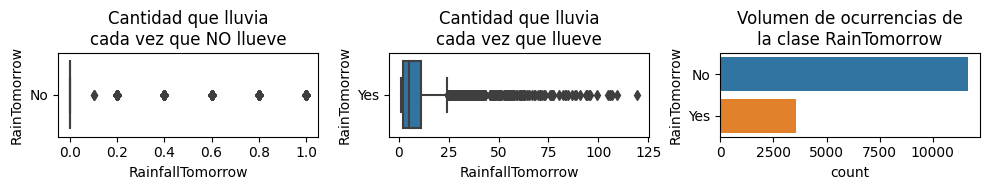

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,11643.0,0.073916,0.198571,0.0,0.0,0.0,0.0,1.0
Yes,3556.0,9.599663,12.787249,1.2,2.4,5.0,11.2,119.4


In [179]:
def plot_y(df):
  fig, axes = plt.subplots(1, 3, figsize=(10, 2))
  sns.boxplot(df[df['RainTomorrow'] == 'No'], x='RainfallTomorrow', y='RainTomorrow', ax=axes[0])
  sns.boxplot(df[df['RainTomorrow'] == 'Yes'], x='RainfallTomorrow', y='RainTomorrow', ax=axes[1])
  sns.barplot(x='count', y='RainTomorrow',ax=axes[2],
              data=df.groupby('RainTomorrow')['RainTomorrow'].count().reset_index(name='count'))

  axes[0].set_title('Cantidad que lluvia\ncada vez que NO llueve')
  axes[1].set_title('Cantidad que lluvia\ncada vez que llueve')
  axes[2].set_title("Volumen de ocurrencias de\nla clase RainTomorrow")

  plt.tight_layout()
  plt.show()

  return df.groupby("RainTomorrow")['RainfallTomorrow'].describe()
plot_y(df)

Variable dependiente $y$ a lo largo del tiempo

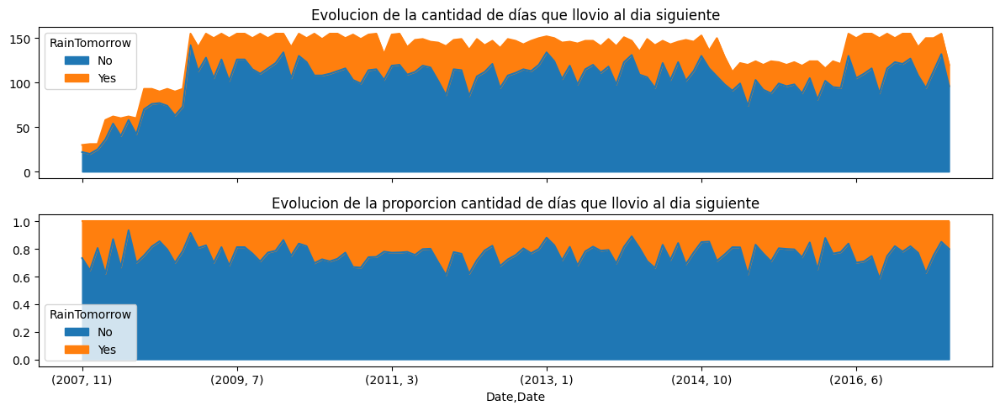

In [180]:
y_rain_evolution=df.groupby([df["Date"].dt.year, df["Date"].dt.month,'RainTomorrow'])['RainTomorrow'].count().unstack()

fig, axs = plt.subplots(2, 1, figsize=(12, 5), sharex=True)
y_rain_evolution.plot.area(ax=axs[0], title="Evolucion de la cantidad de días que llovio al dia siguiente")
y_rain_evolution.div(
    df.groupby([df["Date"].dt.year, df["Date"].dt.month])['RainTomorrow'].count(),axis=0
).plot.area(stacked=True,ax=axs[1],title="Evolucion de la proporcion cantidad de días que llovio al dia siguiente")
fig.tight_layout()

### Variables Independientes $X$
- Variables Cualitativas:
  - `Date` (Variable Temporal)
  - `Location` (**NO ESTUDIAREMOS ESTA VARIABLE**)
  - Dirección del viento: `WindGustDir`, `WindDir9am`, `WindDir3pm`
  - ¿LLueve el dia de hoy?: `RainToday`
- Variables Cuantitativas:
  - Temperatura: `MinTemp`, `MaxTemp`, `Temp3pm`, `Temp9am`
  - Velocidad del viento: `WindGustSpeed`, `WindSpeed9am`, `WindSpeed3pm`
  - Humedad: `Humidity9am`, `Humidity3pm`
  - Presion: `Pressure9am`, `Pressure3pm`
  - Nubocidad??: `Cloud9am`, `Cloud3pm`
  - `Rainfall`
  - `Evaporation`
  - `Sunshine`

#### Variables Cuantitativas

##### Variable Temporal `Date`
- Los datos observados corresponden al periodo `2007-11` - `2017-6`.
- El grueso de datos esta concentrado a partir del año `2009`.
- Existen meses completos faltantes `2011-4`, `2012-12` y `2013-2`.
- La cantidad maxima de filas por mes que podríamos encontrar oscila entre los **140** registros para febrero y 155 para aquellos con 31 días.
- Se puede observar el comportamiento ciclico de las variables cuantitativas.

In [181]:
# cantidad de días que tiene cada mes * cantidad de ubicaciones de interes
pd.date_range(start='2010',end='2011', freq='M').to_series(name="Registros totales por mes").dt.day*len(LOI)

2010-01-31    155
2010-02-28    140
2010-03-31    155
2010-04-30    150
2010-05-31    155
2010-06-30    150
2010-07-31    155
2010-08-31    155
2010-09-30    150
2010-10-31    155
2010-11-30    150
2010-12-31    155
Freq: M, Name: Registros totales por mes, dtype: int64

In [182]:
# Cantidad de registros disponibles para entrenar el modelo (que tiene valores $y$)
df_by_date=df.groupby([df["Date"].dt.month, df["Date"].dt.year], dropna=False)
df_by_date["Date"].count().unstack().style.background_gradient(cmap="viridis",axis=1)

Date,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Date,,,,,,,,,,,
1,nan,31.000000,155.000000,155.000000,155.000000,149.000000,152.000000,147.000000,129.000000,124.000000,155.000000
2,nan,58.000000,140.000000,140.000000,132.000000,137.000000,nan,135.000000,112.000000,116.000000,140.000000
3,nan,62.000000,155.000000,155.000000,154.000000,149.000000,150.000000,149.000000,122.000000,124.000000,150.000000
4,nan,60.000000,150.000000,150.000000,nan,142.000000,145.000000,142.000000,120.000000,121.000000,150.000000
5,nan,62.000000,155.000000,155.000000,155.000000,147.000000,146.000000,147.000000,124.000000,155.000000,155.000000
6,nan,60.000000,150.000000,149.000000,140.000000,139.000000,144.000000,143.000000,120.000000,150.000000,120.000000
7,nan,93.000000,155.000000,155.000000,148.000000,149.000000,147.000000,146.000000,124.000000,155.000000,nan
8,nan,93.000000,155.000000,155.000000,149.000000,147.000000,147.000000,148.000000,123.000000,155.000000,nan
9,nan,90.000000,150.000000,150.000000,146.000000,143.000000,141.000000,146.000000,120.000000,150.000000,nan


Creamos la columna "Month" para tener la selección disponible.

In [183]:
df["Month"]=pd.Categorical(df["Date"].dt.month, categories=sorted(df["Date"].dt.month.unique()), ordered=True)

Hacemos un análisis de cómo evolucionan las diferentes categorías a lo largo de los meses.

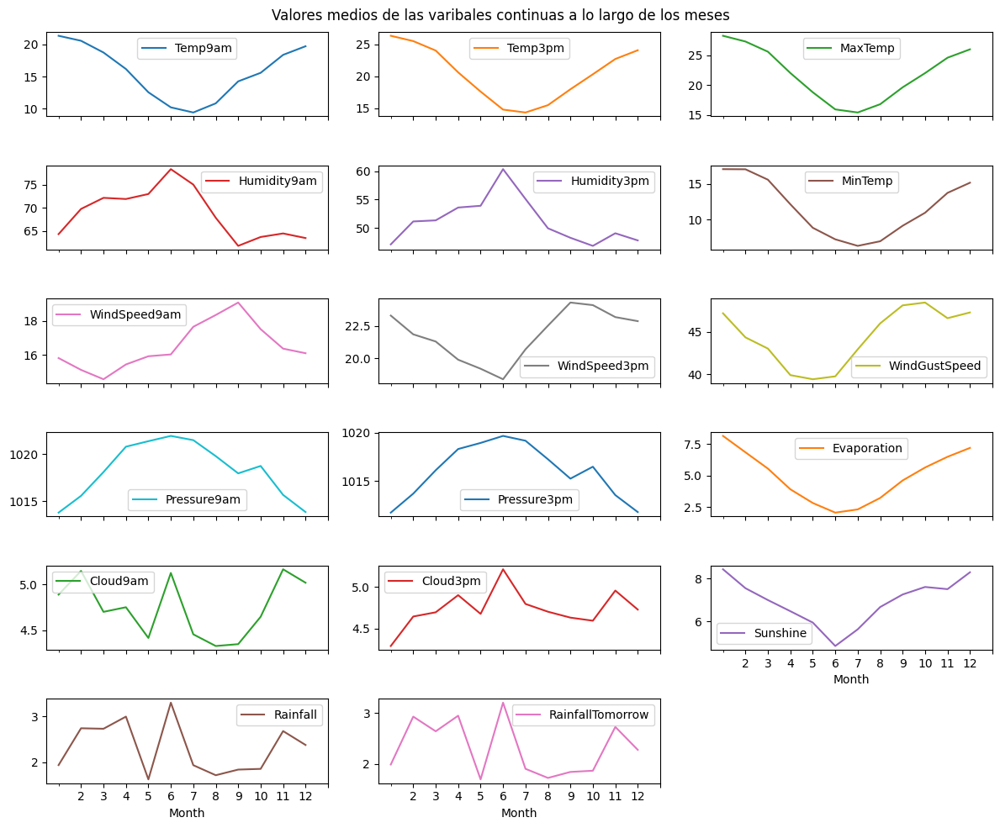

In [184]:
df.groupby(["Month"])[[
    'Temp9am',      'Temp3pm',          'MaxTemp',
    'Humidity9am',  'Humidity3pm',      'MinTemp',
    'WindSpeed9am', 'WindSpeed3pm',     'WindGustSpeed',
    'Pressure9am',  'Pressure3pm',      'Evaporation',
    'Cloud9am',     'Cloud3pm',         'Sunshine',
    'Rainfall',     'RainfallTomorrow'
]].mean().plot(
    title="Valores medios de las varibales continuas a lo largo de los meses",
    sharex=True, subplots=True,layout=(-1,3), figsize=(12,10), xticks=range(1,13))
plt.tight_layout()
plt.show()

##### `RainToday`
- 1% de datos faltantes (163 registros)
- Decidimos ignorar los valores faltantes dado que eran despreciables.

In [185]:
def plot_cate(df_aux,cols):
  cols_sort=df_aux[cols[0]].unique()
  fig,axs=plt.subplots(1,len(cols),sharey=True, figsize=(3*len(cols),5),sharex=True)
  for i,col in enumerate(cols):
    df_aux.value_counts(subset=col,dropna=False).reindex(cols_sort).plot.barh(ax=axs[i] if len(cols)>1 else axs, title=col)
  return df_aux[cols].describe()

,RainToday
count,15036
unique,2
top,No
freq,11541


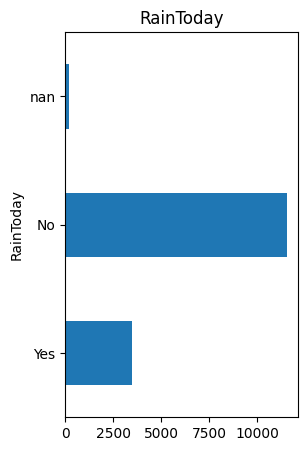

In [186]:
plot_cate(df, ["RainToday"])

In [187]:
df["RainToday"].isna().sum(), df["RainToday"].isna().sum()/df["RainToday"].count()

(163, 0.010840649108805533)

,count,mean,std,min,25%,50%,75%,max
No,113.0,102.132743,23.725929,19.0,96.0,108.0,117.0,142.0
Yes,113.0,30.929204,11.386644,4.0,24.0,30.0,42.0,60.0
nan,113.0,1.442478,1.875300,0.0,0.0,0.0,3.0,7.0


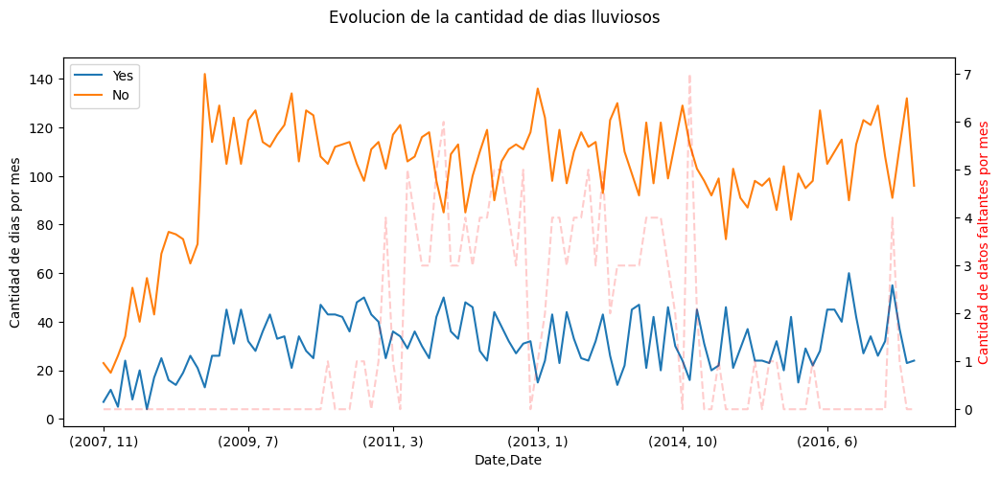

In [188]:
raintoday_na=df[["Date","RainToday"]].groupby([df["Date"].dt.year, df["Date"].dt.month,"RainToday"],dropna=False)\
.count().unstack().fillna(0)
raintoday_na.columns=raintoday_na.columns.map(lambda v: str(v[1]))

fig, ax1 = plt.subplots(figsize=(12,5))
fig.suptitle("Evolucion de la cantidad de dias lluviosos")
r_unique=df["RainToday"].unique()
raintoday_na[r_unique[~pd.isna(r_unique)]].plot(ax=ax1)
ax1.set_ylabel('Cantidad de dias por mes')
if pd.isna(r_unique).any():
  ax2 = ax1.twinx()
  raintoday_na['nan'].plot(ax=ax2, color='r', linestyle='--', alpha=0.2)
  ax2.set_ylabel('Cantidad de datos faltantes por mes', color='r')
raintoday_na.describe().T

###### Inferimos los datos faltanes
(Intento infructuoso de completar los datos faltantes de RainToday a partir de RainTomorrow)



In [189]:
estado_inicial=df.groupby(["Location"])[["RainToday","RainTomorrow"]].count()
estado_inicial

,RainToday,RainTomorrow
Location,,
Canberra,3401,3417
Melbourne,2297,2434
MelbourneAirport,3008,3008
Sydney,3330,3336
SydneyAirport,3000,3004


In [190]:
# creamos un dataset original donde le agregamos la fecha del dia siguiente
df_aux=df.copy().assign(Date_Tomorrow=lambda x: x["Date"]+pd.Timedelta(days=1))

In [191]:
# existen diferencias lo cual nos hace pensar que podría usarse para compeltar faltantes.
df_aux[(df_aux["Location"]=="Canberra")].groupby([df_aux["Date_Tomorrow"].dt.day])["RainfallTomorrow"].sum().compare(
df_aux[(df_aux["Location"]=="Canberra")].groupby([df_aux["Date"].dt.day])["Rainfall"].sum())

,self,other
5,264.8,263.6
7,142.4,135.4
20,183.0,148.2
31,126.0,118.4


In [192]:
def search_date(dt,l,df_,col):
  value_mask=(df_["Location"]==l)&(df_["Date_Tomorrow"]==dt)
  # print(l, dt)
  if not value_mask.any():
    return np.nan

  return df_[value_mask][col].values[0]


d_temp=df.copy()
for l in LOI:
  for c in ["RainToday","RainTomorrow"]:
    df_mask=(d_temp["Location"]==l)&(d_temp[c].isna())
    d_temp.loc[df_mask,c]=d_temp[df_mask]['Date'].apply(search_date, args=(l,df_aux,c))
d_temp.groupby(["Location"])[["RainToday","RainTomorrow"]].count().compare(estado_inicial)

Location


In [193]:
# Encontramos que las filas correspondientes también estaban faltantes.
((df["Location"]=="Melbourne")&(df["Date"]=="2014-11-25")).any(),((df["Location"]=="Melbourne")&(df["Date"]=="2014-11-24")).any()

(True, False)

##### `WindGustDir`,	`WindDir9am`,	`WindDir3pm`
Encontramos que posee una cantidad significativa de valores faltantes:
- `WindGustDir`: 10%
- `WindDir9am`: 5%
- `WindDir3pm`: 1%

De todos modos, al analizar los valores más significativos para la predicción, encontramos que podíamos obviar estos.

In [194]:
wind_dir_cols=["WindGustDir",	"WindDir9am",	"WindDir3pm"]
df[wind_dir_cols].isna().sum()/df[wind_dir_cols].count()

WindGustDir    0.105060
WindDir9am     0.046691
WindDir3pm     0.019383
dtype: float64

,WindGustDir,WindDir9am,WindDir3pm
count,13754,14521,14910
unique,16,16,16
top,N,N,S
freq,1983,2311,1860


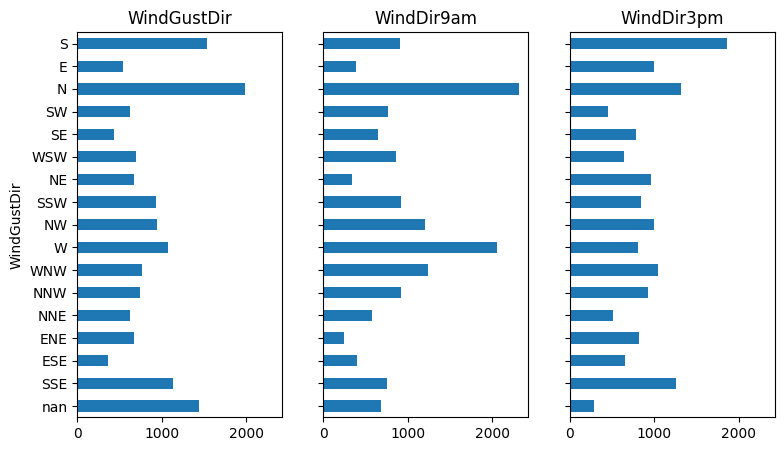

In [195]:
plot_cate(df, wind_dir_cols)

#### Variables Cuantitativas
Resumen variables relevantes a la predicción:
- $TEMPERATURA$: Dado que tenían una alta correlación decidimos seleccionar las más relevantes y usar las otras para completar valores faltantes.
- $VIENTO$: Dado que comprobamos que `WindGustSpeed` es el valor más relevante (a través de **Lasso**), usaremos valores de `WindSpeed9am`,`WindSpeed3pm` para inferir datos faltantes en `WindGustSpeed`.
- $HUMEDAD$: Los valores faltantes de esta variable eran totalmente despreciables en cuanto a la totalidad de las entradas.
- $PRESIÓN$: Al intentar recuperar los valores faltantes de presión nos encontramos con dificultades que nos llevaban a tener una predicción menos exacta, de todas maneras los valores eran pocos así que preferimos dejarlos sin tratar.
- $SOL$: En este caso los valores faltantes representaban un 15% del total, por lo cual usamos el promedio correspondiente al mismo de la entrada faltante para completar los datos, esto tomando en cuenta si coincidía con un día en el que había llovido o no.


Funciones en común que usaremos para describir las variables cuantitativas.

In [196]:
def cuanti_describe(df, cols):
    """
    Realiza un describe clasico de las variables y agrega otras filas como:
    - std_rel: desv std relativa
    - var_rel: varianza relativa
    - nan_total: cantidad de ratos faltantes
    - nan_rel: relación de datos faltantes sobre el total
    """
    aux = df[cols].describe().T
    aux["std_rel"]  = aux["std"] / aux["mean"]
    aux["var_rel"]  = df[cols].var() / aux["mean"]
    aux["nan_total"]= df[cols].isna().sum()
    aux["nan_rel"]  = df[cols].isna().sum() / df[cols].count()
    return aux


# Función Generica para estudiar las variables cuantitativas
def plot_group(df_aux, cols: list[str], same_range=True, xscale="linear", stratified=False):
    """
    Grafica en forma simultanea un histograma y un diagrama caja y bigotes de las columnas especificadas.
    Tambien, permite estratificar estdos dos graficos por la variable cualitativa `RainToday`.
    """
    n_cols = len(cols)
    df_aux = df_aux[cols + ["RainToday"]]
    fig    = plt.figure(figsize=(4.25 * n_cols, 5))
    gs     = GridSpec(nrows=2, ncols=n_cols, height_ratios=[n_cols, 1])
    axs    = [fig.add_subplot(gs[i, j % n_cols]) for i in range(2) for j in range(n_cols)]

    for i, col in enumerate(cols):
        if stratified:
            df_aux[df_aux["RainToday"] == "No"][col].plot(
                kind="hist",    ax=axs[i],
                alpha=0.6,      label="RainToday: No",
                bins=50,        color="tab:orange")
            df_aux[df_aux["RainToday"] == "Yes"][col].plot(
                kind="hist",    ax=axs[i],
                alpha=0.9,      label="RainToday: Yes",
                bins=50,        color="tab:blue")
        else:
            df_aux[col].plot(kind="hist", ax=axs[i], bins=50)
        axs[i].set_title(col)
        axs[i].set_ylabel("Frecuencia")
        axs[i].legend()

        df_aux.plot.box(
            by="RainToday" if stratified else None,
            column=col,         vert=False,
            ax=axs[i + n_cols], showmeans=True,
            title=None)

    if same_range:
        [ax.set_xscale(xscale) for ax in axs]
        x_min_max_lim = (0.9 * df_aux.min(numeric_only=True).min(), 1.1 * df_aux.max(numeric_only=True).max())
        [ax.set_xlim(*x_min_max_lim) for ax in axs]
    else:
        for j, col_name in enumerate(df_aux):
            [axs[n_cols * i + j].set_xscale(xscale) for i in range(2)]
            x_min_max_lim = (
                0.9 * df_aux[col_name].min(numeric_only=True).min(),
                1.1 * df_aux[col_name].max(numeric_only=True).max(),
            )
            [axs[n_cols * i + j].set_xlim(*x_min_max_lim) for i in range(2)]

    fig.tight_layout()
    fig.show()


def plot_mean_evol(df, cols: list[str], title: str, ylabel: str):
    """
    Grafica la evolucion temporal en forma simultanea de las columas listadas.
    """
    aux_groupped = df[["Date"] + cols].groupby([df["Date"].dt.year, df["Date"].dt.month]).mean(numeric_only=True)
    aux_groupped.plot(figsize=(12, 5), title=title)
    plt.ylabel(ylabel)
    plt.xlabel("Date")
    plt.tight_layout()
    plt.show()
    return aux_groupped.describe().T

##### `MinTemp`,`MaxTemp`,`Temp9am`,`Temp3pm`
- Todas tienen un comportamiento normal.
- Se completan datos faltantes vinculando las minimas temperaturas con las de las 9 AM y las maximas con las de 3 PM

In [197]:
temp_cols=['MinTemp','Temp9am','Temp3pm','MaxTemp']
cuanti_describe(df,temp_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
MinTemp,15189.0,11.606057,5.877294,-8.0,7.9,11.6,15.9,30.5,0.506399,2.976255,10,0.000658
Temp9am,15175.0,15.570662,5.570913,-1.3,11.6,15.4,19.6,37.2,0.357783,1.993176,24,0.001582
Temp3pm,15183.0,20.260304,5.858891,3.7,16.0,19.8,24.2,46.1,0.289181,1.694279,16,0.001054
MaxTemp,15193.0,21.784203,6.055148,4.1,17.2,21.3,25.8,46.8,0.277961,1.683092,6,0.000395


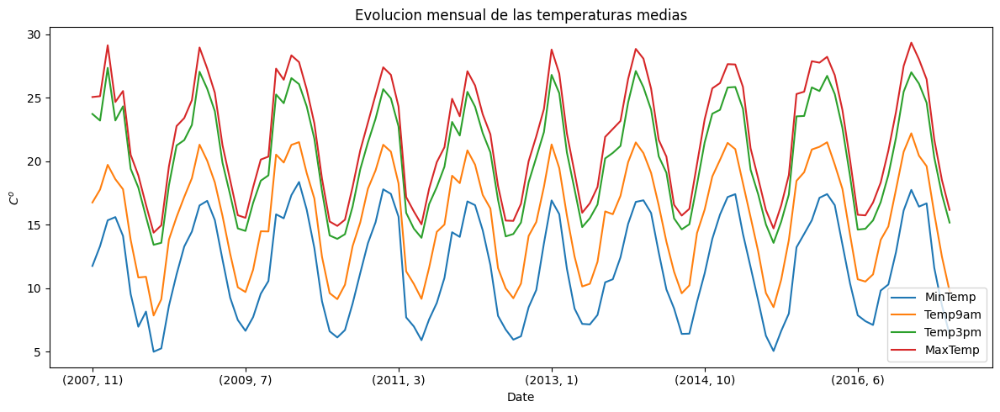

,count,mean,std,min,25%,50%,75%,max
MinTemp,113.0,11.619841,3.934895,5.000000,7.895918,11.532414,15.359355,18.364748
Temp9am,113.0,15.595533,4.097724,7.854839,11.586395,15.827517,19.132773,22.198065
Temp3pm,113.0,20.356720,4.237532,13.419355,16.624161,20.380282,24.129508,27.348387
MaxTemp,113.0,21.876116,4.497718,14.375269,17.974830,21.965306,25.737500,29.334839


In [198]:
plot_mean_evol(df, cols=temp_cols,title="Evolucion mensual de las temperaturas medias", ylabel="$C^o$")

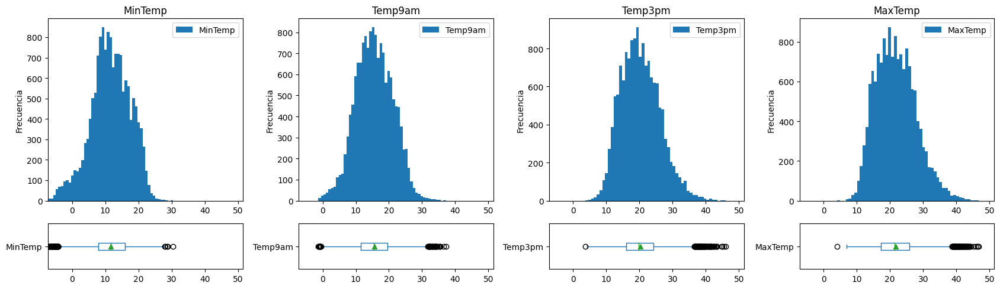

In [199]:
plot_group(df,temp_cols)

Observamos la correlatividad de las variables de temperatura, en base a esto empezamos a vislumbrar que podríamos reducir algunas de estas variables en favor de otras.

In [200]:
df[temp_cols].corr().style.background_gradient(cmap="viridis", axis=None, vmin=0)

,MinTemp,Temp9am,Temp3pm,MaxTemp
MinTemp,1.000000,0.904726,0.655332,0.681959
Temp9am,0.904726,1.000000,0.819627,0.851056
Temp3pm,0.655332,0.819627,1.000000,0.977000
MaxTemp,0.681959,0.851056,0.977000,1.000000


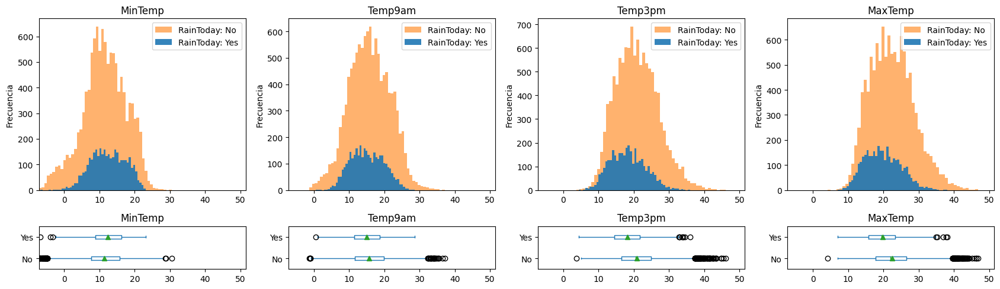

In [201]:
_=plot_group(df,temp_cols,stratified=True)

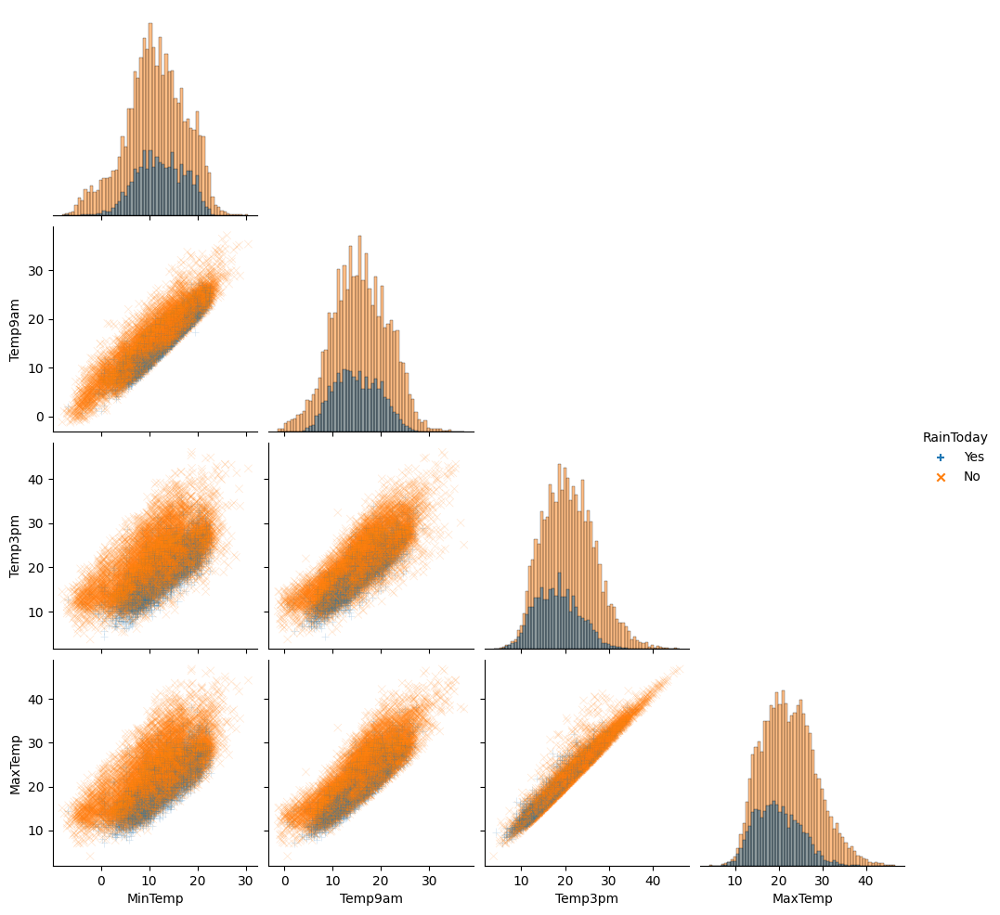

In [202]:
sns.pairplot(data=df,vars=temp_cols,diag_kind="hist", hue="RainToday", corner=True,markers=["+","x"], plot_kws={'alpha': 0.2})

In [203]:
df.groupby("RainToday")[temp_cols].corr().style.background_gradient(cmap="viridis", axis=None, vmin=0)

##### `WindGustSpeed`,`WindSpeed9am`,`WindSpeed3pm`
- Todas tienen un comportamiento normal.
- Faltan el 10% de los datos de `WindGustSpeed`
- Dado que comprobamos que `WindGustSpeed` es el valor más relevante (a través de **Lasso**), usaremos valores de `WindSpeed9am`,`WindSpeed3pm` para inferir datos faltantes en `WindGustSpeed`.

In [204]:
wind_cols=['WindGustSpeed','WindSpeed9am','WindSpeed3pm']
cuanti_describe(df,wind_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
WindGustSpeed,13756.0,44.323786,14.952565,11.0,33.0,43.0,54.0,122.0,0.337349,5.044226,1443,0.104900
WindSpeed9am,14939.0,16.479617,10.282170,0.0,9.0,15.0,22.0,69.0,0.623933,6.415381,260,0.017404
WindSpeed3pm,14950.0,21.746622,9.529054,0.0,15.0,20.0,28.0,76.0,0.438185,4.175493,249,0.016656


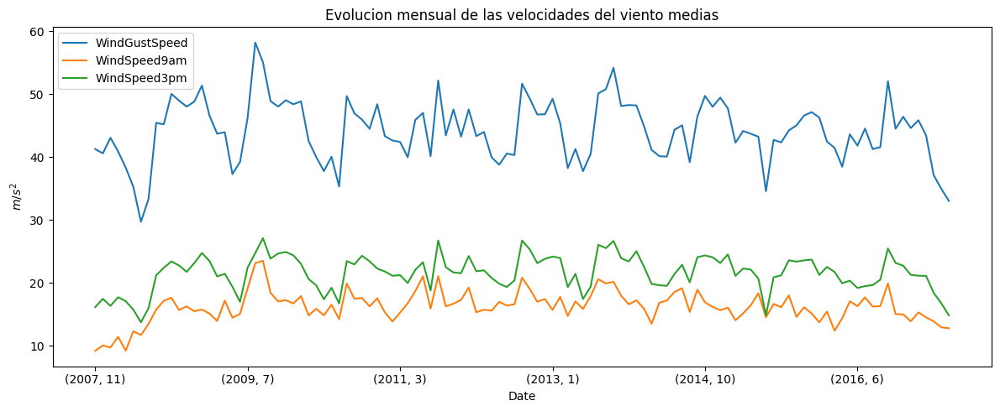

,count,mean,std,min,25%,50%,75%,max
WindGustSpeed,113.0,44.152689,4.890630,29.700000,40.896552,44.222222,47.740157,58.206522
WindSpeed9am,113.0,16.204235,2.512457,9.166667,15.013333,16.241611,17.468531,23.504202
WindSpeed3pm,113.0,21.531589,2.815200,13.725806,19.812081,21.738636,23.457143,27.100000


In [205]:
plot_mean_evol(df, cols=wind_cols,title="Evolucion mensual de las velocidades del viento medias", ylabel="$m/s^2$")

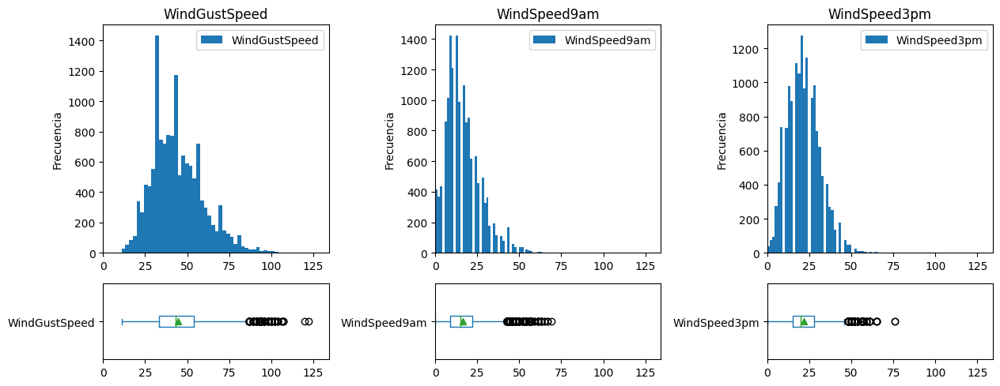

In [206]:
plot_group(df,wind_cols)

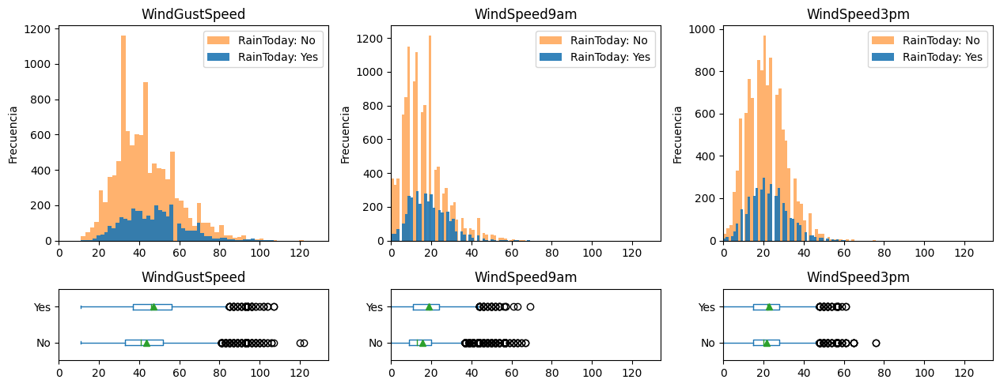

In [207]:
plot_group(df,wind_cols,stratified=True)

In [208]:
df['WindGustSpeed'].fillna(df[['WindSpeed9am','WindSpeed3pm']].max(axis=1), inplace=True)

##### `Humidity9am`,`Humidity3pm`

In [209]:
humidity_cols=['Humidity9am','Humidity3pm']
cuanti_describe(df,humidity_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Humidity9am,15111.0,68.884918,15.645965,11.0,59.0,70.0,80.0,100.0,0.227132,3.553698,88,0.005824
Humidity3pm,15154.0,51.238683,17.735612,3.0,39.0,51.0,62.0,100.0,0.346137,6.138955,45,0.002970


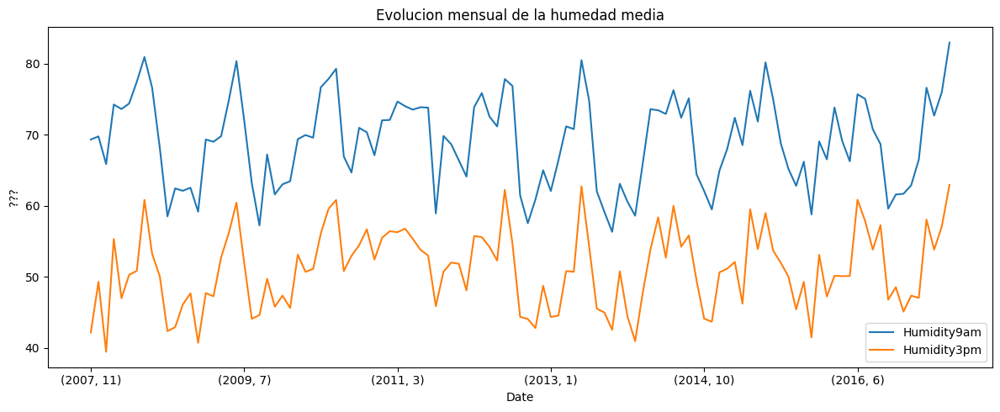

,count,mean,std,min,25%,50%,75%,max
Humidity9am,113.0,69.032917,6.261801,56.335570,63.461039,69.335714,73.882759,82.975000
Humidity3pm,113.0,51.055736,5.491511,39.451613,46.983871,50.806897,54.671141,62.941667


In [210]:
plot_mean_evol(df, cols=humidity_cols,
  title="Evolucion mensual de la humedad media", ylabel="???")

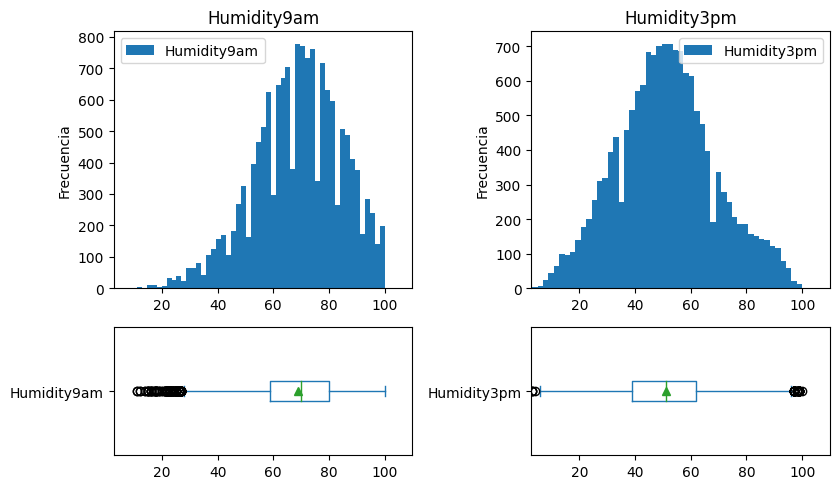

In [211]:
plot_group(df,humidity_cols)

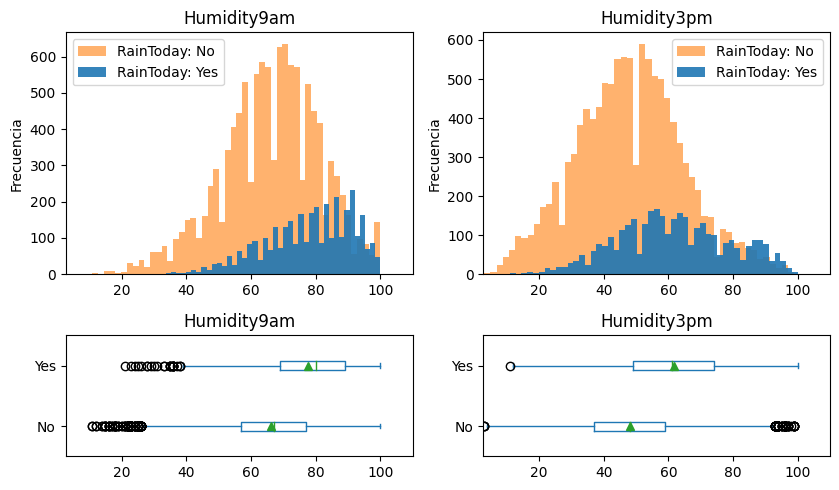

In [212]:
plot_group(df,humidity_cols,stratified=True)

##### `Pressure9am`,`Pressure3pm`
- Se intento recuperar los datos faltantes pero se observó que el modelo es muy sensible a la presión.

In [213]:
pressure_cols=['Pressure9am','Pressure3pm']
cuanti_describe(df,pressure_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Pressure9am,14946.0,1018.334022,7.398337,986.7,1013.4,1018.5,1023.3,1040.6,0.007265,0.053750,253,0.016928
Pressure3pm,14954.0,1016.079898,7.264708,985.5,1011.2,1016.3,1021.0,1037.9,0.007150,0.051941,245,0.016384


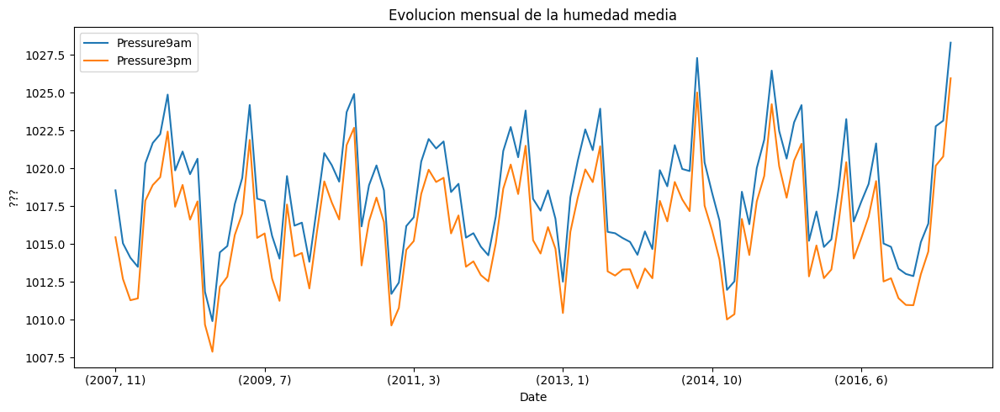

,count,mean,std,min,25%,50%,75%,max
Pressure9am,113.0,1018.336113,3.718494,1009.908602,1015.402685,1018.437671,1021.009091,1028.305833
Pressure3pm,113.0,1016.059822,3.616000,1007.888172,1013.198639,1015.809333,1018.655634,1025.951667


In [214]:
plot_mean_evol(df, cols=pressure_cols,title="Evolucion mensual de la humedad media", ylabel="???")

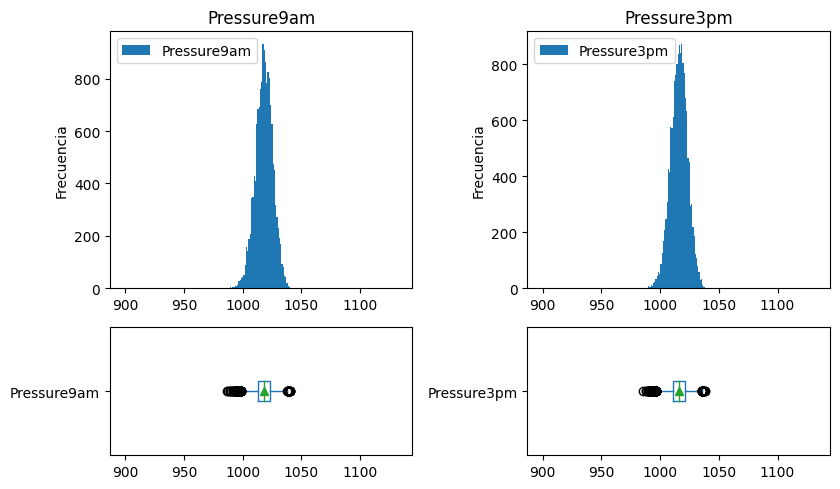

In [215]:
plot_group(df,pressure_cols)

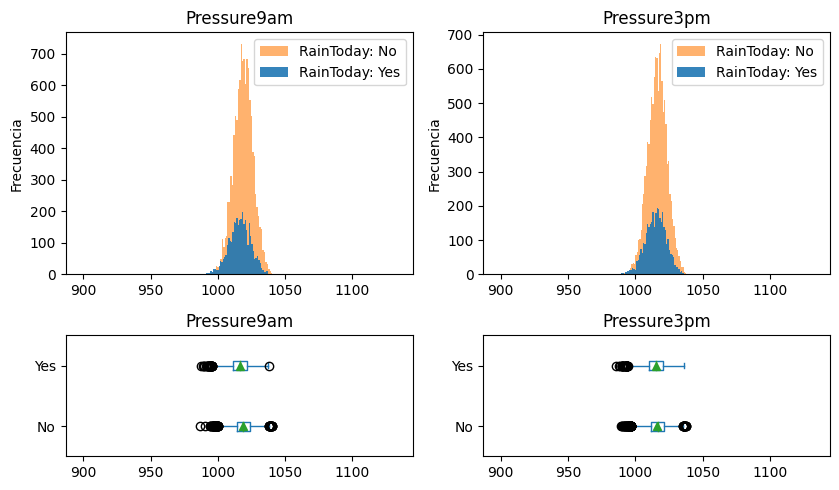

In [216]:
plot_group(df,pressure_cols,stratified=True)

###### Intento de completado de datos
Este intento fue finalmente descartado dado que resultó en métricas peores en la predicción.

In [217]:
df_press=df.copy()
pressure_9am_groupped=df_press.groupby(["Month","RainToday"])['Pressure9am'].mean()
pressure_3pm_groupped=df_press.groupby(["Month","RainToday"])['Pressure3pm'].mean()
distancias_presion_9am_a_3pm=pressure_9am_groupped.sub(pressure_3pm_groupped).unstack()
distancias_presion_9am_a_3pm

RainToday,No,Yes
Month,,
1,2.305842,0.852743
2,2.118246,1.064583
3,2.157239,1.408989
4,2.768015,1.700647
5,2.701969,1.297656
6,2.540435,1.580110
7,2.666777,1.240825
8,2.879390,1.346540
9,3.113397,1.250963


In [218]:
mask_fill_pre=(~df_press['Pressure9am'].isna())&(df_press['Pressure3pm'].isna())
for c in ["Yes","No"]:
  mask=mask_fill_pre&(df_press['RainToday']==c)
  df_press.loc[mask,'Pressure3pm']=df_press[mask].apply(lambda s: s["Pressure9am"]-distancias_presion_9am_a_3pm.loc[s["Month"],c],axis=1)

mask_fill_pre=(df_press['Pressure9am'].isna())&(~df_press['Pressure3pm'].isna())
for c in ["Yes","No"]:
  mask=mask_fill_pre&(df_press['RainToday']==c)
  df_press.loc[mask,'Pressure9am']=df_press[mask].apply(lambda s: s["Pressure3pm"]+distancias_presion_9am_a_3pm.loc[s["Month"],c],axis=1)

mask_fill_pre=(df_press['Pressure9am'].isna())&(df_press['Pressure3pm'].isna())
for c in ["Yes","No"]:
  mask=mask_fill_pre&(df_press['RainToday']==c)
  df_press.loc[mask,'Pressure9am']=df_press[mask].apply(lambda s: pressure_9am_groupped.loc[s["Month"],c],axis=1)
  df_press.loc[mask,'Pressure3pm']=df_press[mask].apply(lambda s: pressure_3pm_groupped.loc[s["Month"],c],axis=1)

In [219]:
cuanti_describe(df_press,pressure_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Pressure9am,15198.0,1018.307378,7.352039,986.7,1013.5,1018.5,1023.2,1040.6,0.007220,0.053081,1,0.000066
Pressure3pm,15198.0,1016.054928,7.217455,985.5,1011.3,1016.2,1021.0,1037.9,0.007103,0.051269,1,0.000066


##### `Cloud9am`,`Cloud3pm`
- Faltan ~16% de los datos de `Cloud9am`,`Cloud3pm`

In [220]:
cloud_cols=['Cloud9am','Cloud3pm']
cuanti_describe(df,cloud_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Cloud9am,13158.0,4.738486,2.731410,0.0,2.0,6.0,7.0,9.0,0.576431,1.574469,2041,0.155115
Cloud3pm,12917.0,4.735852,2.593568,0.0,2.0,6.0,7.0,8.0,0.547646,1.420356,2282,0.176666


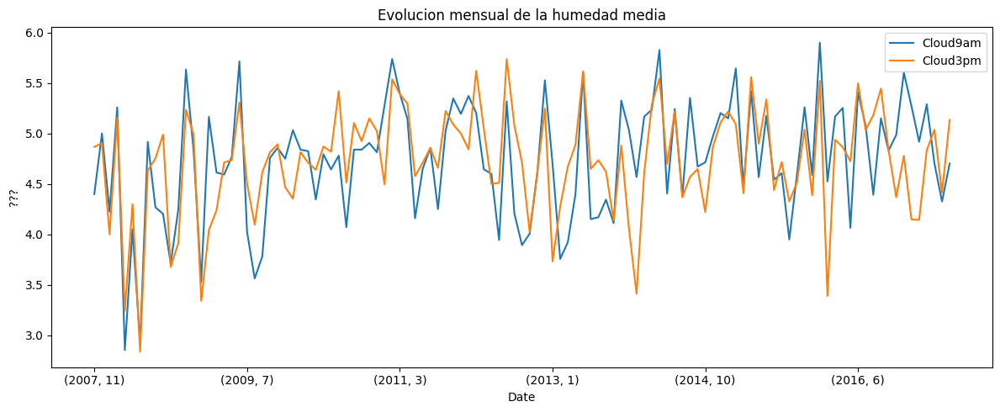

,count,mean,std,min,25%,50%,75%,max
Cloud9am,113.0,4.730324,0.584255,2.854839,4.346667,4.767742,5.174757,5.899083
Cloud3pm,113.0,4.720414,0.534223,2.838710,4.467742,4.752688,5.079365,5.736264


In [221]:
plot_mean_evol(df, cols=cloud_cols,
  title="Evolucion mensual de la humedad media", ylabel="???")

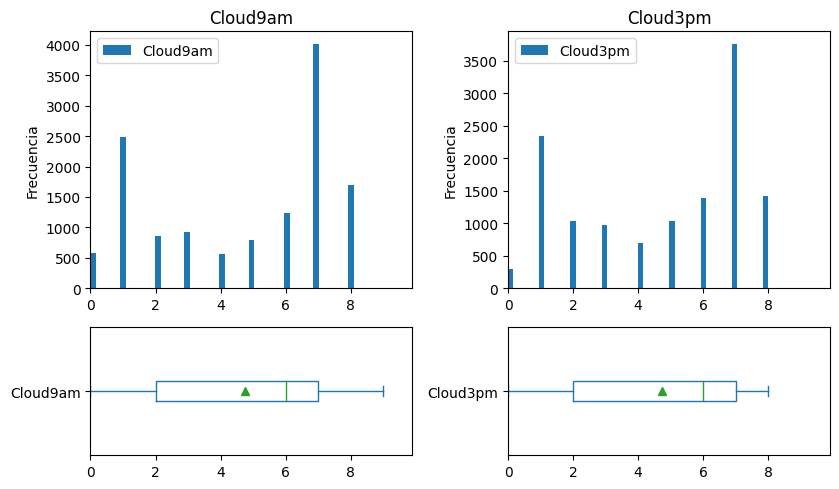

In [222]:
plot_group(df,cloud_cols)

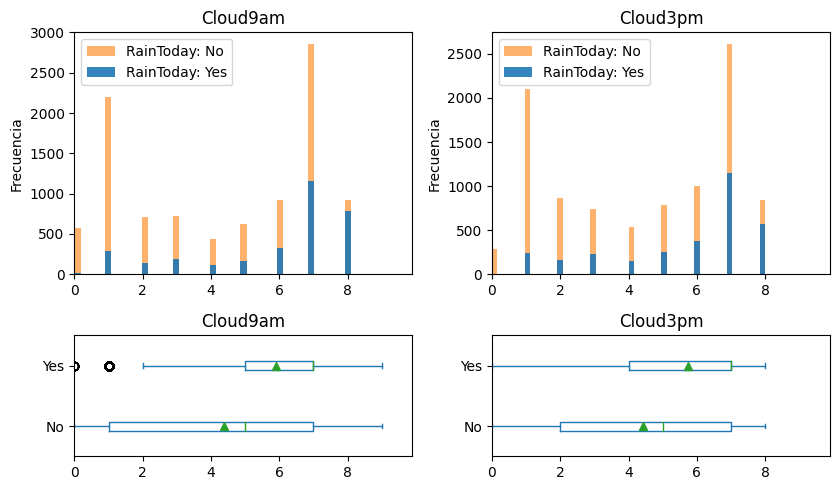

In [223]:
plot_group(df,cloud_cols,stratified=True)

##### `Rainfall`

In [224]:
rainfall_cols=['Rainfall']
cuanti_describe(df,rainfall_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Rainfall,15036.0,2.299601,7.404618,0.0,0.0,0.0,0.8,119.4,3.219958,23.842557,163,0.010841


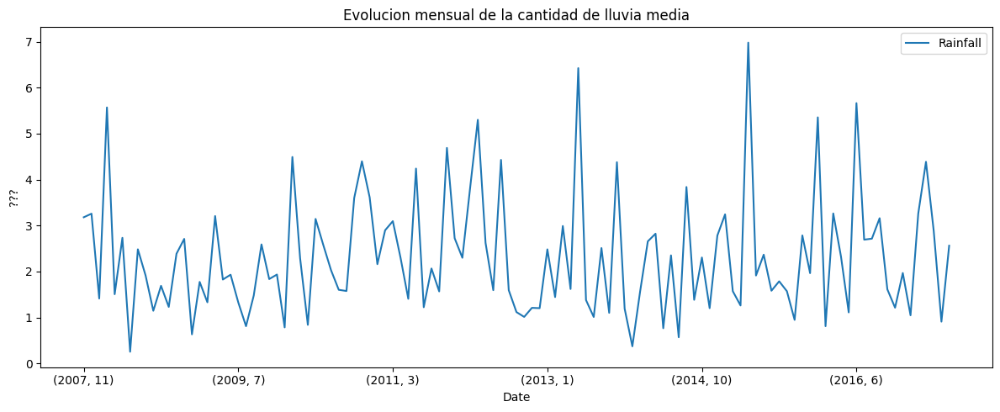

,count,mean,std,min,25%,50%,75%,max
Rainfall,113.0,2.316036,1.314149,0.254839,1.379021,1.967742,2.887248,6.978333


In [225]:
plot_mean_evol(df, cols=rainfall_cols,title="Evolucion mensual de la cantidad de lluvia media", ylabel="???")

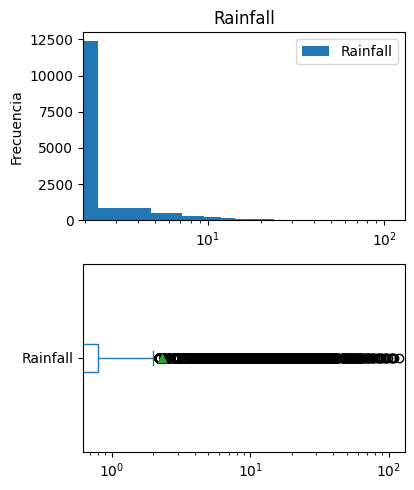

In [226]:
plot_group(df,rainfall_cols,  xscale='log')

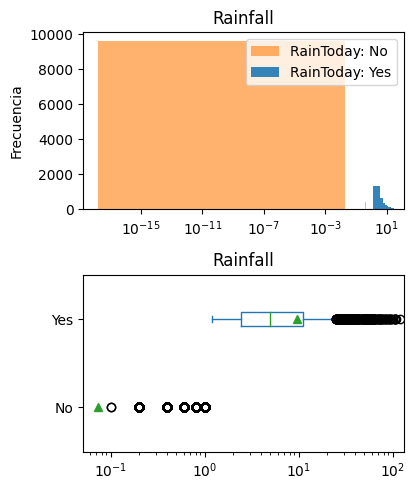

In [227]:
plot_group(df,rainfall_cols,stratified=True,  xscale='log')

##### `Evaporation`
- Falta el 12% de los datos de evaporacion

In [228]:
evaporation_cols=['Evaporation']
cuanti_describe(df,evaporation_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Evaporation,13505.0,4.869108,3.057514,0.0,2.6,4.2,6.6,23.8,0.627941,1.91994,1694,0.125435


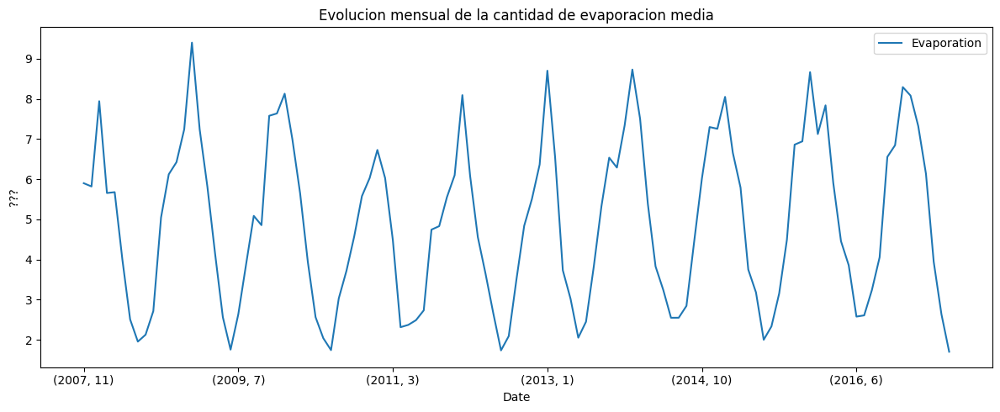

,count,mean,std,min,25%,50%,75%,max
Evaporation,113.0,4.9181,2.052668,1.704167,3.022069,4.840441,6.549664,9.4


In [229]:
plot_mean_evol(df, cols=evaporation_cols,title="Evolucion mensual de la cantidad de evaporacion media", ylabel="???")

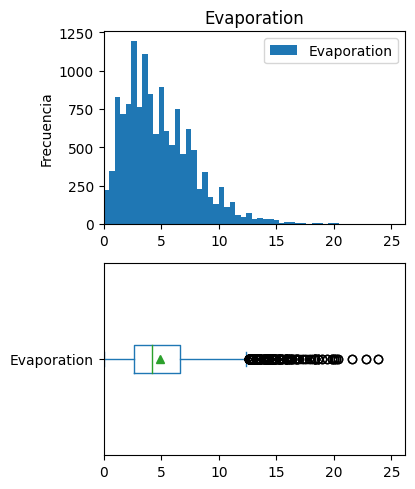

In [230]:
plot_group(df,evaporation_cols)

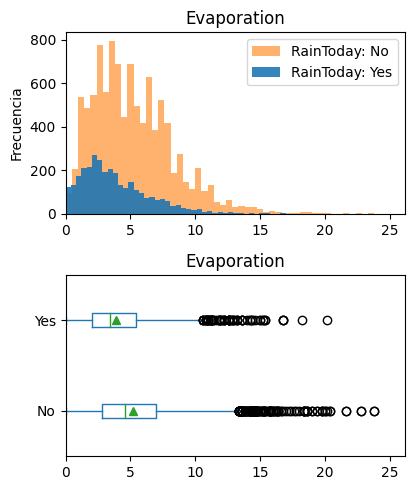

In [231]:
plot_group(df,evaporation_cols,stratified=True)

##### `Sunshine`
- Se completan la totalidad de los valores falantes sobre esta variable que representaban  el 15%.

In [232]:
sunshine_cols=['Sunshine']
cuanti_describe(df,sunshine_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Sunshine,13260.0,6.89727,3.836702,0.0,3.8,7.6,10.0,13.9,0.556264,2.134219,1939,0.146229


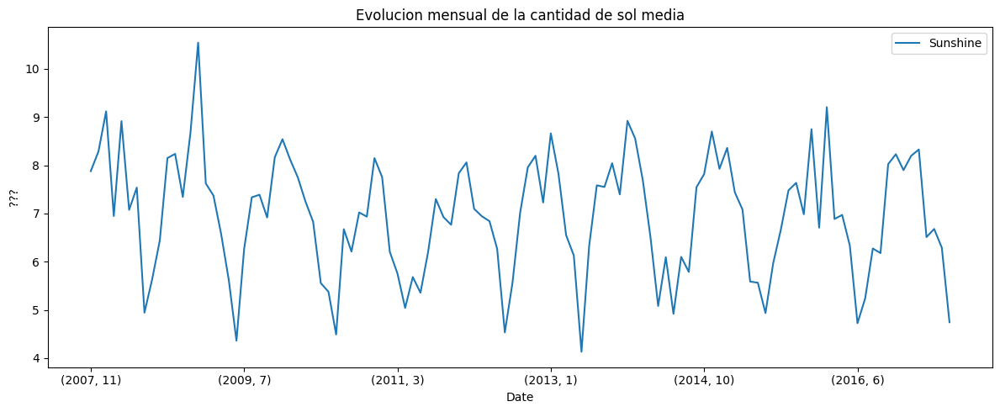

,count,mean,std,min,25%,50%,75%,max
Sunshine,113.0,6.960903,1.230447,4.133333,6.205385,6.985057,7.88,10.544516


In [233]:
plot_mean_evol(df, cols=sunshine_cols,title="Evolucion mensual de la cantidad de sol media", ylabel="???")

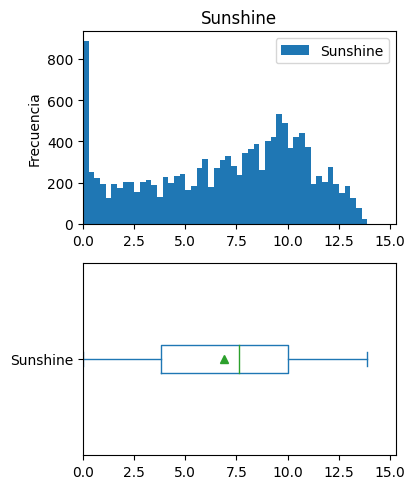

In [234]:
plot_group(df,sunshine_cols)

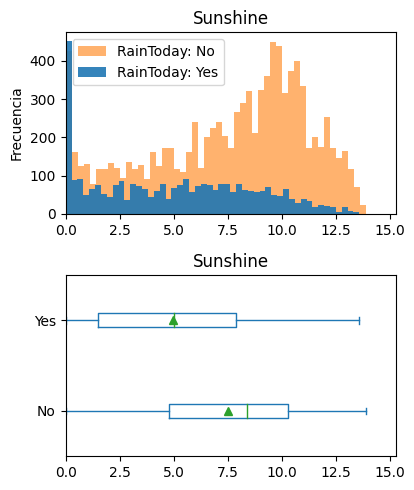

In [235]:
plot_group(df,sunshine_cols,stratified=True)

###### Completamos datos falantes en Sunshine
Podemos observar que para determinar la cantidad de sol era importante conocer si habia o no llovido y el mes en el que se encontraba. En funcion de esos dos parametros, completados los datos faltantes.

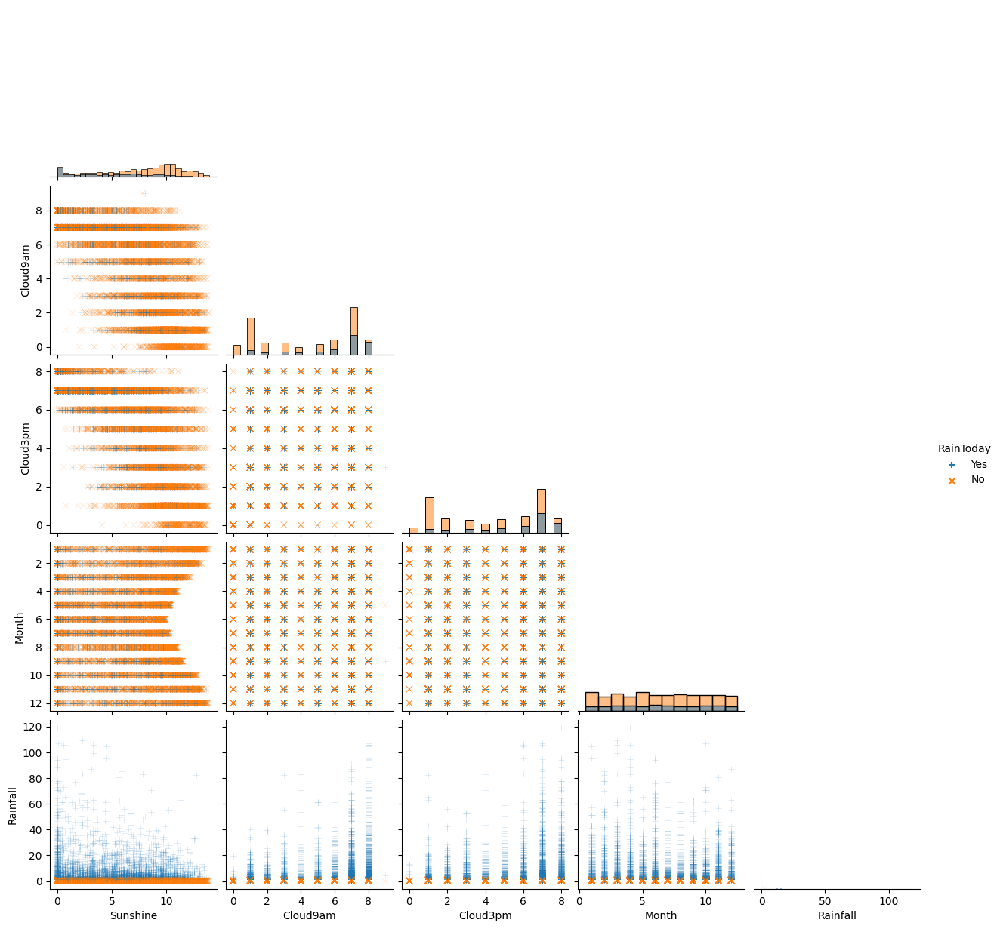

In [236]:
sns.pairplot(data=df,vars=sunshine_cols+cloud_cols+["Month","Rainfall"],diag_kind="hist", hue="RainToday", corner=True,markers=["+","x"], plot_kws={'alpha': 0.2})

In [237]:
promedio_sunshine_rain_yes = df[df["RainToday"] == "Yes"].groupby(df["Date"].dt.month)["Sunshine"].mean()
promedio_sunshine_rain_no = df[df["RainToday"] == "No"].groupby(df["Date"].dt.month)["Sunshine"].mean()

for index, row in df.iterrows():
    if pd.isna(row["Sunshine"]):
        mes = row["Date"].month
        if row["RainToday"] == "Yes":
            promedio_mes = promedio_sunshine_rain_yes.get(mes)
        elif row["RainToday"] == "No":
            promedio_mes = promedio_sunshine_rain_no.get(mes)
        if promedio_mes is not None:
            df.at[index, "Sunshine"] = promedio_mes

cuanti_describe(df,sunshine_cols)

,count,mean,std,min,25%,50%,75%,max,std_rel,var_rel,nan_total,nan_rel
Sunshine,15199.0,6.932003,3.620907,0.0,4.4,7.6,9.7,13.9,0.522346,1.891368,0,0.0


### Valores Faltantes en $X$
Luego de haber explorado las variables independientes, y tratado de completar los valores falantes con distintas estrategias, este es el resultado final de los mismos.

In [238]:
"""
Proporcion de datos faltantes entre los datos existentes por mes:
Muestra la cantidad relativa de datos faltantes sobre el total de datos totales
que deberia haber en funcion de la cantidad de filas presentes en ese mes.
Ej:
 - No existen datos faltantes en Novimebre y Diciembre de 2007, es decir, todas
    las filas estan completas con datos.
 - De la cantidad de filas existentes en Enero del 2010, la cantidad de datos
    faltantes corresponde al 9% del total.
 - el `nan` corresponde a lo no existencia de filas en el dataset para el mes y
    año correspondiente, es decir, no existen datos de abril 2011, diciembre 2012
    y febrero 2013 en el dataset.
"""
df_by_date=df.groupby([df["Date"].dt.month, df["Date"].dt.year], dropna=False)
(1-df_by_date.count().sum(axis=1).div(df_by_date["Date"].count()*df.shape[1]))\
.unstack().style.background_gradient(cmap="viridis",axis=None)

Date,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Date,,,,,,,,,,,
1,nan,0.000000,0.008516,0.095742,0.029935,0.039195,0.021579,0.029932,0.022636,0.019032,0.017032
2,nan,0.024138,0.010571,0.093714,0.025455,0.028321,nan,0.024296,0.018929,0.022414,0.018000
3,nan,0.024516,0.011613,0.011871,0.027273,0.027114,0.015200,0.020940,0.025246,0.021613,0.027200
4,nan,0.022667,0.012267,0.009600,nan,0.029859,0.015724,0.023944,0.019333,0.025785,0.018933
5,nan,0.025806,0.018065,0.012387,0.030710,0.032925,0.015342,0.027483,0.024194,0.021419,0.019613
6,nan,0.022667,0.010400,0.016644,0.030286,0.032230,0.025278,0.025455,0.028667,0.018133,0.018667
7,nan,0.019785,0.010065,0.013935,0.034054,0.021745,0.019864,0.025205,0.027097,0.016516,nan
8,nan,0.015914,0.088258,0.014194,0.031946,0.016327,0.022585,0.025676,0.020163,0.019097,nan
9,nan,0.014667,0.089867,0.021867,0.035616,0.020140,0.026099,0.023562,0.023333,0.013600,nan


In [239]:
# Validamos algunos datos sean verdaderos - en 2007, Nov y Dic no hay datos faltantes
df[(df["Date"].dt.year==2007)].isna().any(axis=None)

False

In [240]:
r_loi=df_by_date.count().sub(df_by_date["Date"].count(), axis=0).abs()
r_loi['date'] = r_loi.index.map(lambda x: f"{x[1]}-{x[0]}")
r_loi.set_index('date', inplace=True)
fig=px.bar(r_loi)
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Total")
fig.update_layout(barmode="stack",
    title_text="Cantidad de valores faltantes por variable explicativa a lo largo del tiempo")
fig.show()

<Axes: title={'center': 'Comparativa de la proporción de datos faltantes totales por cada variable explicativa'}>

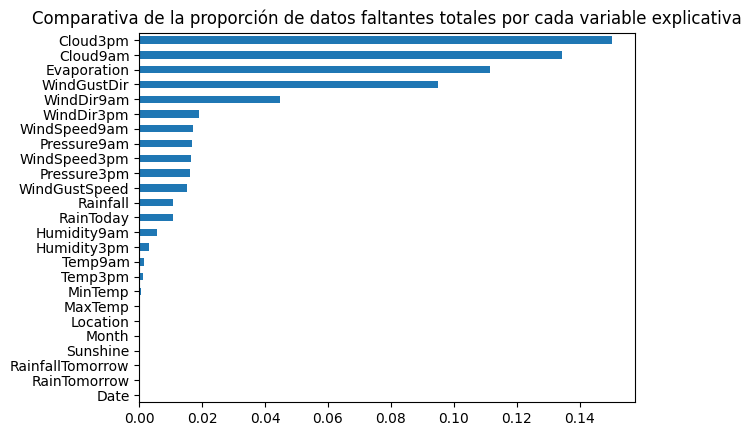

In [241]:
(df.isna().sum(axis=0).sort_values()/df.shape[0]).plot.barh(
    title="Comparativa de la proporción de datos faltantes totales por cada variable explicativa")

In [242]:
"""
Proporcion de valores faltantes por location por variable explicativa:
ej:
- Canberra tiene falante el 46% de los datos de evaporación.
"""
na_list=df.isna().sum(axis=0).sort_values(ascending=False).index.to_list()
na_matrix=(1-(df.groupby("Location", dropna=False).count().div(df.groupby("Location", dropna=False)["Location"].count(), axis=0))
).sort_values(by=na_list, ascending=False).reindex(columns=na_list)
na_matrix.style.background_gradient(cmap="viridis", axis=None)

,Cloud3pm,Cloud9am,Evaporation,WindGustDir,WindDir9am,WindDir3pm,WindSpeed9am,Pressure9am,WindSpeed3pm,Pressure3pm,WindGustSpeed,RainToday,Rainfall,Humidity9am,Humidity3pm,Temp9am,Temp3pm,MinTemp,MaxTemp,RainfallTomorrow,RainTomorrow,Date,Location,Sunshine,Month
Location,,,,,,,,,,,,,,,,,,,,,,,,,
Canberra,0.366696,0.311677,0.466491,0.096283,0.156863,0.066725,0.066725,0.065555,0.065262,0.064384,0.062628,0.004682,0.004682,0.017852,0.003512,0.004975,0.002049,0.001463,0.000878,0.000000,0.000000,0.000000,nan,0.000000,0.000000
Melbourne,0.191865,0.166804,0.000000,0.005752,0.015612,0.004519,0.000822,0.000411,0.000000,0.001233,0.000000,0.056286,0.056286,0.001233,0.002876,0.000822,0.001643,0.000411,0.000411,0.000000,0.000000,0.000000,nan,0.000000,0.000000
Sydney,0.168165,0.169664,0.015288,0.310552,0.016787,0.009892,0.007794,0.005995,0.007494,0.005695,0.004496,0.001799,0.001799,0.004197,0.003897,0.001199,0.001199,0.000899,0.000600,0.000000,0.000000,0.000000,nan,0.000000,0.000000
MelbourneAirport,0.000332,0.000000,0.000997,0.004987,0.013298,0.004322,0.000332,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002660,0.002992,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,0.000000,0.000000
SydneyAirport,0.000000,0.001332,0.015313,0.016977,0.002663,0.001332,0.000999,0.002663,0.000333,0.000999,0.000000,0.001332,0.001332,0.000666,0.001332,0.000333,0.000333,0.000333,0.000000,0.000000,0.000000,0.000000,nan,0.000000,0.000000


In [243]:
fig=px.bar(na_matrix)
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Total")
fig.update_layout(
    title_text="Proporcion de valores faltantes por location por variable explicativa",
    barmode="stack")
fig.show()

### Correlación
- Observando el valor de correlación de spearman con algunas variables predictoras vemos que en particular:
- `Humidity3pm`
- `WindGustSpeed`
- `Pressure9am`
- `Pressure3pm`
- `Rainfall`
- `Temp3pm`
- `MinTemp`
- `Sunshine`
- `Location`

Parecen ser buenas candidatas a ser incluidas para predecir $y$.

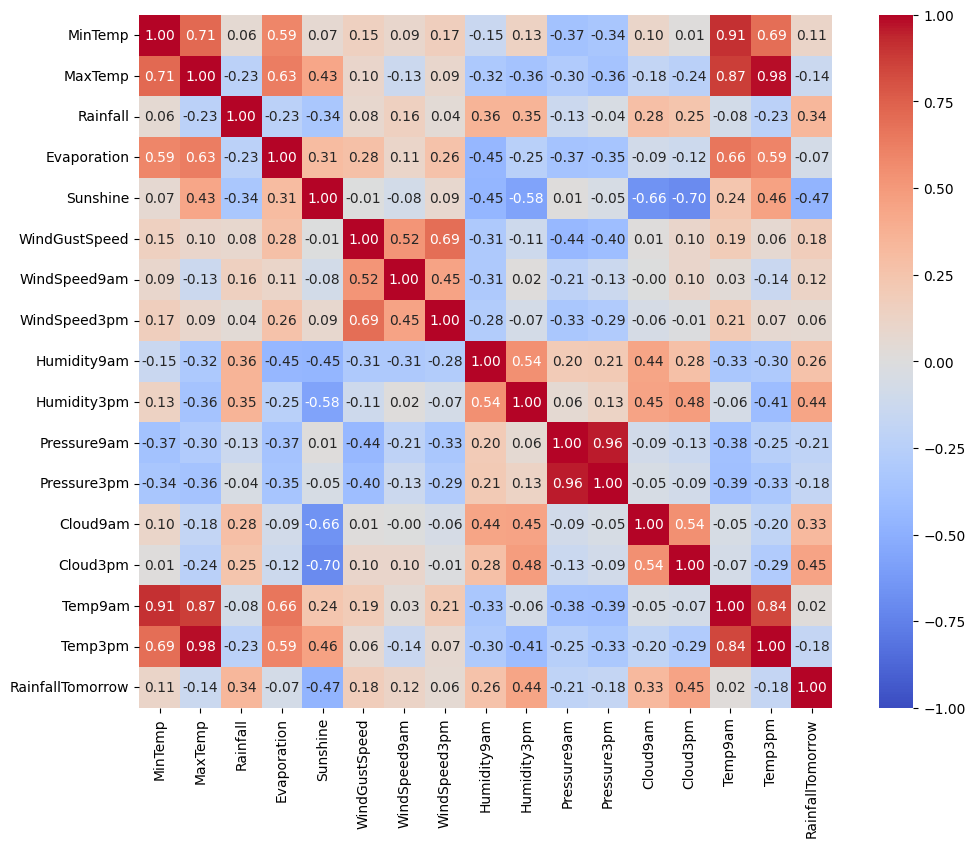

In [244]:
plt.figure(figsize=(12, 9))
sns.heatmap(df.corr(numeric_only=True, method="spearman"), annot=True, fmt='.2f', cmap='coolwarm', square=True, vmin=-1, vmax=1)
plt.show()

#### Correlación $y$ `RainfallTomorrow` con el resto de las variables explicativas cuantitativas

In [245]:
y_corr=pd.concat([df.corr(numeric_only=True, method=m).loc["RainfallTomorrow"].to_frame(m) for m in ["pearson","spearman"]],axis=1)\
.sort_values(by="pearson",ascending=False)
y_corr.style.background_gradient(cmap="viridis", vmin=-1, vmax=1)

,pearson,spearman
RainfallTomorrow,1.000000,1.000000
Humidity3pm,0.347597,0.444501
Rainfall,0.289314,0.339135
Cloud3pm,0.249050,0.445648
Cloud9am,0.197150,0.327478
Humidity9am,0.170787,0.260735
WindGustSpeed,0.130164,0.179076
MinTemp,0.122680,0.112951
WindSpeed9am,0.073385,0.119764
Temp9am,0.065127,0.019239


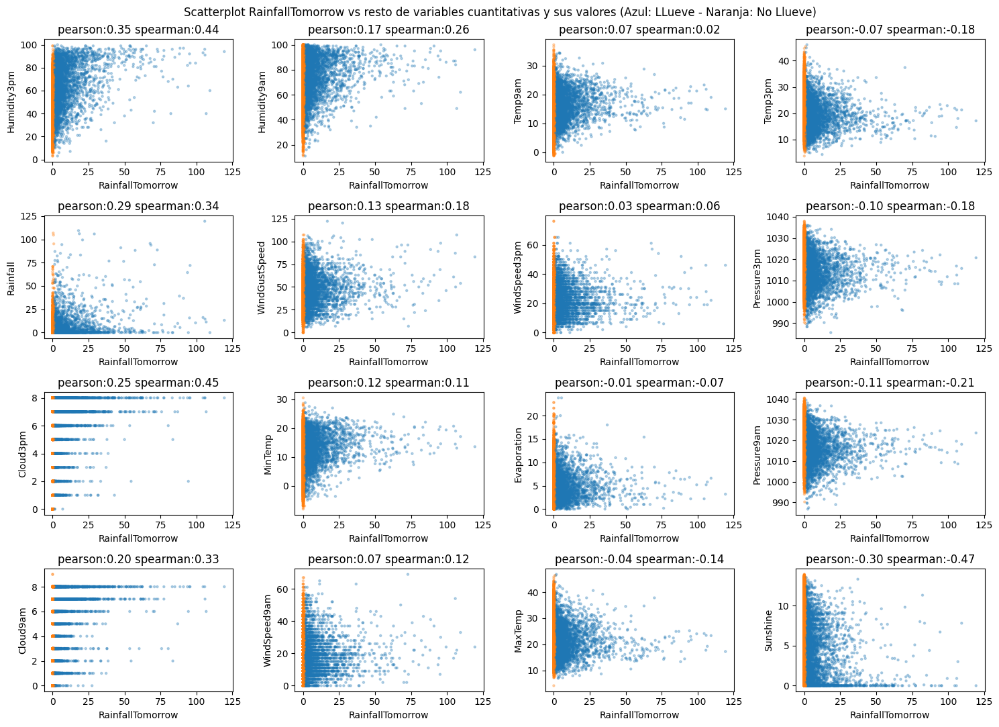

In [246]:
num_cols = y_corr.index.to_list()
num_cols.remove("RainfallTomorrow")

fig, axs = plt.subplots(4, len(num_cols)//4, figsize=(15, 11))
for i, c in enumerate(num_cols):
    scatter_kwards = dict(alpha=0.3, marker='.')
    color = ['tab:blue' if v == 'Yes' else 'tab:orange' for v in df['RainTomorrow']]
    axs[i%4, i//4].set_title(f"pearson:{y_corr.loc[c, 'pearson']:.2f} spearman:{y_corr.loc[c, 'spearman']:.2f}")
    df.plot.scatter(x="RainfallTomorrow", y=c, ax=axs[i%4, i//4], color=color, **scatter_kwards)

fig.suptitle("Scatterplot RainfallTomorrow vs resto de variables cuantitativas y sus valores (Azul: LLueve - Naranja: No Llueve)")
fig.tight_layout()
fig.show()

##### Comparando RainTomorrow = No con RainTomorrow = Yes

###### `RainTomorrow` "No"

In [247]:
mask=(df["RainTomorrow"]=="No")
df_rain_no=df[mask]
y_corr_rain_no=pd.concat([df_rain_no.corr(numeric_only=True, method=m).loc["RainfallTomorrow"].to_frame(m)
                          for m in ["pearson","spearman"]],axis=1).sort_values(by="pearson",ascending=False)
y_corr_rain_no.style.background_gradient(cmap="viridis", vmin=-1, vmax=1)

,pearson,spearman
RainfallTomorrow,1.000000,1.000000
Cloud3pm,0.231645,0.249689
Humidity3pm,0.230040,0.241079
Cloud9am,0.162149,0.184549
Rainfall,0.159494,0.246869
Humidity9am,0.127101,0.165780
WindGustSpeed,0.094237,0.077300
WindSpeed9am,0.075235,0.072032
WindSpeed3pm,0.057232,0.042953
MinTemp,0.025125,0.014282


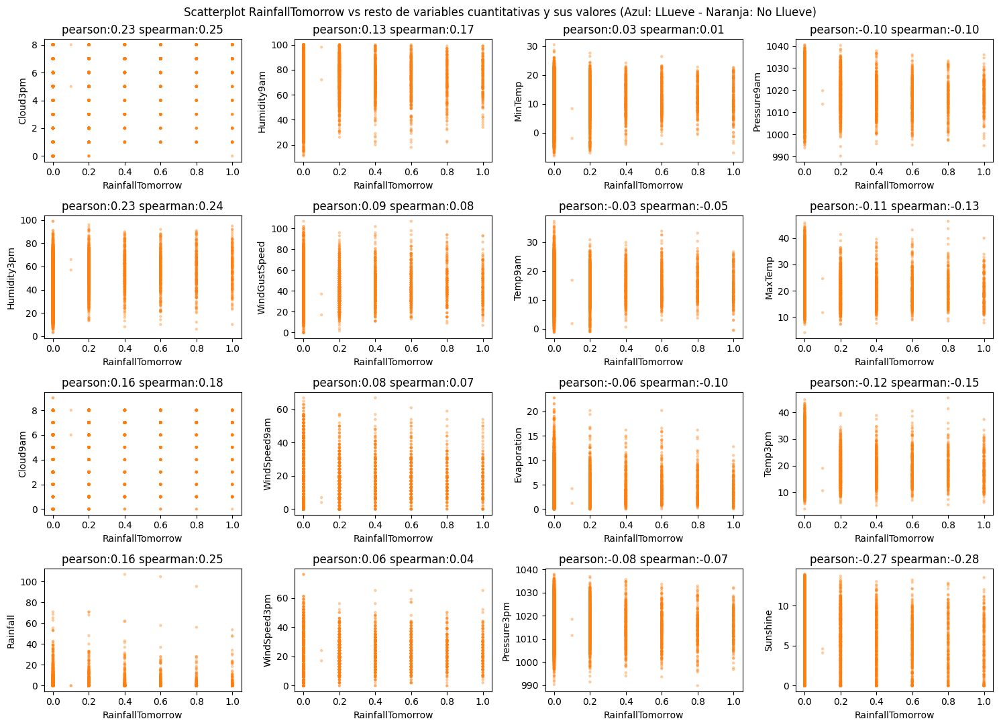

In [248]:
num_cols = y_corr_rain_no.index.to_list()
num_cols.remove("RainfallTomorrow")

fig, axs = plt.subplots(4, len(num_cols)//4, figsize=(15, 11))
for i, c in enumerate(num_cols):
    scatter_kwards = dict(alpha=0.3, marker='.')
    color = ['tab:blue' if v == 'Yes' else 'tab:orange' for v in df_rain_no['RainTomorrow']]
    axs[i%4, i//4].set_title(f"pearson:{y_corr_rain_no.loc[c, 'pearson']:.2f} spearman:{y_corr_rain_no.loc[c, 'spearman']:.2f}")
    df_rain_no.plot.scatter(x="RainfallTomorrow", y=c, ax=axs[i%4, i//4], color=color, **scatter_kwards)

fig.suptitle("Scatterplot RainfallTomorrow vs resto de variables cuantitativas y sus valores (Azul: LLueve - Naranja: No Llueve)")
fig.tight_layout()
fig.show()

###### `RainTomorrow` "Yes"

In [249]:
mask=(df["RainTomorrow"]=="Yes")
df_rain_yes=df[mask]
y_corr_rain_yes=pd.concat([df_rain_yes.corr(numeric_only=True, method=m).loc["RainfallTomorrow"].to_frame(m)
                          for m in ["pearson","spearman"]],axis=1).sort_values(by="pearson",ascending=False)
y_corr_rain_yes.style.background_gradient(cmap="viridis", vmin=-1, vmax=1)

,pearson,spearman
RainfallTomorrow,1.000000,1.000000
Humidity3pm,0.265396,0.278240
Rainfall,0.241841,0.163400
MinTemp,0.153924,0.183056
Cloud3pm,0.151313,0.200262
Cloud9am,0.146030,0.192681
Humidity9am,0.143619,0.150126
Temp9am,0.109342,0.154529
WindGustSpeed,0.071667,0.035736
WindSpeed9am,0.031305,-0.010195


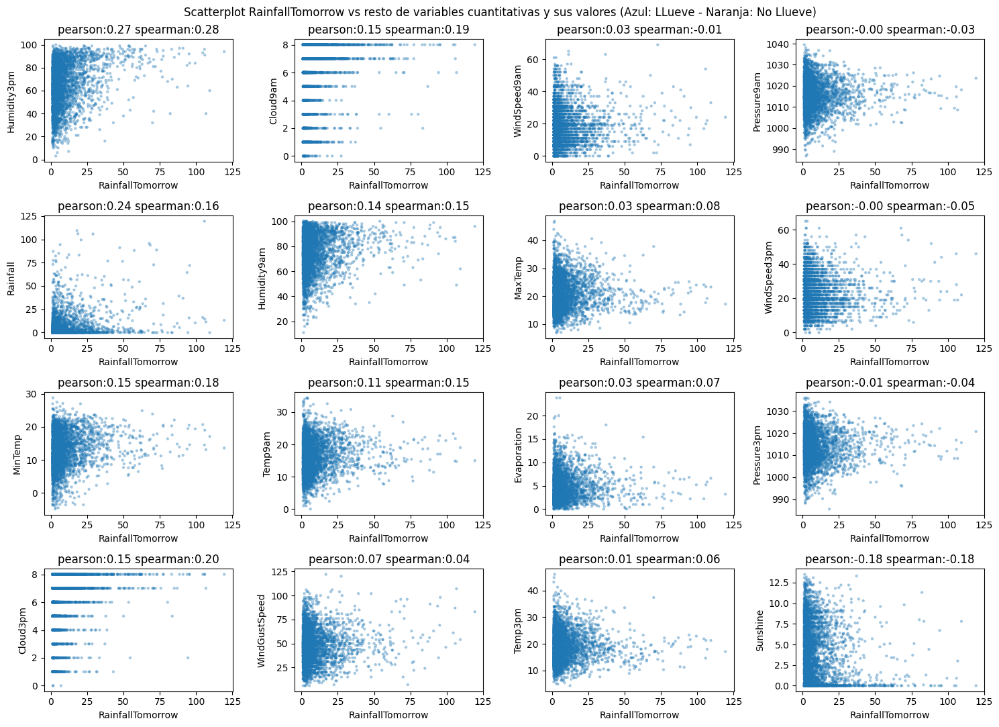

In [250]:
num_cols = y_corr_rain_yes.index.to_list()
num_cols.remove("RainfallTomorrow")

fig, axs = plt.subplots(4, len(num_cols)//4, figsize=(15, 11))
for i, c in enumerate(num_cols):
    scatter_kwards = dict(alpha=0.3, marker='.')
    color = ['tab:blue' if v == 'Yes' else 'tab:orange' for v in df_rain_yes['RainTomorrow']]
    axs[i%4, i//4].set_title(f"pearson:{y_corr_rain_yes.loc[c, 'pearson']:.2f} spearman:{y_corr_rain_yes.loc[c, 'spearman']:.2f}")
    df_rain_yes.plot.scatter(x="RainfallTomorrow", y=c, ax=axs[i%4, i//4], color=color, **scatter_kwards)

fig.suptitle("Scatterplot RainfallTomorrow vs resto de variables cuantitativas y sus valores (Azul: LLueve - Naranja: No Llueve)")
fig.tight_layout()
fig.show()

#### correlación $X$

In [251]:
from itertools import combinations

df_corr=df.corr(numeric_only=True).stack()[[c for c in combinations(df.select_dtypes(np.number).columns, 2)]].sort_values(ascending=False)
df_corr.head(20)

MaxTemp        Temp3pm         0.977000
Pressure9am    Pressure3pm     0.959991
MinTemp        Temp9am         0.904726
MaxTemp        Temp9am         0.851056
Temp9am        Temp3pm         0.819627
WindGustSpeed  WindSpeed3pm    0.701131
MinTemp        MaxTemp         0.681959
               Temp3pm         0.655332
Evaporation    Temp9am         0.637492
MaxTemp        Evaporation     0.601558
WindGustSpeed  WindSpeed9am    0.579869
MinTemp        Evaporation     0.568761
Evaporation    Temp3pm         0.563594
Humidity9am    Humidity3pm     0.559756
Cloud9am       Cloud3pm        0.525857
WindSpeed9am   WindSpeed3pm    0.494410
Humidity3pm    Cloud3pm        0.465399
               Cloud9am        0.437147
Sunshine       Temp3pm         0.432657
MaxTemp        Sunshine        0.413683
dtype: float64

In [252]:
df_corr.tail(20)

WindSpeed9am   Humidity9am   -0.340614
Humidity9am    Temp3pm       -0.341292
MinTemp        Pressure3pm   -0.346779
WindSpeed3pm   Pressure9am   -0.349533
Evaporation    Pressure9am   -0.356266
MaxTemp        Pressure3pm   -0.359779
               Humidity9am   -0.363168
MinTemp        Pressure9am   -0.372341
Pressure9am    Temp9am       -0.378793
Pressure3pm    Temp9am       -0.387828
Humidity9am    Temp9am       -0.388464
MaxTemp        Humidity3pm   -0.417356
WindGustSpeed  Pressure3pm   -0.425489
Sunshine       Humidity9am   -0.427448
Evaporation    Humidity9am   -0.454682
WindGustSpeed  Pressure9am   -0.456287
Humidity3pm    Temp3pm       -0.475433
Sunshine       Humidity3pm   -0.595675
               Cloud9am      -0.642322
               Cloud3pm      -0.679973
dtype: float64

### Normalización: **StandardScaler** vs **RobustScaler**

#### Normalización: $y$

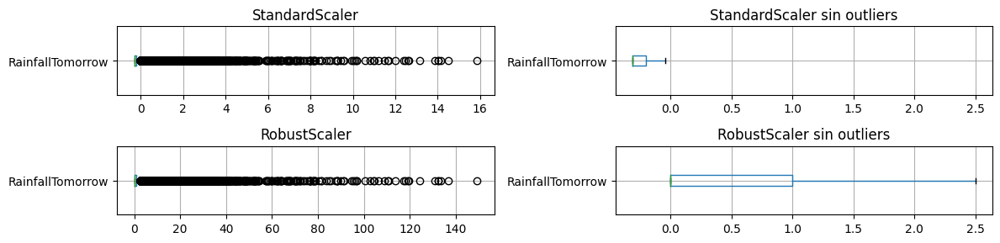

,StandardScaler,RobustScaler
count,1.519900e+04,15199.000000
mean,-2.991956e-17,2.878232
std,1.000033e+00,9.231564
min,-3.117919e-01,0.000000
25%,-3.117919e-01,0.000000
50%,-3.117919e-01,0.000000
75%,-2.034643e-01,1.000000
max,1.585610e+01,149.250000


In [253]:
y=np.reshape(df['RainfallTomorrow'].values, (-1,1))
y_scaled=[]
scalers=[StandardScaler, RobustScaler]
fig,axs=plt.subplots(2,2,figsize=(12,3))
axs[0,1].sharex(axs[1,1])
for i,scaler in enumerate(scalers):
  y_norm=pd.DataFrame(scaler().fit_transform(y),columns=['RainfallTomorrow'])
  y_norm.boxplot(vert=False,ax=axs[i,0])
  y_norm.boxplot(vert=False,ax=axs[i,1], showfliers=False)
  axs[i,0].set_title(scaler.__name__)
  axs[i,1].set_title(f"{scaler.__name__} sin outliers")
  y_scaled.append(y_norm.describe())

plt.tight_layout()
plt.show()

y_desc=pd.concat(y_scaled,axis=1)
y_desc.columns=[s.__name__ for s in scalers]
y_desc

In [254]:
desc_temp=y_norm.describe()
df_out=df[df["RainTomorrow"]=="No"]['RainfallTomorrow']
Q1=df_out.quantile(0.25)
Q3=df_out.quantile(0.75)
RIC=Q3-Q1
desc_temp.loc['outliers']=(df_out<Q1-1.5*RIC).sum()+(Q3+1.5*RIC<df_out).sum()
desc_temp

,RainfallTomorrow
count,15199.000000
mean,2.878232
std,9.231564
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,149.250000
outliers,1944.000000


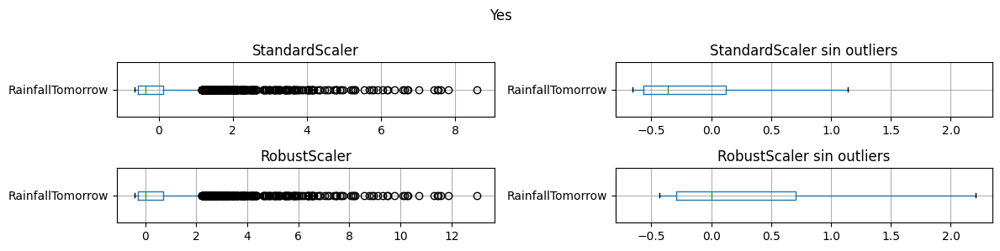

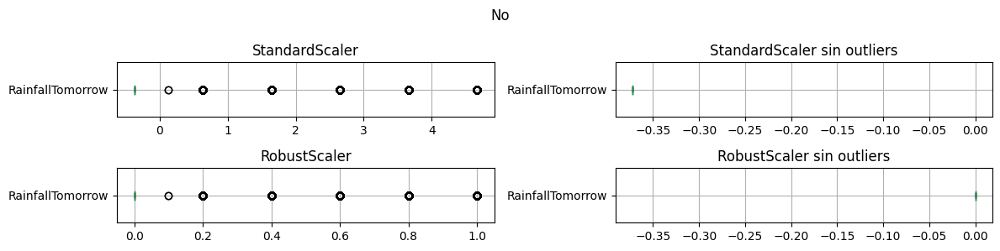

count          mean       std  \
Yes StandardScaler RainfallTomorrow   3556.0 -9.591128e-17  1.000141   
    RobustScaler   RainfallTomorrow   3556.0  5.226889e-01  1.453097   
No  StandardScaler RainfallTomorrow  11643.0  9.764394e-18  1.000043   
    RobustScaler   RainfallTomorrow  11643.0  7.391566e-02  0.198571   

                                          min       25%       50%       75%  \
Yes StandardScaler RainfallTomorrow -0.656970 -0.563114 -0.359758  0.125169   
    RobustScaler   RainfallTomorrow -0.431818 -0.295455  0.000000  0.704545   
No  StandardScaler RainfallTomorrow -0.372254 -0.372254 -0.372254 -0.372254   
    RobustScaler   RainfallTomorrow  0.000000  0.000000  0.000000  0.000000   

                                           max  outliers  outliers_rel  
Yes StandardScaler RainfallTomorrow   8.587913     315.0      0.088583  
    RobustScaler   RainfallTomorrow  13.000000     312.0      0.087739  
No  StandardScaler RainfallTomorrow   4.663950    1944.0      0.166967  
    RobustScaler   RainfallTomorrow   1.000000    1944.0      0.166967

In [255]:
y_scaled=[]
for b in ["Yes", "No"]:
  df_out=df[df["RainTomorrow"]==b]['RainfallTomorrow']
  y=np.reshape(df_out.values, (-1,1))
  scalers=[StandardScaler, RobustScaler]
  fig,axs=plt.subplots(2,2,figsize=(12,3))
  axs[0,1].sharex(axs[1,1])
  for i,scaler in enumerate(scalers):
    y_norm=pd.DataFrame(scaler().fit_transform(y),columns=['RainfallTomorrow'])
    y_norm.boxplot(vert=False,ax=axs[i,0])
    y_norm.boxplot(vert=False,ax=axs[i,1], showfliers=False)
    axs[i,0].set_title(scaler.__name__)
    axs[i,1].set_title(f"{scaler.__name__} sin outliers")

    # contamos outliers
    desc_temp=y_norm.describe()
    Q1=y_norm.quantile(0.25)
    Q3=y_norm.quantile(0.75)
    RIC=Q3-Q1
    desc_temp.loc['outliers']=(y_norm<Q1-1.5*RIC).sum()+(Q3+1.5*RIC<y_norm).sum()
    desc_temp.loc['outliers_rel']=desc_temp.loc['outliers']/desc_temp.loc['count']
    y_scaled.append(desc_temp)
  plt.suptitle(b)
  plt.tight_layout()
  plt.show()

y_desc=pd.concat(y_scaled,axis=1, keys=[(b, s.__name__,) for b in ["Yes", "No"] for s in scalers])
y_desc.T

#### Normalización: $X$

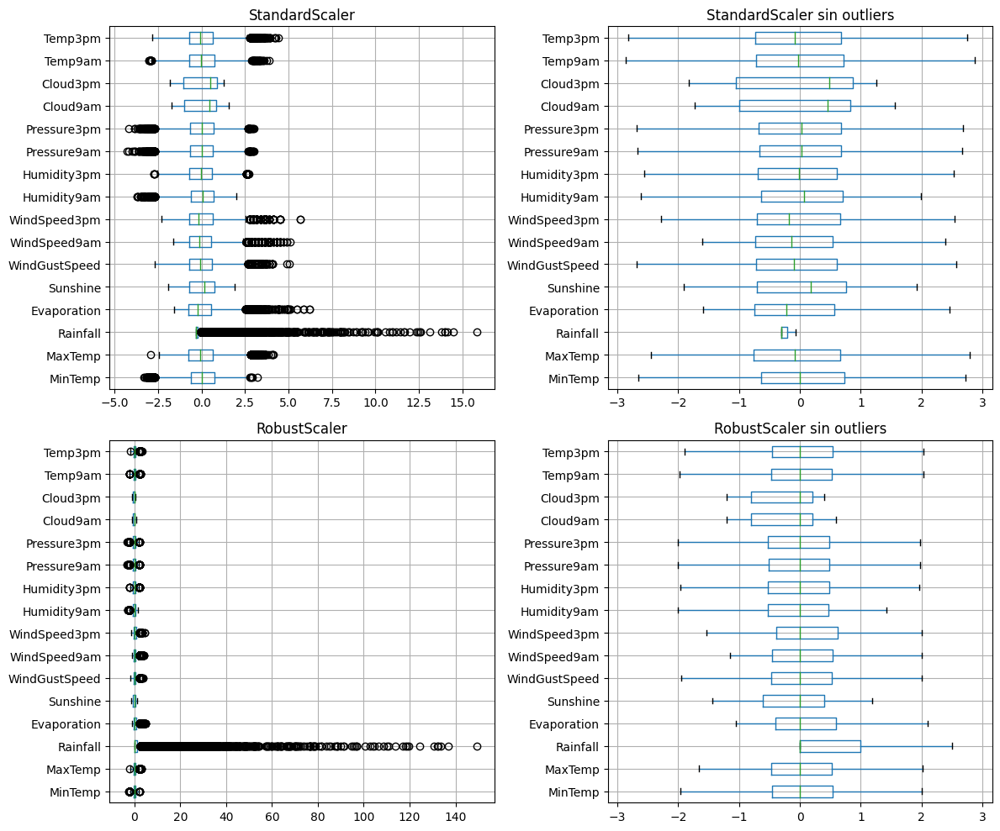

count                        mean                 \
              RobustScaler StandardScaler RobustScaler StandardScaler   
MinTemp            15189.0        15189.0     0.000757  -3.592711e-16   
MaxTemp            15193.0        15193.0     0.056303  -3.442108e-16   
Rainfall           15036.0        15036.0     2.874501   0.000000e+00   
Evaporation        13505.0        13505.0     0.167277  -5.050878e-17   
Sunshine           15199.0        15199.0    -0.126037   1.495978e-17   
WindGustSpeed      14970.0        14970.0     0.068178   9.113173e-17   
WindSpeed9am       14939.0        14939.0     0.113817   1.065410e-16   
WindSpeed3pm       14950.0        14950.0     0.134356  -4.562682e-17   
Humidity9am        15111.0        15111.0    -0.053099   7.899621e-17   
Humidity3pm        15154.0        15154.0     0.010378  -3.751050e-18   
Pressure9am        14946.0        14946.0    -0.016765  -1.968183e-15   
Pressure3pm        14954.0        14954.0    -0.022459  -1.056264e-15   
Cloud9am           13158.0        13158.0    -0.252303  -1.382421e-16   
Cloud3pm           12917.0        12917.0    -0.252830   3.520534e-17   
Temp9am            15175.0        15175.0     0.021333  -2.247516e-16   
Temp3pm            15183.0        15183.0     0.056135  -1.078239e-15   

                       std                         min                 \
              RobustScaler StandardScaler RobustScaler StandardScaler   
MinTemp           0.734662       1.000033    -2.450000      -3.336009   
MaxTemp           0.704087       1.000033    -2.000000      -2.920620   
Rainfall          9.255772       1.000033     0.000000      -0.310573   
Evaporation       0.764379       1.000037    -1.050000      -1.592564   
Sunshine          0.683190       1.000033    -1.433962      -1.914501   
WindGustSpeed     0.753590       1.000033    -1.952381      -2.681335   
WindSpeed9am      0.790936       1.000033    -1.153846      -1.602791   
WindSpeed3pm      0.733004       1.000033    -1.538462      -2.282215   
Humidity9am       0.745046       1.000033    -2.809524      -3.699793   
Humidity3pm       0.771114       1.000033    -2.086957      -2.719967   
Pressure9am       0.747307       1.000033    -3.212121      -4.275972   
Pressure3pm       0.741297       1.000033    -3.142857      -4.209518   
Cloud9am          0.546282       1.000038    -1.200000      -1.734879   
Cloud3pm          0.518714       1.000039    -1.200000      -1.826069   
Temp9am           0.696364       1.000033    -2.087500      -3.028447   
Temp3pm           0.714499       1.000033    -1.963415      -2.826618   

                       25%                         50%                 \
              RobustScaler StandardScaler RobustScaler StandardScaler   
MinTemp          -0.462500      -0.630593          0.0      -0.001031   
MaxTemp          -0.476744      -0.757100          0.0      -0.079968   
Rainfall          0.000000      -0.310573          0.0      -0.310573   
Evaporation      -0.400000      -0.742169          0.0      -0.218849   
Sunshine         -0.603774      -0.699296          0.0       0.184489   
WindGustSpeed    -0.476190      -0.722391          0.0      -0.090474   
WindSpeed9am     -0.461538      -0.727460          0.0      -0.143906   
WindSpeed3pm     -0.384615      -0.708029          0.0      -0.183301   
Humidity9am      -0.523810      -0.631808          0.0       0.071272   
Humidity3pm      -0.521739      -0.690085          0.0      -0.013458   
Pressure9am      -0.515152      -0.666932          0.0       0.022435   
Pressure3pm      -0.520408      -0.671749          0.0       0.030298   
Cloud9am         -0.800000      -1.002629          0.0       0.461872   
Cloud3pm         -0.800000      -1.054901          0.0       0.487435   
Temp9am          -0.475000      -0.712772          0.0      -0.030636   
Temp3pm          -0.463415      -0.727176          0.0      -0.078568   

                       75%                         max                 
    

In [256]:
x_cols_num=df.select_dtypes(np.number).columns.to_list()
x_cols_num.remove('RainfallTomorrow')
X=np.reshape(df[x_cols_num].values, (-1,len(x_cols_num)))
X_scaled=[]
scalers=[StandardScaler, RobustScaler]
fig,axs=plt.subplots(2,2,figsize=(12,10))
axs[0,1].sharex(axs[1,1])
for i,scaler in enumerate(scalers):
  y_norm=pd.DataFrame(scaler().fit_transform(X),columns=df[x_cols_num].columns)
  y_norm.boxplot(vert=False, ax=axs[i,0])
  y_norm.boxplot(vert=False, ax=axs[i,1], showfliers=False)
  axs[i,0].set_title(scaler.__name__)
  axs[i,1].set_title(f"{scaler.__name__} sin outliers")
  X_scaled.append(y_norm.describe())

plt.tight_layout()
plt.show()

X_desc=pd.concat(X_scaled,axis=1, keys=[(s.__name__,) for s in scalers])
X_desc.T.unstack(0)

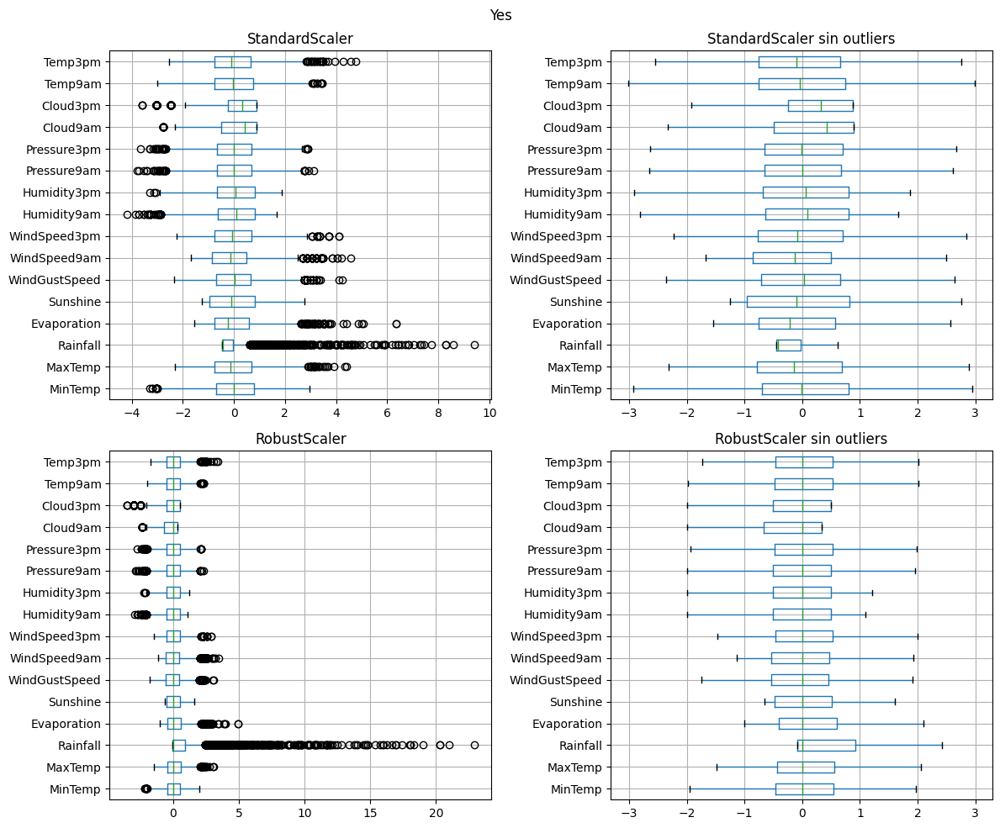

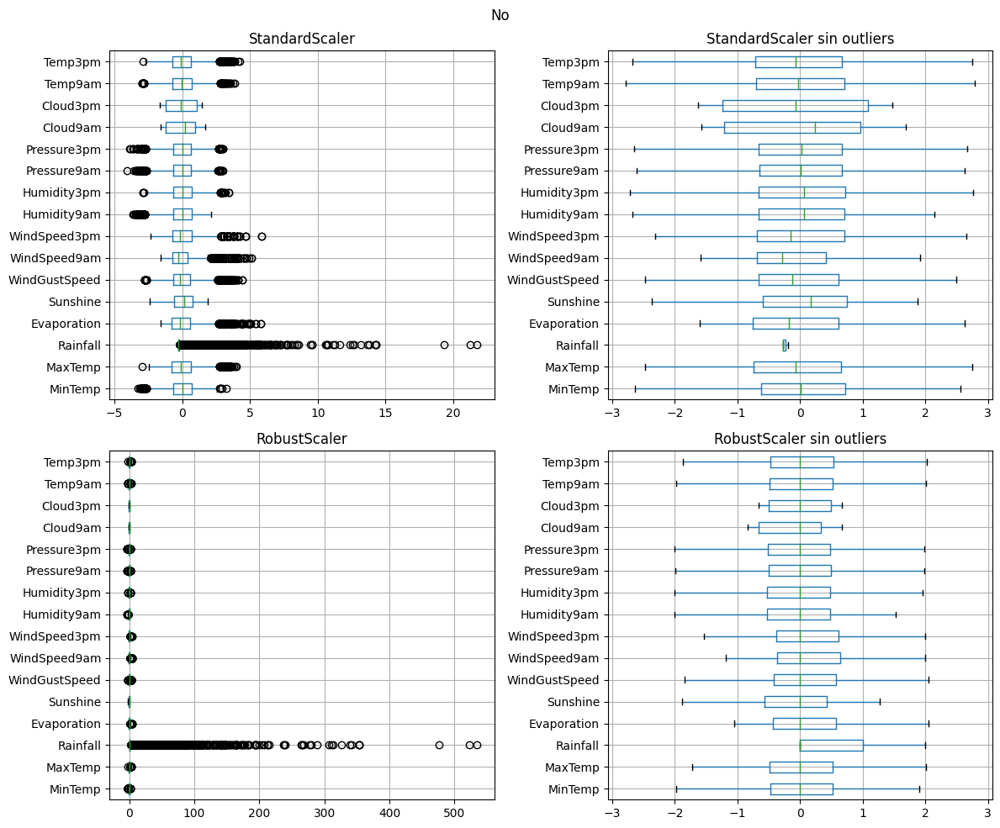

Yes                                            \
             StandardScaler                                             
                    MinTemp       MaxTemp      Rainfall   Evaporation   
count          3.554000e+03  3.555000e+03  3.443000e+03  3.197000e+03   
mean           3.198842e-17 -2.398456e-16  3.301970e-17 -2.667036e-17   
std            1.000141e+00  1.000141e+00  1.000145e+00  1.000156e+00   
min           -3.282921e+00 -2.317482e+00 -4.539076e-01 -1.546704e+00   
25%           -6.960394e-01 -7.780221e-01 -4.539076e-01 -7.511691e-01   
50%           -1.236354e-02 -1.351706e-01 -4.208911e-01 -2.208126e-01   
75%            8.006564e-01  6.937694e-01 -2.469286e-02  5.747223e-01   
max            2.944073e+00  4.415541e+00  9.401523e+00  6.342350e+00   
outliers       1.300000e+01  2.500000e+01  4.450000e+02  6.500000e+01   
outliers_rel   3.657850e-03  7.032349e-03  1.292477e-01  2.033156e-02   

                                                                      \
                                                                       
                  Sunshine WindGustSpeed  WindSpeed9am  WindSpeed3pm   
count         3.556000e+03  3.505000e+03  3.501000e+03  3.504000e+03   
mean          1.079002e-16  4.865343e-17  1.095953e-16  4.055609e-18   
std           1.000141e+00  1.000143e+00  1.000143e+00  1.000143e+00   
min          -1.257291e+00 -2.357078e+00 -1.675439e+00 -2.228205e+00   
25%          -9.597763e-01 -7.087677e-01 -8.588032e-01 -7.633038e-01   
50%          -9.698443e-02  3.012996e-02 -1.329051e-01 -7.968326e-02   
75%           8.253103e-01  6.553511e-01  5.022558e-01  7.015973e-01   
max           2.759154e+00  4.236163e+00  4.585433e+00  4.119700e+00   
outliers      0.000000e+00  3.400000e+01  6.400000e+01  1.700000e+01   
outliers_rel  0.000000e+00  9.700428e-03  1.828049e-02  4.851598e-03   

                                          ...            No                \
                                          ...  RobustScaler                 
               Humidity9am   Humidity3pm  ...  WindSpeed9am  WindSpeed3pm   
count         3.548000e+03  3.545000e+03  ...  11438.000000  11446.000000   
mean          1.842445e-16  2.405222e-17  ...      0.261091      0.109175   
std           1.000141e+00  1.000141e+00  ...      0.906043      0.713543   
min          -4.188034e+00 -3.284841e+00  ...     -1.181818     -1.538462   
25%          -6.355439e-01 -6.777851e-01  ...     -0.363636     -0.384615   
50%           8.811136e-02  6.708812e-02  ...      0.000000      0.000000   
75%           8.117667e-01  8.119614e-01  ...      0.636364      0.615385   
max           1.666996e+00  1.876066e+00  ...      4.909091      4.307692   
outliers      3.000000e+01  3.000000e+00  ...    473.000000     98.000000   
outliers_rel  8.455468e-03  8.462623e-04  ...      0.041353      0.008562   

                                                                      \
                                                                       
               Humidity9am   Humidity3pm   Pressure9am   Pressure3pm   
count         11563.000000  11609.000000  11440.000000  11453.000000   
mean             -0.042253     -0.042090     -0.006911     -0.020805   
std               0.730970      0.722294      0.759179      0.749243   
min              -2.714286     -2.142857     -3.085106     -2.924731   
25%              -0.523810     -0.523810     -0.500000     -0.516129   
50%               0.000000      0.000000      0.000000      0.000000   
75%               0.476190      0.476190      0.500000      0.483871   
max               1.523810      2.428571      2.276596      2.247312   
outliers         82.000000     22.000000     84.000000     76.000000   
outliers_rel      0.007092      0.001895      0.007343      0.006636   

                                                                     
                                                                     
                  Cloud9am     Cloud3pm       Temp9am     

In [257]:
X_scaled=[]
for b in ["Yes", "No"]:
  df_out=df[df["RainTomorrow"]==b][x_cols_num]
  x_cols_num=df.select_dtypes(np.number).columns.to_list()
  x_cols_num.remove('RainfallTomorrow')
  X=np.reshape(df_out.values, (-1,len(x_cols_num)))
  scalers=[StandardScaler, RobustScaler]
  fig,axs=plt.subplots(2,2,figsize=(12,10))
  axs[0,1].sharex(axs[1,1])
  for i,scaler in enumerate(scalers):
    X_norm=pd.DataFrame(scaler().fit_transform(X),columns=df[x_cols_num].columns)
    X_norm.boxplot(vert=False, ax=axs[i,0])
    X_norm.boxplot(vert=False, ax=axs[i,1], showfliers=False)
    axs[i,0].set_title(scaler.__name__)
    axs[i,1].set_title(f"{scaler.__name__} sin outliers")

    desc_temp=X_norm.describe()
    Q1=X_norm.quantile(0.25)
    Q3=X_norm.quantile(0.75)
    RIC=Q3-Q1
    desc_temp.loc['outliers']=(X_norm<Q1-1.5*RIC).sum()+(Q3+1.5*RIC<X_norm).sum()
    desc_temp.loc['outliers_rel']=desc_temp.loc['outliers']/desc_temp.loc['count']
    X_scaled.append(desc_temp)

  plt.suptitle(b)
  plt.tight_layout()
  plt.show()

X_desc=pd.concat(X_scaled,axis=1, keys=[(b, s.__name__,) for b in ["Yes", "No"] for s in scalers])
X_desc

### Outliers
- Al observar los outliers, notamos que en proporción la cantidad de outliers de la mayoría de las variables es muy inferior a la variable `Rainfall`, por lo cual no nos preocupa que esto modifique nuestra predicción. Y en el caso de `Rainfall`consideramos que es lógico la presencia de Outliers dado que esa variable depende fuertemente de que haya o no llovido, y como vimos en el principio del análisis de los datos, la proporción de días lluviosos con respecto a días no lluviosos es de 4/1 a favor de los no lluviosos.

In [258]:
df_rain_yes = df[df["RainToday"] == "Yes"]
df_rain_no = df[df["RainToday"] == "No"]
Q1_rain_yes = df_rain_yes["RainfallTomorrow"].quantile(0.25)
Q3_rain_yes = df_rain_yes["RainfallTomorrow"].quantile(0.75)
IQR_rain_yes = Q3_rain_yes - Q1_rain_yes

lower_bound_rain_yes = Q1_rain_yes - 1.5 * IQR_rain_yes
upper_bound_rain_yes = Q3_rain_yes + 1.5 * IQR_rain_yes

outliers_rain_yes = df_rain_yes[(df_rain_yes["RainfallTomorrow"] < lower_bound_rain_yes) | (df_rain_yes["RainfallTomorrow"] > upper_bound_rain_yes)]
outliers_rain_yes

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow,Month
2,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,NaN,17.0,ESE,...,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes,18.8,2
3,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,NaN,22.0,NNE,...,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes,77.4,2
6,2008-02-07,Sydney,18.6,26.3,6.2,5.2,5.2,NaN,15.0,W,...,999.0,1000.3,4.0,7.0,21.7,22.3,Yes,Yes,27.6,2
7,2008-02-08,Sydney,17.2,22.3,27.6,5.8,2.1,NaN,15.0,S,...,1008.3,1007.4,7.0,8.0,18.9,21.1,Yes,Yes,12.6,2
27,2008-02-28,Sydney,17.9,21.4,4.2,4.2,0.0,NaN,20.0,S,...,1010.0,1010.1,8.0,8.0,20.4,19.2,Yes,Yes,33.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14916,2016-09-15,Melbourne,8.7,14.6,2.0,3.2,1.0,WSW,37.0,NW,...,1006.7,1009.2,6.0,7.0,12.0,12.0,Yes,Yes,13.4,9
15122,2017-04-09,Melbourne,11.7,15.2,10.6,7.8,0.5,WSW,44.0,W,...,1007.2,1005.1,7.0,7.0,11.7,12.4,Yes,Yes,25.4,4
15123,2017-04-10,Melbourne,9.0,17.0,25.4,2.8,0.0,S,63.0,SSW,...,1015.1,1018.0,8.0,7.0,14.9,15.5,Yes,Yes,15.4,4
15138,2017-04-25,Melbourne,16.2,17.7,21.6,3.4,3.6,NW,30.0,WNW,...,1008.1,1006.9,7.0,7.0,16.4,17.1,Yes,Yes,20.0,4


In [259]:
Q1_rain_no = df_rain_no["RainfallTomorrow"].quantile(0.25)
Q3_rain_no = df_rain_no["RainfallTomorrow"].quantile(0.75)
IQR_rain_no = Q3_rain_no - Q1_rain_no

lower_bound_rain_no = Q1_rain_yes - 1.5 * IQR_rain_no
upper_bound_rain_no = Q3_rain_yes + 1.5 * IQR_rain_no

outliers_rain_no = df_rain_no[(df_rain_no["RainfallTomorrow"] < lower_bound_rain_no) | (df_rain_no["RainfallTomorrow"] > upper_bound_rain_no)]
outliers_rain_no

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow,Month
11,2008-02-12,Sydney,18.9,27.3,0.0,6.8,6.7,NaN,24.0,N,...,1010.7,1007.5,7.0,7.0,22.9,24.7,No,Yes,14.4,2
25,2008-02-26,Sydney,19.3,26.2,0.0,3.6,8.4,NaN,28.0,WSW,...,1018.3,1015.6,1.0,6.0,23.0,25.8,No,Yes,22.2,2
29,2008-03-01,Sydney,12.8,22.0,0.2,6.2,11.3,NaN,31.0,W,...,1020.9,1020.6,0.0,1.0,15.9,21.2,No,Yes,5.4,3
35,2008-03-07,Sydney,19.9,24.9,0.0,7.6,4.5,NaN,24.0,SSW,...,1021.3,1020.7,5.0,7.0,22.9,23.3,No,Yes,17.4,3
51,2008-03-23,Sydney,16.3,24.8,0.4,4.0,6.1,NaN,13.0,WNW,...,1023.1,1020.6,5.0,6.0,18.5,24.8,No,Yes,17.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15121,2017-04-08,Melbourne,18.6,28.1,0.0,9.4,7.1,N,44.0,N,...,1018.6,1012.8,2.0,5.0,21.7,27.8,No,Yes,10.6,4
15133,2017-04-20,Melbourne,14.6,26.5,0.0,7.4,5.1,NNW,43.0,N,...,1026.1,1022.2,3.0,7.0,21.7,25.2,No,Yes,9.4,4
15137,2017-04-24,Melbourne,15.9,24.7,0.0,2.8,4.9,N,28.0,NNE,...,1020.7,1014.7,7.0,7.0,16.6,24.5,No,Yes,21.6,4
15170,2017-05-27,Melbourne,11.9,17.8,0.0,1.4,4.1,N,54.0,N,...,1017.5,1012.0,7.0,7.0,13.9,17.2,No,Yes,6.8,5


# Imputaciones

# **Regresión $y$ `RainfallTomorrow`**

A fin de poder conocer si los modelos que vamos a desarrollar son efectivos, necesitan ser comparados contra un modelo de referencia. Vamos a implementar primero un modelo base, para luego ver si encontramos mejorías con otros.

## Modelo Base


Se opta por utilizar el modelo base de regresión basado en la _Predicción De Mediana_ dado que este es mas robusto que la media en presencia de outliers. (Si bien no son outliers, son valores que estan muy por fuera del rango donde se encuentra la mayoria de valores.)

Si observamos todos los datos de la variable `RainfallTomorrow`, el 75% de los valores están por debajo de 0.8, lo cual equivaldría a un "No Llovió". (x<1)

count    15199.000000
mean         2.302586
std          7.385251
min          0.000000
25%          0.000000
50%          0.000000
75%          0.800000
max        119.400000
Name: RainfallTomorrow, dtype: float64

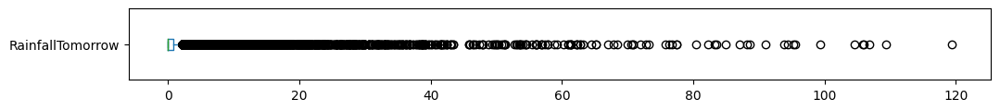

In [260]:
df["RainfallTomorrow"].plot.box(vert=False, figsize=(12,1))
df["RainfallTomorrow"].describe()

El criterio de la _Predicción De Mediana_ consiste en predecir cada salida como la mediana del conjunto de entrenamiento.

In [261]:
from sklearn.dummy import DummyRegressor
model_reg_dummy = DummyRegressor(strategy="median")

X = df
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X.dropna(how="any", inplace=True)

y = df.loc[X.index]["RainfallTomorrow"]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y<1, random_state=777)
model_reg_dummy.fit(X_train, y_train)

DummyRegressor(strategy='median')

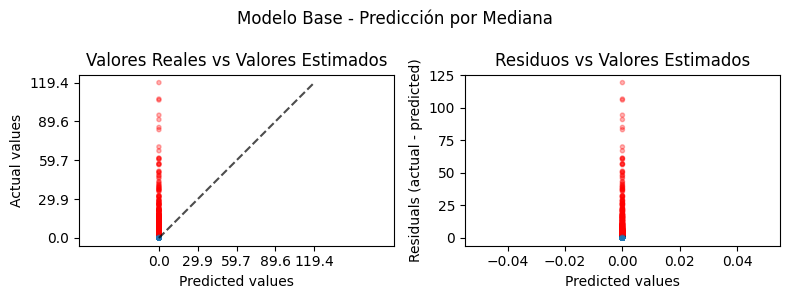

In [262]:
y_hat = model_reg_dummy.predict(X_test)

fig, axs = plt.subplots(ncols=2, figsize=(8, 3))

scatter_kwards=dict(
    alpha=0.3,
    marker='.',
    # Aquellos donde si llovió corresponden al los puntos de color rojo
    color=['r' if v else 'tab:blue' for v in df.loc[X_test.index]['RainTomorrow']=='Yes'],
    )

PredictionErrorDisplay(y_true=y_test,y_pred=y_hat).plot(ax=axs[0],kind="actual_vs_predicted",scatter_kwargs=scatter_kwards)
PredictionErrorDisplay(y_true=y_test,y_pred=y_hat).plot(ax=axs[1],kind="residual_vs_predicted",scatter_kwargs=scatter_kwards)
axs[0].set_title("Valores Reales vs Valores Estimados")
axs[1].set_title("Residuos vs Valores Estimados")
fig.suptitle("Modelo Base - Predicción por Mediana")
fig.tight_layout()
fig.show()

Éste grafico permite observar como estamos siempre asignado el valor 0 a la salida de nuestro modelo.
En consecuencia:
- Para el gráfico de valores reales vs predecidos, podemos observar una linea vertical porque, tenemos por un lado, todo un rango de valores que incluyen dias con lluvia y sin, pero comprimidos todos en una sola dimensión por siempre decir que llueve `0`. Si nuestro modelo hubiese sido efectivo para la predicción de valores, los puntos deberían de encontrarse sobre la librea marcada indicando que las salidas obtenidas son muy parecidas a los valores de test correspondientes.
- Para el caso de los Residuos vs los valores estimados se produce lo mismo.

In [263]:
print("EVS",format(explained_variance_score(y_test, y_hat),".4"))
print("MAX ERROR",format(max_error(y_test, y_hat),".4"))
print("MAE",format(mean_absolute_error(y_test, y_hat),".4"))
print("MSE",format(mean_squared_error(y_test, y_hat),".4"))
print("RMSE",format(mean_squared_error(y_test, y_hat, squared = False),".4"))
print("R2",format(r2_score(y_test, y_hat),".4")) # ------------ NEGATIVO!!
print("MeAE",format(median_absolute_error(y_test, y_hat),".4"))
print("MAPE",format(mean_absolute_percentage_error(y_test, y_hat),".4"))

EVS 0.0
MAX ERROR 119.4
MAE 2.381
MSE 71.12
RMSE 8.434
R2 -0.08665
MeAE 0.0
MAPE 0.3705


Observamos que este modelo presenta un R2 negativo, demostrando claramente que no realiza una buena predicción.

## Regresión Lineal Múltiple

In [264]:
df_reg=df.copy()

### Funciones utilizadas
Definimos el conjunto de funciones que utilizaremos para realizar la regresion. Ademas las aplicamos para el método de Lasso para mostrar su uso.

In [265]:
# pip install --quiet tabulate
from tabulate import tabulate

def evaluate_metrics(y_test, y_hat):
  """
  Evalua un conjunto de métricas
  """
  return (
      explained_variance_score(y_test, y_hat),                # EVS
      max_error(y_test, y_hat),                               # MAX ERROR
      mean_absolute_error(y_test, y_hat),                     # MAE
      mean_squared_error(y_test, y_hat),                      # MSE
      mean_squared_error(y_test, y_hat, squared = False),     # RMSE
      #mean_squared_log_error(y_test, y_hat, squared = False),# MSLE
      r2_score(y_test, y_hat),                                # R2
      median_absolute_error(y_test, y_hat),                   # MeAE
      mean_absolute_percentage_error(y_test, y_hat),          # MAPE
      )

def plot_prediction_error(dataframe, X_test, y_test, y_hat, title):
  """
  Grafica los diagrama de dispersión para los residuos y la comparación entre los valores reales y estimados.
  """
  fig, axs = plt.subplots(ncols=2, figsize=(8, 3))
  # aquellos en los que si llovio al dia siguiente estan muy mal estimados.
  scatter_kwards=dict(alpha=0.3,marker='.',color=['r' if v else 'tab:blue' for v in dataframe.loc[X_test.index]['RainTomorrow']=='Yes'])
  PredictionErrorDisplay(y_true=y_test,y_pred=y_hat).plot(ax=axs[0],kind="actual_vs_predicted",scatter_kwargs=scatter_kwards)
  PredictionErrorDisplay(y_true=y_test,y_pred=y_hat).plot(ax=axs[1],kind="residual_vs_predicted",scatter_kwargs=scatter_kwards)
  axs[0].set_title("Valores Reales vs Valores Estimados")
  axs[1].set_title("Residuos vs Valores Estimados")
  fig.suptitle(title)
  fig.tight_layout()
  fig.show()

def evaluate_pipe(X_train, X_test, y_train, y_test, pipe: make_pipeline, dataframe: pd.DataFrame, plot=True):
  """
  Entrena y evalua 1 pipeline
  """
  name=pipe[-1].__class__.__name__
  pipe.fit(X_train, y_train)
  y_hat=pipe.predict(X_test)
  if plot:
    plot_prediction_error(dataframe, X_test, y_test, y_hat,name)
  return [name,*evaluate_metrics(y_test, y_hat)]

def evaluate_pipes(X_train, X_test, y_train, y_test,models_pipeline: list[make_pipeline],
                   dataframe: pd.DataFrame, plot=True):
  """
  Entrena y evalua un conjunto de pipeline mostrando una tabla resumen de métricas
  """
  data=[['Model Name','EVS','MAX ERROR','MAE','MSE','RMSE','R^2','MeAE','MAPE',"Best Alpha","L1 ratio"]]
  for model_pipeline in models_pipeline:
    data.append(
        evaluate_pipe(X_train, X_test, y_train, y_test, model_pipeline, dataframe, plot=plot)+
        [
            model_pipeline[-1].alpha_ if "alpha_" in dir(model_pipeline[-1]) else None,         # Alpha
            model_pipeline[-1].l1_ratio_ if "l1_ratio_" in dir(model_pipeline[-1]) else None,   # l1 ratio
        ])
  print(tabulate(data,headers='firstrow',tablefmt='fancy_grid'))
  return data

def evaluate_models(df, model_pipes: list[make_pipeline],cols=None,plot_errors=True,plot_models=True,comment=""):
  """
  Evalua un conjunto de datos en funcion de unas columnas de interes y unos modelos (pipes) para aplicar regresión.
  Reliza:
    - entrenamiento de cada modelo
    - calculo de metricas
    - muestra una tabla que resumen todos los valores de las metricas
    - grafica los residuos de las predicciones
    - grafica los pesos de las variables explicativas
  """
  if cols==None:
    cols=df.columns

  df_aux=df[cols].dropna(how='any')
  y=df_aux[y_target_name[1]]

  cols_cat=df_aux.select_dtypes(exclude=np.number).columns.to_list()
  [cols_cat.remove(c) for c in ['Date', "RainTomorrow"] if c in cols_cat]
  X=pd.get_dummies(data=df_aux, columns=cols_cat, drop_first=True).drop(columns=['Date',*y_target_name])
  X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y<=1, random_state=777)

  models=evaluate_pipes(X_train, X_test, y_train, y_test, model_pipes, df_aux,plot=plot_errors)
  df_stem=pd.DataFrame(
      {model.__class__.__name__:model.coef_.flatten() for model in map(lambda x: x[-1],model_pipes)},
      index=X_train.columns).sort_values(by="LassoCV")

  if plot_models:
    fig, ax = plt.subplots(1,len(model_pipes), figsize=(1+3*len(model_pipes), 3+1.5*len(cols_cat)), sharey=True)
    if len(model_pipes)==1:
      ax=[ax]
    for i,col in enumerate(df_stem.columns):
      ax[i].stem(df_stem.index, df_stem[col], markerfmt=' ', orientation="horizontal")
      ax[i].set_title(col)
    ax[0].set_ylabel('Parametros')
    fig.tight_layout()
    fig.show()
  return df_stem.assign(comment=comment) if comment else df_stem

╒══════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤═════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name   │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │     R^2 │    MeAE │        MAPE │   Best Alpha │ L1 ratio   │
╞══════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪═════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV      │ 0.216892 │     79.7661 │ 2.92003 │ 36.7729 │ 6.06407 │ 0.21689 │ 1.64652 │ 4.84586e+15 │    0.0149234 │            │
╘══════════════╧══════════╧═════════════╧═════════╧═════════╧═════════╧═════════╧═════════╧═════════════╧══════════════╧════════════╛


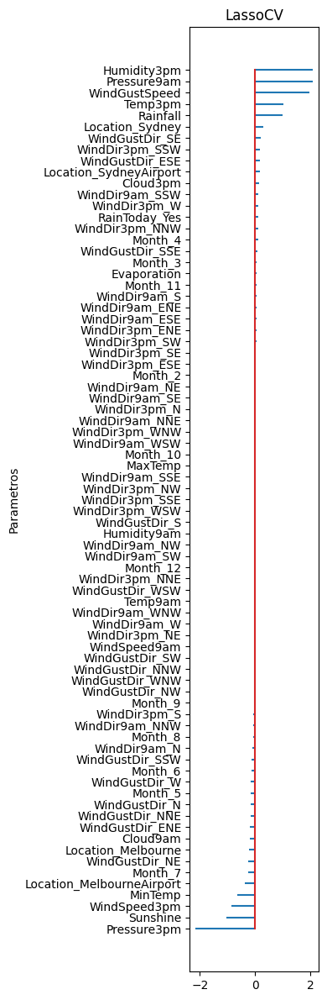

In [266]:
# prueba de los metodos con todo el data set, usando Lasso
example1=evaluate_models(df_reg,[make_pipeline(StandardScaler(),LassoCV())],plot_errors=False)

In [267]:
example1["LassoCV"].describe()

count    77.000000
mean      0.037192
std       0.541462
min      -2.160500
25%      -0.054620
50%       0.000000
75%       0.063332
max       2.091263
Name: LassoCV, dtype: float64

### Balanceo de datos
Como habiamos visto, los datos no se encuentran balanceados.
Intentaremos realizar un downsamplin de la clase predominante para ver como esto afecta a los resultados.


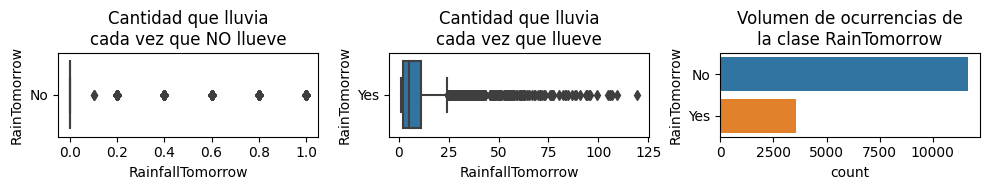

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,11643.0,0.073916,0.198571,0.0,0.0,0.0,0.0,1.0
Yes,3556.0,9.599663,12.787249,1.2,2.4,5.0,11.2,119.4


In [268]:
plot_y(df_reg)

In [269]:
ori_df_bal=df_reg.groupby(["Month","RainTomorrow"])["RainfallTomorrow"].count().unstack()
ori_df_bal

RainTomorrow,No,Yes
Month,,
1,1101,251
2,852,258
3,1056,314
4,859,321
5,1139,262
6,949,366
7,962,310
8,982,290
9,948,288


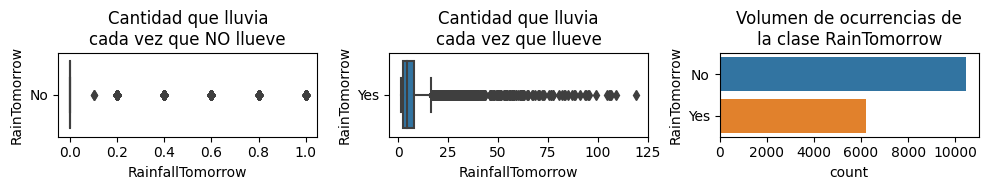

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,10479.0,0.073366,0.197439,0.0,0.0,0.0,0.0,1.0
Yes,6218.0,7.304793,10.174951,1.2,2.2,4.2,8.0,119.4


In [270]:
# criterio para establecer un peso al momento de seleccionar elementos.
a=(3*df_reg[df_reg["RainTomorrow"]=="Yes"].groupby("Month")["Date"].count().div(
    df_reg[(df_reg["RainTomorrow"]=="No")].groupby("Month")["Date"].count()))
ratio=a/a.max()
df_reg_undersampled=pd.concat([df_reg[(df_reg["RainTomorrow"]=="No")].sample(
                      frac=0.9,
                      weights=df_reg[(df_reg["RainTomorrow"]=="No")]["Month"].apply(lambda m: ratio[m])
                  ),df_reg[df_reg["RainTomorrow"]=="Yes"],
                    df_reg[(df_reg["RainTomorrow"]=="Yes")&((df_reg["RainfallTomorrow"]<df_reg[df_reg["RainTomorrow"]=="Yes"]["RainfallTomorrow"].quantile(0.75)))]
                           ]).reset_index(drop=True)
plot_y(df_reg_undersampled)

In [271]:
df_reg_undersampled.groupby(["Month","RainTomorrow"])["RainfallTomorrow"].count().unstack().compare(ori_df_bal)

RainTomorrow   No        Yes      
             self other self other
Month                             
1             901  1101  429   251
2             774   852  428   258
3             948  1056  528   314
4             811   859  556   321
5             946  1139  460   262
6             899   949  639   366
7             887   962  574   310
8             882   982  527   290
9             873   948  516   288
10            886   964  565   310
11            871   931  549   325
12            801   900  447   261

### Modelos
Ejecutaremos un conjunto de modelos de regresiones lineales a fin de comparar para un mismo conjunto de datos las diferentes métricas y las contribuciones de las variables explicativas.

In [272]:
model_pipes=lambda scaler: [
  make_pipeline(scaler(),LassoCV(alphas=np.linspace(0.001, 1,50))),
  make_pipeline(scaler(),RidgeCV(np.linspace(0.001, 1,50))),
  make_pipeline(scaler(),ElasticNetCV(
    l1_ratio=np.linspace(0.001, 1,50),
    alphas=np.logspace(-10, 10, 200),)),
  make_pipeline(LinearRegression()),
  make_pipeline(scaler(),SGDRegressor())
]

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.216892 │     79.795  │ 2.90949 │ 36.7729 │ 6.06406 │ 0.216891 │ 1.64111 │ 4.81711e+15 │    0.0213878 │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.214877 │     79.8108 │ 2.96456 │ 36.8675 │ 6.07186 │ 0.214875 │ 1.69896 │ 4.99299e+15 │    1         │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2168

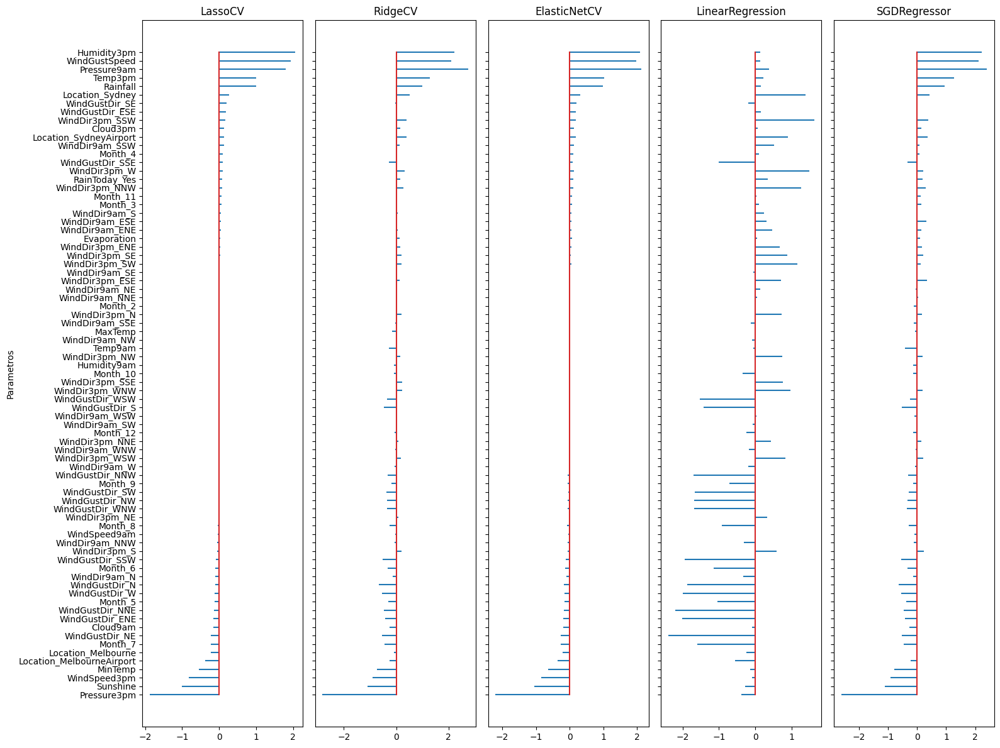

In [273]:
_=evaluate_models(df,model_pipes(StandardScaler),plot_errors=False, plot_models=True)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.216892 │     79.795  │ 2.90949 │ 36.7729 │ 6.06406 │ 0.216891 │ 1.64111 │ 4.81711e+15 │    0.0213878 │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.214877 │     79.8108 │ 2.96456 │ 36.8675 │ 6.07186 │ 0.214875 │ 1.69896 │ 4.99299e+15 │    1         │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2168

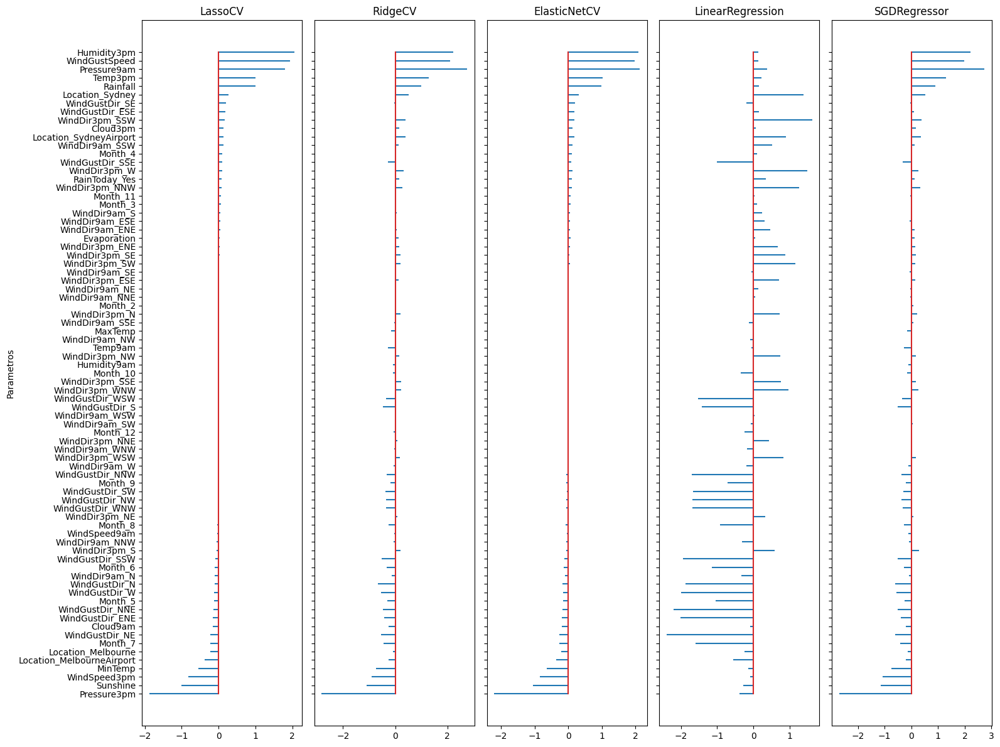

In [274]:
# df
# columnas: TODAS
# Scaler: Standard
_=evaluate_models(df_reg,model_pipes(StandardScaler),plot_errors=False, plot_models=True)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.212335 │     79.2992 │ 2.89923 │ 36.9868 │ 6.08168 │ 0.212335 │ 1.65813 │ 4.78659e+15 │    0.0213878 │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.215074 │     79.8019 │ 2.96241 │ 36.8583 │ 6.0711  │ 0.215072 │ 1.69491 │ 4.9852e+15  │    1         │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2150

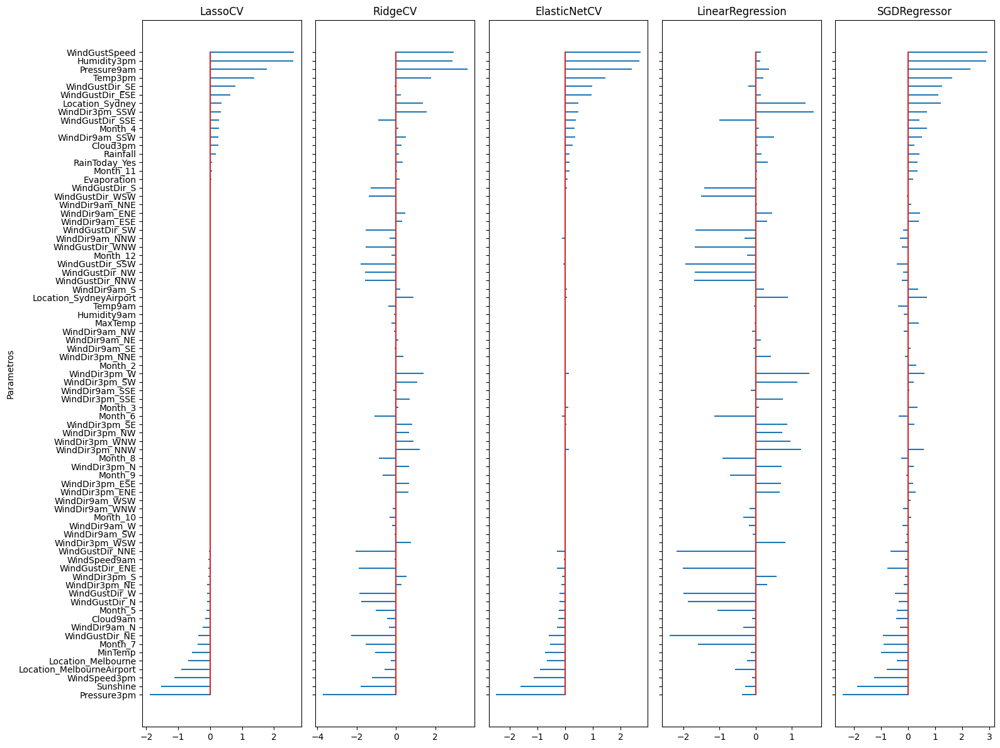

In [275]:
# df
# columnas: TODAS
# Scaler: Robust
_=evaluate_models(df_reg,model_pipes(RobustScaler),plot_errors=False, plot_models=True)

In [276]:
# df under-sampled
# columnas: TODAS
# Scaler: Standard
_=evaluate_models(df_reg_undersampled,model_pipes(StandardScaler),plot_errors=False,plot_models=False)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.1972   │     83.2403 │ 2.86858 │ 33.6687 │ 5.80247 │ 0.196355 │ 1.80818 │ 4.02745e+15 │    0.0213878 │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.196089 │     83.2576 │ 2.9057  │ 33.7138 │ 5.80636 │ 0.195279 │ 1.81602 │ 4.11748e+15 │    1         │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.1972

In [277]:
# df unser-sampled
# columnas: TODAS
# Scaler: Robust
_=evaluate_models(df_reg_undersampled,model_pipes(RobustScaler),plot_errors=False,plot_models=False)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.197786 │     82.6916 │ 2.86047 │ 33.6456 │ 5.80048 │ 0.196907 │ 1.80597 │ 4.02218e+15 │    0.0213878 │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.196115 │     83.258  │ 2.90436 │ 33.7127 │ 5.80626 │ 0.195304 │ 1.81355 │ 4.11243e+15 │    1         │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.1991

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.236841 │     76.8351 │ 3.14302 │ 37.3428 │ 6.11087 │ 0.236249 │ 1.88666 │ 5.55974e+15 │   0.001      │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.23685  │     76.8357 │ 3.14387 │ 37.3424 │ 6.11084 │ 0.236257 │ 1.88431 │ 5.56286e+15 │   1          │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2368

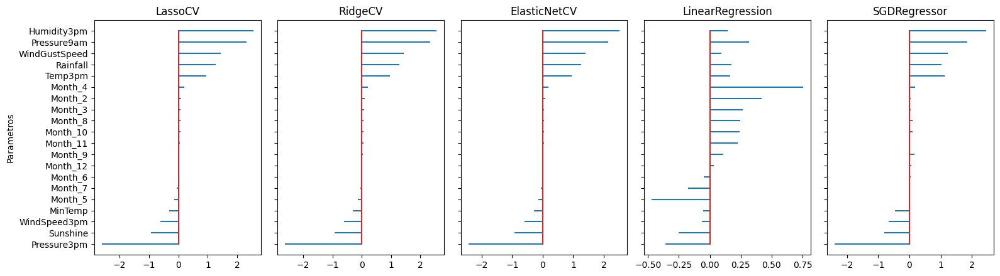

In [278]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm','Month'
# Scaler: Standard
_=evaluate_models(
    df_reg,model_pipes=model_pipes(StandardScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month']+['Date']+y_target_name)

╒══════════════════╤════════════╤═════════════╤═════════╤═════════╤═════════╤════════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │        EVS │   MAX ERROR │     MAE │     MSE │    RMSE │        R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪════════════╪═════════════╪═════════╪═════════╪═════════╪════════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │  0.236855  │     76.8435 │ 3.14226 │ 37.342  │ 6.11081 │  0.236265  │ 1.88458 │ 5.55697e+15 │   0.001      │            │
├──────────────────┼────────────┼─────────────┼─────────┼─────────┼─────────┼────────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │  0.236859  │     76.8356 │ 3.14367 │ 37.342  │ 6.11081 │  0.236266  │ 1.88324 │ 5.56217e+15 │   1          │            │
├──────────────────┼────────────┼─────────────┼─────────┼─────────┼─────────┼────────────┼─────────┼─────────────┼──────────────┼────────────┤

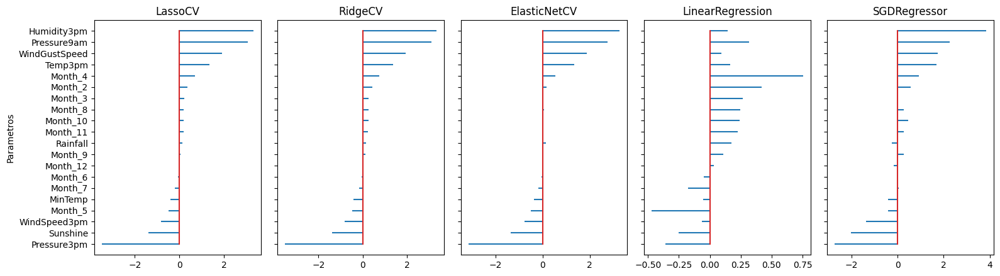

In [279]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm','Month'
# Scaler: Robust
_=evaluate_models(
    df_reg,model_pipes=model_pipes(RobustScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month']+['Date']+y_target_name)

In [280]:
_=evaluate_models(
    df_reg,model_pipes=model_pipes(RobustScaler),plot_errors=False,plot_models=False,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine',"Location"]+['Date']+y_target_name)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.238194 │     94.5747 │ 3.14554 │ 48.4111 │ 6.95781 │ 0.237897 │ 1.73825 │ 5.22034e+15 │   0.001      │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.238248 │     94.5696 │ 3.14766 │ 48.4076 │ 6.95756 │ 0.237951 │ 1.74829 │ 5.22883e+15 │   1          │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2381

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.239368 │     76.8449 │ 3.11452 │ 37.1902 │ 6.09838 │ 0.239147 │ 1.81735 │ 5.34447e+15 │  0.001       │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.239358 │     76.8488 │ 3.11554 │ 37.1908 │ 6.09842 │ 0.239137 │ 1.82056 │ 5.34809e+15 │  1           │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2394

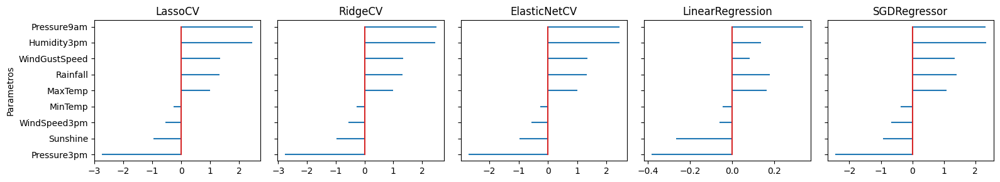

In [281]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','MaxTemp', 'MinTemp','Sunshine','WindSpeed3pm'
# Scaler: Standard
_=evaluate_models(
    df_reg,model_pipes=model_pipes(StandardScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','MaxTemp', 'MinTemp','Sunshine','WindSpeed3pm']+['Date']+y_target_name)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.246232 │     76.6722 │ 3.16133 │ 36.8862 │ 6.0734  │ 0.245588 │ 1.89188 │ 5.71732e+15 │   0.001      │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.246135 │     76.6758 │ 3.16283 │ 36.8909 │ 6.07379 │ 0.245492 │ 1.89506 │ 5.72253e+15 │   1          │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2465

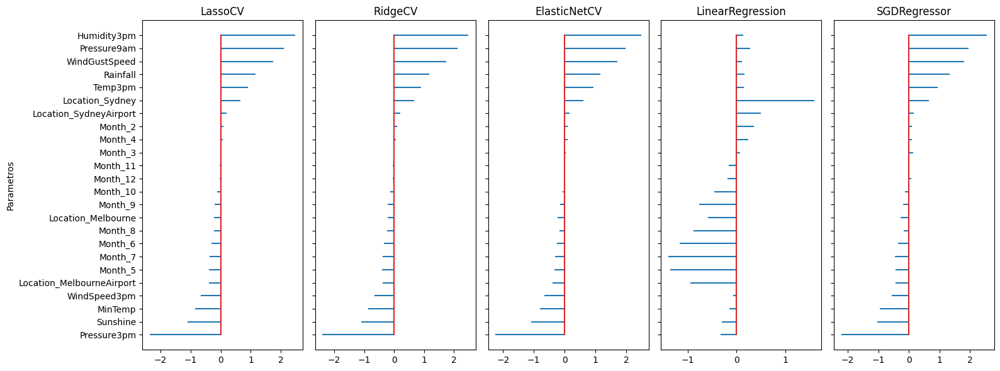

In [282]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm','Month',"location"
# Scaler: Standard
_=evaluate_models(
    df_reg,model_pipes=model_pipes(StandardScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month','Location']+['Date']+y_target_name)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.217788 │     86.5406 │ 3.03958 │ 31.1101 │ 5.57764 │ 0.217691 │ 1.81622 │ 5.51335e+15 │   0.001      │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.217541 │     86.4817 │ 3.04476 │ 31.1196 │ 5.5785  │ 0.217451 │ 1.82296 │ 5.53447e+15 │   1          │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2186

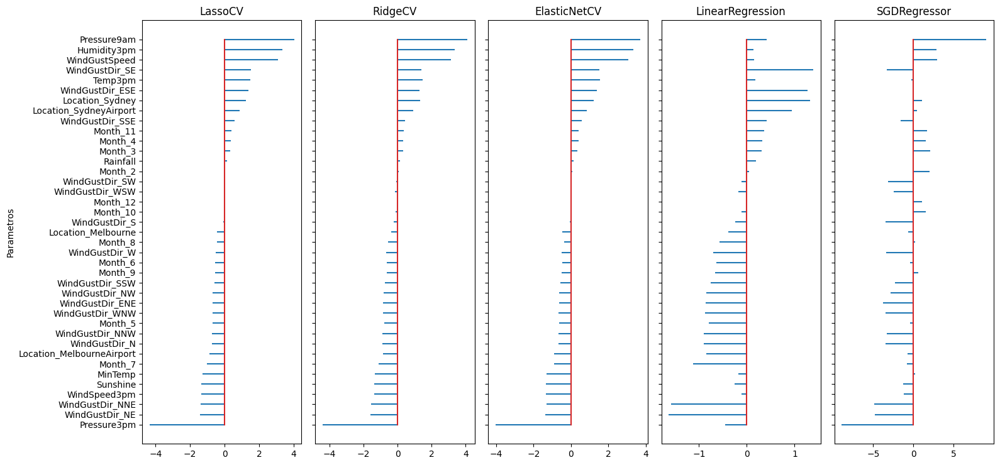

In [283]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm','Month',"location"
# Scaler: Robust
_=evaluate_models(
    df_reg,model_pipes=model_pipes(RobustScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month','Location','WindGustDir']+['Date']+y_target_name)

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.245745 │     76.7298 │ 3.16226 │ 36.9096 │ 6.07533 │ 0.245109 │ 1.90414 │ 5.70912e+15 │   0.001      │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.245362 │     76.7397 │ 3.1655  │ 36.9282 │ 6.07686 │ 0.244728 │ 1.89877 │ 5.71901e+15 │   1          │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2459

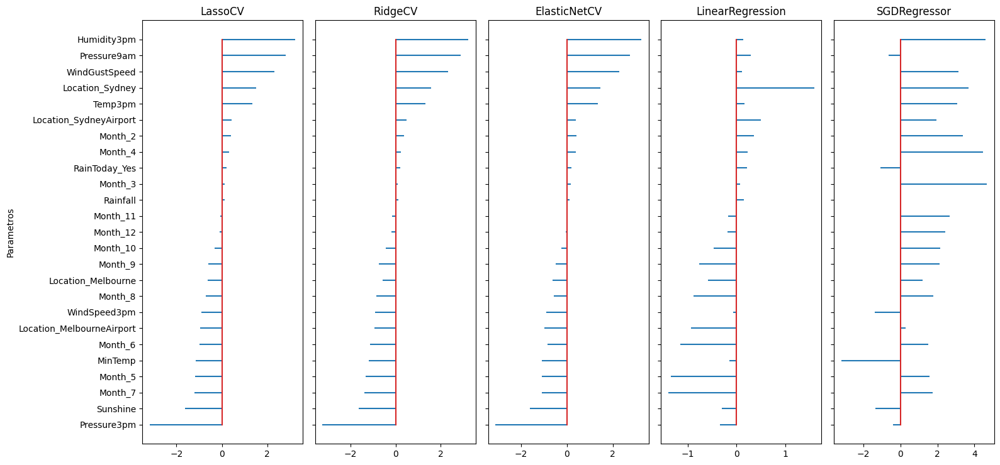

In [284]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm','Month',"location"
# Scaler: Robust
_=evaluate_models(
    df_reg,model_pipes=model_pipes(RobustScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month','Location','RainToday']+['Date']+y_target_name)

╒══════════════════╤════════════╤═════════════╤═════════╤═════════╤═════════╤═══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │        EVS │   MAX ERROR │     MAE │     MSE │    RMSE │       R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪════════════╪═════════════╪═════════╪═════════╪═════════╪═══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │  0.217292  │     86.6364 │ 3.03623 │ 31.1298 │ 5.57941 │  0.217196 │ 1.81418 │ 5.50348e+15 │   0.001      │            │
├──────────────────┼────────────┼─────────────┼─────────┼─────────┼─────────┼───────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │  0.217022  │     86.5801 │ 3.04122 │ 31.1402 │ 5.58034 │  0.216933 │ 1.82082 │ 5.52382e+15 │   1          │            │
├──────────────────┼────────────┼─────────────┼─────────┼─────────┼─────────┼───────────┼─────────┼─────────────┼──────────────┼────────────┤
│ Elas

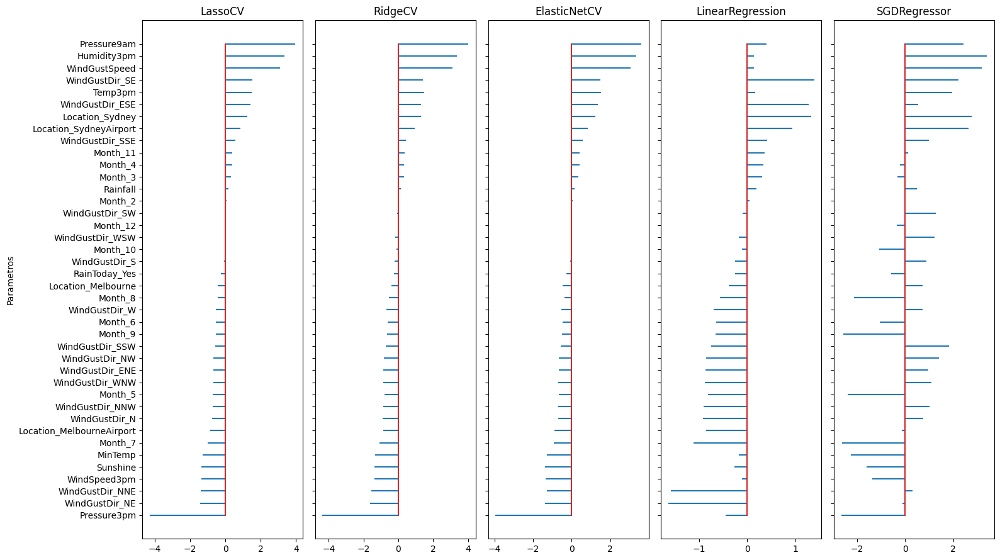

In [285]:
# df
# columnas: 'Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm','Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm','Month',"location"
# Scaler: Robust
_=evaluate_models(
    df_reg,model_pipes=model_pipes(RobustScaler),plot_errors=False,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month','Location','RainToday','WindGustDir']+['Date']+y_target_name)

### Modelo Seleccionado
Razón de su elección:
- Metodo Lasso
- $R^2$: 0.24
- MSE: 36.886

Se incluyen los diferentes graficos de residuos. En color se han separado aquellas muestras en las que SI ha llovido (rojo) y aquellas en las que NO ha llovido.

╒══════════════════╤══════════╤═════════════╤═════════╤═════════╤═════════╤══════════╤═════════╤═════════════╤══════════════╤════════════╕
│ Model Name       │      EVS │   MAX ERROR │     MAE │     MSE │    RMSE │      R^2 │    MeAE │        MAPE │   Best Alpha │   L1 ratio │
╞══════════════════╪══════════╪═════════════╪═════════╪═════════╪═════════╪══════════╪═════════╪═════════════╪══════════════╪════════════╡
│ LassoCV          │ 0.246232 │     76.6722 │ 3.16133 │ 36.8862 │ 6.0734  │ 0.245588 │ 1.89188 │ 5.71732e+15 │   0.001      │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ RidgeCV          │ 0.246135 │     76.6758 │ 3.16283 │ 36.8909 │ 6.07379 │ 0.245492 │ 1.89506 │ 5.72253e+15 │   1          │            │
├──────────────────┼──────────┼─────────────┼─────────┼─────────┼─────────┼──────────┼─────────┼─────────────┼──────────────┼────────────┤
│ ElasticNetCV     │ 0.2465

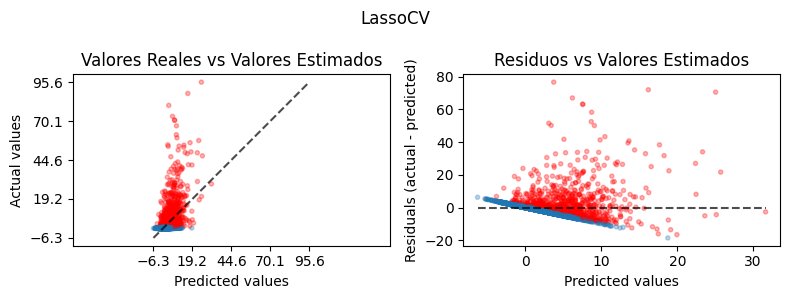

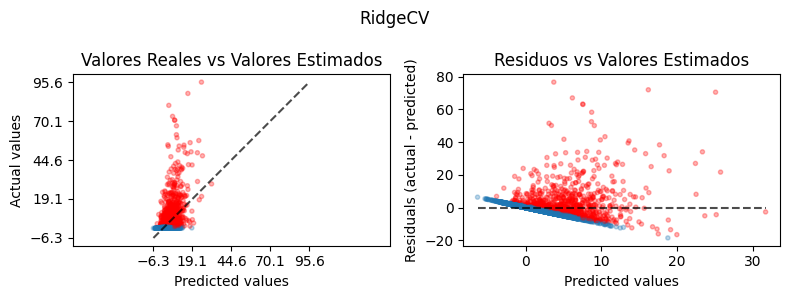

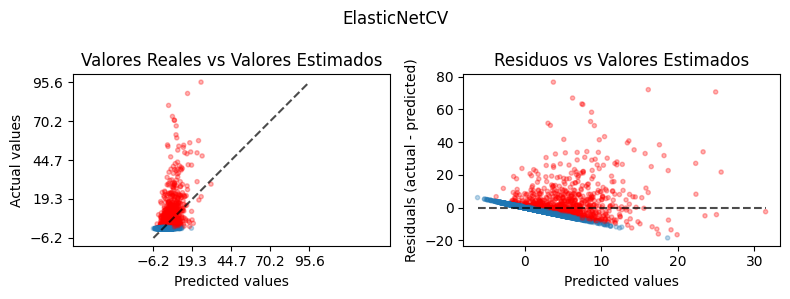

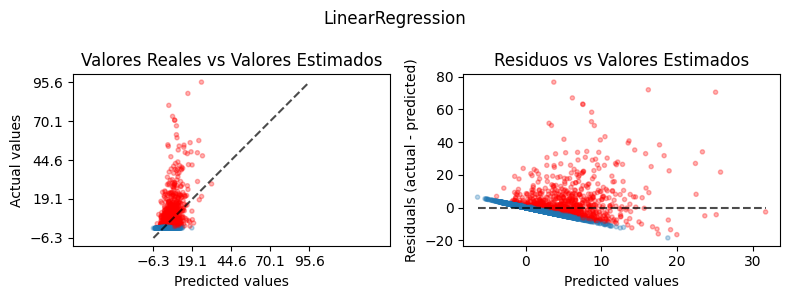

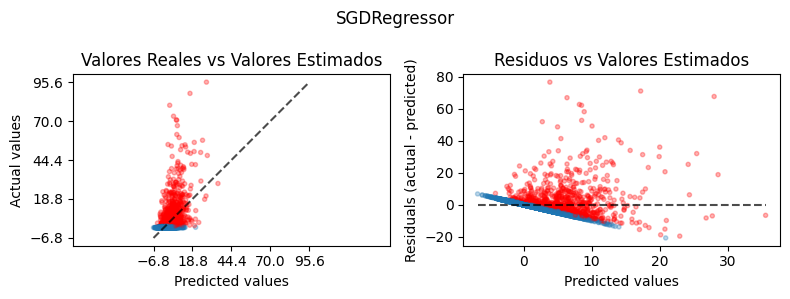

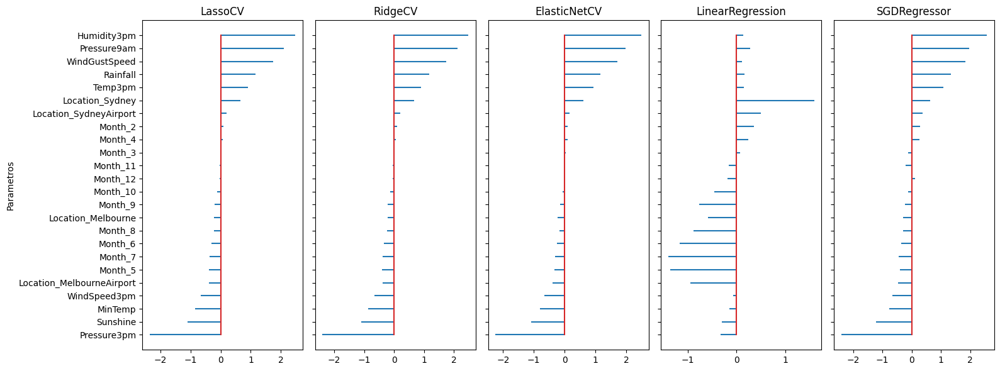

In [290]:
_=evaluate_models(
    df_reg,model_pipes=model_pipes(StandardScaler),plot_errors=True,plot_models=True,
    cols=['Humidity3pm','WindGustSpeed', 'Pressure9am', 'Pressure3pm',
          'Rainfall','Temp3pm', 'MinTemp','Sunshine','WindSpeed3pm',
          'Month','Location']+['Date']+y_target_name)

In [291]:
evaluate_metrics(y_test,y_hat)

(0.248041276523012,
 76.86295449224619,
 3.1520292342109775,
 36.79784539858888,
 6.066122764879465,
 0.2473947284775374,
 1.9026015423243545,
 5695817485834193.0)

## Red Neuronal

In [292]:
# Mismas columnas que el modelo base de regresion
model_reg_nn_columns=["Pressure3pm","Pressure9am","Humidity3pm","Sunshine",
        "WindGustSpeed","Cloud3pm", "MinTemp","Temp9am","Temp3pm",
        "WindGustDir"]
X = df[model_reg_nn_columns]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X.dropna(how="any", inplace=True)

y = df.loc[X.index]["RainfallTomorrow"]

# mitigamos el efecto del desbalanceo de datos estratificando los datos.
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y>1, random_state=777)

In [293]:
normalizer = ke.layers.Normalization()
normalizer.adapt(X_train)

model_reg_nn = ke.models.Sequential()
model_reg_nn.add(ke.Input(shape=X_train.shape[1]))
# normalizado de los datos.
model_reg_nn.add(normalizer)
model_reg_nn.add(ke.layers.Dense(512, activation='relu'))
model_reg_nn.add(ke.layers.Dropout(0.03))
model_reg_nn.add(ke.layers.Dense(128, activation='relu'))
model_reg_nn.add(ke.layers.Dense(128, activation='relu'))
model_reg_nn.add(ke.layers.Dropout(0.02))
# Como estamos estimando un valor continuo utilizamos una sola neurona lineal.
model_reg_nn.add(ke.layers.Dense(1, activation='linear'))


model_reg_nn.compile(
    # mismo optimizador de pesos descripto anteriormente
    optimizer=ke.optimizers.Adam(),
    # La función de perdida del modelo es el Error Absoluto Medio (MAE),
    # favorable para los casos donde hay presencia de outlier dado que los trata
    # de manera uniforme, en comparación al MSE por ejemplo.
    loss=ke.losses.MeanAbsoluteError(),
    # monitoreamos el modelo con estas dos metricas.
    weighted_metrics=['mean_absolute_error', 'mean_squared_error'])

model_reg_nn.summary()

Model: "sequential_140"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_3 (Normaliza  (None, 24)                49        
 tion)                                                           
                                                                 
 dense_421 (Dense)           (None, 512)               12800     
                                                                 
 dropout_279 (Dropout)       (None, 512)               0         
                                                                 
 dense_422 (Dense)           (None, 128)               65664     
                                                                 
 dense_423 (Dense)           (None, 128)               16512     
                                                                 
 dropout_280 (Dropout)       (None, 128)               0         
                                                    

In [294]:
model_reg_nn.fit(X_train, y_train,
          # 10 veces los datos pasaran por el modelo para modificar sus parametros
          epochs=10,
          # iran pasando de a 8 registros juntos para ser procesados en conjunto
          # para ajustar en cada paso sus pesos.
          batch_size=8,
          # utilizado para evaluar el modelo luego de cada epoca.
          validation_data=(X_test, y_test),
          workers=-1)

Epoch 1/10
1202/1202 [==============================] - 11s 5ms/step - loss: 2.1235 - mean_absolute_error: 2.1235 - mean_squared_error: 47.4122 - val_loss: 1.9956 - val_mean_absolute_error: 1.9956 - val_mean_squared_error: 39.4346
Epoch 2/10
1202/1202 [==============================] - 6s 5ms/step - loss: 2.0287 - mean_absolute_error: 2.0287 - mean_squared_error: 43.2094 - val_loss: 2.0009 - val_mean_absolute_error: 2.0009 - val_mean_squared_error: 41.5133
Epoch 3/10
1202/1202 [==============================] - 7s 6ms/step - loss: 2.0007 - mean_absolute_error: 2.0007 - mean_squared_error: 42.1663 - val_loss: 1.9579 - val_mean_absolute_error: 1.9579 - val_mean_squared_error: 38.4805
Epoch 4/10
1202/1202 [==============================] - 8s 7ms/step - loss: 1.9814 - mean_absolute_error: 1.9814 - mean_squared_error: 41.2593 - val_loss: 2.0026 - val_mean_absolute_error: 2.0026 - val_mean_squared_error: 39.2078
Epoch 5/10
1202/1202 [==============================] - 7s 6ms/step - loss: 1.9

101/101 [==============================] - 0s 2ms/step
EVS 0.2398
MAX ERROR 86.93
MAE 1.973
MSE 39.6
RMSE 6.293
R2 0.1905
MeAE 0.0004306
MAPE 1.436e+14


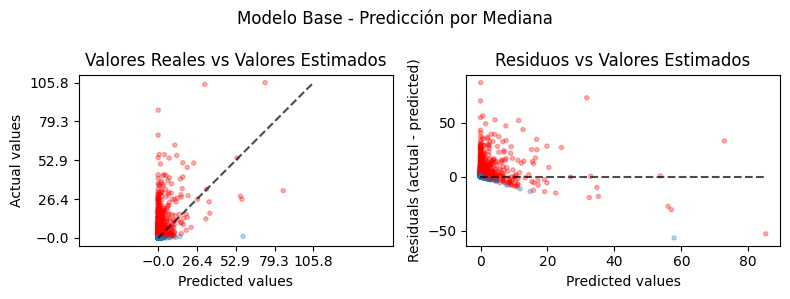

In [295]:
y_hat = model_reg_nn.predict(X_test).reshape(-1)

print("EVS",format(explained_variance_score(y_test, y_hat),".4"))
print("MAX ERROR",format(max_error(y_test, y_hat),".4"))
print("MAE",format(mean_absolute_error(y_test, y_hat),".4"))
print("MSE",format(mean_squared_error(y_test, y_hat),".4"))
print("RMSE",format(mean_squared_error(y_test, y_hat, squared = False),".4"))
print("R2",format(r2_score(y_test, y_hat),".4"))
print("MeAE",format(median_absolute_error(y_test, y_hat),".4"))
print("MAPE",format(mean_absolute_percentage_error(y_test, y_hat),".4"))

fig, axs = plt.subplots(ncols=2, figsize=(8, 3))
# aquellos en los que si llovio al dia siguiente estan muy mal estimados.
scatter_kwards=dict(
    alpha=0.3,
    marker='.',
    color=['r' if v else 'tab:blue' for v in df.loc[X_test.index]['RainTomorrow']=='Yes'],
    )
PredictionErrorDisplay(y_true=y_test,y_pred=y_hat).plot(ax=axs[0],kind="actual_vs_predicted",scatter_kwargs=scatter_kwards)
PredictionErrorDisplay(y_true=y_test,y_pred=y_hat).plot(ax=axs[1],kind="residual_vs_predicted",scatter_kwargs=scatter_kwards)
axs[0].set_title("Valores Reales vs Valores Estimados")
axs[1].set_title("Residuos vs Valores Estimados")
fig.suptitle("Modelo Base - Predicción por Mediana")
fig.tight_layout()
fig.show()

Aqui podemos observar que el modelo, aún no está siendo lo suficientemente capaz de pronosticar la cantidad de lluvia cuando llueve.

Aqui podemos observar las metricas del modelo base:

| Metrica | Modelo Base | Red Neuronal | Comentario |
| --- | --- | --- | --- |
| EVS | `0.0` | `0.2811` | La variablidad de los datos es explicada en un 28% por la RN |
| MAX ERROR | `95.6` | `86.86` | Su peor predicción estuvo mas cerca de su valor correspondiente |
| MAE | `2.357` | `1.958` | El desvio promedio de la cantidad de lluvia fue menor |
| MSE | `55.39` | `36.68` | fueron menores las diferencias con los valores mas dispares |
| RMSE | `7.442` | `6.056` | |
| R2 | `-0.1114` | `0.2502` | Con las columnas utilizadas, podemos explicar el 25% de los datos a diferencia del valor negativo, el cual es peor que predecir la media de los datos.
| MeAE | `0.0` | `0.0001656` |  |
| MAPE | `0.3902` | `3.422e+14` | ?? |











## Optimización de hiperparámetros para la Red Neuronal empleada en la regresión. Aplicaremos Optuna

Dado que grid search tardaría demasiado aplicándolo a redes neuronales y que RandomSearch no necesariamente encontrará los mejores hiperparámetros, optamos por usar Optuna.

In [296]:
import optuna
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

model_reg_nn_columns = [
    "Pressure3pm", "Pressure9am", "Humidity3pm", "Sunshine",
    "WindGustSpeed", "Cloud3pm", "MinTemp", "Temp9am", "Temp3pm",
    "WindGustDir"
]
X = df[model_reg_nn_columns]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X.dropna(how="any", inplace=True)

y = df.loc[X.index]["RainfallTomorrow"]  # Cambiar a la variable de regresión

# mitigamos el efecto del desbalanceo de datos estratificando los datos.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=777)

# Define tu función objetivo para la optimización de Optuna
def objective(trial):
    # Define los hiperparámetros que deseas optimizar
    num_layers = trial.suggest_int('num_layers', 1, 5)

    # Usa una distribución más amplia para la cantidad de neuronas
    num_neurons = [trial.suggest_int(f'num_neurons_layer_{i}', 16, 512) for i in range(num_layers, 0, -1)]

    dropout_rate = trial.suggest_uniform('dropout_rate', 0.0, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)

    # Crea tu modelo de regresión de redes neuronales con los hiperparámetros sugeridos por Optuna
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Input(shape=(X_train.shape[1],)))

    for i in range(num_layers):
        model.add(tf.keras.layers.Dense(num_neurons[i], activation='relu'))
        model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(ke.layers.Dense(1, activation='linear'))


    model.compile(
    # mismo optimizador de pesos descripto anteriormente
    optimizer=ke.optimizers.Adam(learning_rate=learning_rate),
    # La función de perdida del modelo es el Error Absoluto Medio (MAE),
    # favorable para los casos donde hay presencia de outlier dado que los trata
    # de manera uniforme, en comparación al MSE por ejemplo.
    loss=ke.losses.MeanAbsoluteError(),
    # monitoreamos el modelo con estas dos metricas.
    weighted_metrics=['mean_absolute_error', 'mean_squared_error'])

    # Entrena el modelo
    model.fit(X_train, y_train, epochs=5, batch_size=16, validation_data=(X_val, y_val), verbose=0)

    # Evalúa el modelo en el conjunto de validación
    y_val_pred = model.predict(X_val)

    # Calcula el error cuadrático medio
    mse = mean_squared_error(y_val, y_val_pred)
    return -mse  # Devolver negativo porque Optuna maximiza y queremos minimizar el MSE

# Divide tu conjunto de datos en entrenamiento y validación
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Crea un estudio de Optuna y optimiza la función objetivo
study = optuna.create_study(direction='minimize')  # Cambiar a 'minimize' para minimizar el MSE
study.optimize(objective, n_trials=30)

# Obtiene los mejores hiperparámetros encontrados por Optuna
best_params = study.best_params
print('Optimal Hyperparameters:', best_params)

# Crea el modelo final con los hiperparámetros óptimos y compílalo
model_reg_nn_optuna = tf.keras.models.Sequential()
for i in range(best_params['num_layers']):
    model_reg_nn_optuna.add(tf.keras.layers.Dense(best_params[f'num_neurons_layer_{i+1}'], activation='relu'))
    model_reg_nn_optuna.add(tf.keras.layers.Dropout(best_params['dropout_rate']))
model_reg_nn_optuna.add(tf.keras.layers.Dense(1, activation='linear'))

model_reg_nn_optuna.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
    loss='mean_squared_error',
    metrics=['mean_squared_error']
)

# Entrena el modelo final con los hiperparámetros óptimos
model_reg_nn_optuna.fit(X_train, y_train, epochs=5, batch_size=16)

# Evalúa el modelo final en el conjunto de prueba
y_test_pred = model_reg_nn_optuna.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
print("Test Mean Squared Error for the Final Model:", mse_test)


[I 2023-12-08 00:51:57,908] A new study created in memory with name: no-name-6a5f5b5a-266f-41b3-8132-4f79a35d6887


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:52:30,787] Trial 0 finished with value: -76.08134230373692 and parameters: {'num_layers': 5, 'num_neurons_layer_5': 206, 'num_neurons_layer_4': 303, 'num_neurons_layer_3': 485, 'num_neurons_layer_2': 176, 'num_neurons_layer_1': 131, 'dropout_rate': 0.3633369651269973, 'learning_rate': 0.002137774539150012}. Best is trial 0 with value: -76.08134230373692.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:52:47,728] Trial 1 finished with value: -76.09104714947513 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 444, 'num_neurons_layer_1': 230, 'dropout_rate': 0.06709586761498815, 'learning_rate': 8.830269059728447e-05}. Best is trial 1 with value: -76.09104714947513.


81/81 [==============================] - 0s 4ms/step


[I 2023-12-08 00:53:10,454] Trial 2 finished with value: -76.09388632485074 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 113, 'num_neurons_layer_3': 412, 'num_neurons_layer_2': 190, 'num_neurons_layer_1': 282, 'dropout_rate': 0.29062250388518696, 'learning_rate': 0.00402440654061681}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:53:22,380] Trial 3 finished with value: -76.07922540032115 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 177, 'num_neurons_layer_1': 237, 'dropout_rate': 0.37920999890125445, 'learning_rate': 0.0030032368798175633}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 1s 5ms/step


[I 2023-12-08 00:54:06,460] Trial 4 finished with value: -76.08970772268184 and parameters: {'num_layers': 5, 'num_neurons_layer_5': 202, 'num_neurons_layer_4': 444, 'num_neurons_layer_3': 408, 'num_neurons_layer_2': 104, 'num_neurons_layer_1': 237, 'dropout_rate': 0.42657294823126407, 'learning_rate': 7.366052204706112e-05}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:54:15,974] Trial 5 finished with value: -76.08947123401208 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 464, 'num_neurons_layer_1': 80, 'dropout_rate': 0.2580808919960932, 'learning_rate': 0.0009926142863425711}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:54:43,264] Trial 6 finished with value: -76.08909994106254 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 305, 'num_neurons_layer_3': 250, 'num_neurons_layer_2': 373, 'num_neurons_layer_1': 393, 'dropout_rate': 0.29594670069410245, 'learning_rate': 0.00023198546137817499}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:55:05,290] Trial 7 finished with value: -75.40952055355581 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 224, 'num_neurons_layer_2': 391, 'num_neurons_layer_1': 99, 'dropout_rate': 0.4705825990633642, 'learning_rate': 3.593680000950464e-05}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:55:47,814] Trial 8 finished with value: -76.09003881022267 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 480, 'num_neurons_layer_2': 453, 'num_neurons_layer_1': 411, 'dropout_rate': 0.2600821963095527, 'learning_rate': 0.0039131124527536625}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:55:59,009] Trial 9 finished with value: -75.80469992012023 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 399, 'dropout_rate': 0.1799273478026049, 'learning_rate': 0.005421012049256119}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:56:10,654] Trial 10 finished with value: -76.06740041467768 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 41, 'num_neurons_layer_3': 20, 'num_neurons_layer_2': 20, 'num_neurons_layer_1': 326, 'dropout_rate': 0.1571763634985447, 'learning_rate': 0.008116490042695414}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:56:22,462] Trial 11 finished with value: -69.83572320494365 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 187, 'dropout_rate': 0.05237054328352921, 'learning_rate': 1.1443484060023205e-05}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:57:05,701] Trial 12 finished with value: -76.08935237460445 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 47, 'num_neurons_layer_3': 365, 'num_neurons_layer_2': 293, 'num_neurons_layer_1': 491, 'dropout_rate': 0.011328430934272098, 'learning_rate': 0.0004726610165174823}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:57:18,018] Trial 13 finished with value: -76.0856154350664 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 250, 'num_neurons_layer_1': 306, 'dropout_rate': 0.12856413630119107, 'learning_rate': 0.00020336670452923846}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:57:27,872] Trial 14 finished with value: -76.08910330276558 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 126, 'num_neurons_layer_2': 307, 'num_neurons_layer_1': 24, 'dropout_rate': 0.07788625825430666, 'learning_rate': 0.0010544584349072822}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:57:50,524] Trial 15 finished with value: -76.08950837518337 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 165, 'num_neurons_layer_3': 342, 'num_neurons_layer_2': 172, 'num_neurons_layer_1': 175, 'dropout_rate': 0.2007888991531417, 'learning_rate': 0.00011487076259078253}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:58:02,555] Trial 16 finished with value: -76.09058748232091 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 239, 'num_neurons_layer_1': 310, 'dropout_rate': 0.11068311194771568, 'learning_rate': 0.00910482344470251}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 00:58:36,152] Trial 17 finished with value: -75.72433873700118 and parameters: {'num_layers': 5, 'num_neurons_layer_5': 512, 'num_neurons_layer_4': 184, 'num_neurons_layer_3': 313, 'num_neurons_layer_2': 506, 'num_neurons_layer_1': 256, 'dropout_rate': 0.006131818127090183, 'learning_rate': 0.00044675423625681234}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 1ms/step


[I 2023-12-08 00:58:45,176] Trial 18 finished with value: -62.1625026078678 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 192, 'dropout_rate': 0.22025947851550187, 'learning_rate': 0.0015617327910257318}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:59:27,655] Trial 19 finished with value: -76.08731495841529 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 430, 'num_neurons_layer_2': 344, 'num_neurons_layer_1': 353, 'dropout_rate': 0.30102168980439725, 'learning_rate': 0.000720812554840195}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 00:59:49,658] Trial 20 finished with value: -76.08779672102254 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 164, 'num_neurons_layer_2': 90, 'num_neurons_layer_1': 460, 'dropout_rate': 0.15223337953279137, 'learning_rate': 0.002686407159076214}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 01:00:01,597] Trial 21 finished with value: -76.07130357821589 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 238, 'num_neurons_layer_1': 290, 'dropout_rate': 0.10729479637067563, 'learning_rate': 0.008345337874399065}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 01:00:15,193] Trial 22 finished with value: -76.06294563017106 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 219, 'num_neurons_layer_1': 349, 'dropout_rate': 0.10087616345551864, 'learning_rate': 0.008398545765200415}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 01:00:27,332] Trial 23 finished with value: -76.08908499726758 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 130, 'num_neurons_layer_1': 274, 'dropout_rate': 0.05142285065275785, 'learning_rate': 0.00453192928196111}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 1ms/step


[I 2023-12-08 01:00:38,850] Trial 24 finished with value: -66.31721828216905 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 225, 'dropout_rate': 0.13879670125379123, 'learning_rate': 0.0014086255362474088}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 2ms/step


[I 2023-12-08 01:00:51,774] Trial 25 finished with value: -76.08232389257378 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 19, 'num_neurons_layer_2': 207, 'num_neurons_layer_1': 334, 'dropout_rate': 0.17491324906345443, 'learning_rate': 0.009948132440142544}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 01:01:34,492] Trial 26 finished with value: -76.09332486160308 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 510, 'num_neurons_layer_3': 303, 'num_neurons_layer_2': 286, 'num_neurons_layer_1': 136, 'dropout_rate': 0.06010115508978411, 'learning_rate': 0.0025646597464830507}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 4ms/step


[I 2023-12-08 01:02:07,242] Trial 27 finished with value: -76.08714304641799 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 433, 'num_neurons_layer_3': 288, 'num_neurons_layer_2': 427, 'num_neurons_layer_1': 127, 'dropout_rate': 0.06365268105000785, 'learning_rate': 0.00208949782107993}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 5ms/step


[I 2023-12-08 01:02:36,925] Trial 28 finished with value: -76.0898451080275 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 504, 'num_neurons_layer_3': 392, 'num_neurons_layer_2': 298, 'num_neurons_layer_1': 160, 'dropout_rate': 0.21391097783124258, 'learning_rate': 0.0006986259547887278}. Best is trial 2 with value: -76.09388632485074.


81/81 [==============================] - 0s 3ms/step


[I 2023-12-08 01:03:20,167] Trial 29 finished with value: -76.0838162485238 and parameters: {'num_layers': 5, 'num_neurons_layer_5': 20, 'num_neurons_layer_4': 161, 'num_neurons_layer_3': 512, 'num_neurons_layer_2': 345, 'num_neurons_layer_1': 39, 'dropout_rate': 0.03619436402482047, 'learning_rate': 0.0016879142657967102}. Best is trial 2 with value: -76.09388632485074.


Optimal Hyperparameters: {'num_layers': 4, 'num_neurons_layer_4': 113, 'num_neurons_layer_3': 412, 'num_neurons_layer_2': 190, 'num_neurons_layer_1': 282, 'dropout_rate': 0.29062250388518696, 'learning_rate': 0.00402440654061681}
Epoch 1/5
641/641 [==============================] - 4s 5ms/step - loss: 258.1844 - mean_squared_error: 258.1844
Epoch 2/5
641/641 [==============================] - 3s 5ms/step - loss: 52.8816 - mean_squared_error: 52.8816
Epoch 3/5
641/641 [==============================] - 5s 7ms/step - loss: 52.5923 - mean_squared_error: 52.5923
Epoch 4/5
641/641 [==============================] - 3s 4ms/step - loss: 52.3964 - mean_squared_error: 52.3964
Epoch 5/5
81/81 [==============================] - 0s 3ms/step
Test Mean Squared Error for the Final Model: 49.99256632086533


In [297]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Predicciones del modelo en el conjunto de prueba
y_test_pred = model_reg_nn_optuna.predict(X_test)

# Métricas de regresión
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Test Mean Squared Error:", mse_test)
print("Test Mean Absolute Error:", mae_test)
print("Test R2 Score:", r2_test)


81/81 [==============================] - 0s 4ms/step
Test Mean Squared Error: 49.99256632086533
Test Mean Absolute Error: 3.9048572552924505
Test R2 Score: -0.001846955393291827


# **Clasificación $y$ `RainTomorrow`**

Al igualq ue con el metodo anterior, comenzaremos por establecer un modelo base con el cual tener de referencia para poder comparar el performance de los modelos que iremos creando.

## Modelo Base

Se opta por utilizar como clasificador booleano para `RainTomorrow` el modelo base _Basado En La Mayoría_ el cual es útil para problemas de clasificación binario como el nuestro.

Éste método consiste en clasificar en forma constante el valor de la clase mayoritaria.


In [298]:
from sklearn.dummy import DummyClassifier
mode_clf_dummy = DummyClassifier(strategy="most_frequent")

# Mismas columnas elegidas del modelo de regresion logistica
X = df[[
        "Pressure3pm","Pressure9am","Humidity3pm","Sunshine",
        "WindGustSpeed","Cloud3pm", "MinTemp","Temp9am","Temp3pm",
        "WindGustDir"
    ]]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X.dropna(how="any", inplace=True)

y = df.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777)

mode_clf_dummy.fit(X_train, y_train)

DummyClassifier(strategy='most_frequent')

              precision    recall  f1-score   support

           0       0.76      1.00      0.86      2432
           1       0.00      0.00      0.00       774

    accuracy                           0.76      3206
   macro avg       0.38      0.50      0.43      3206
weighted avg       0.58      0.76      0.65      3206



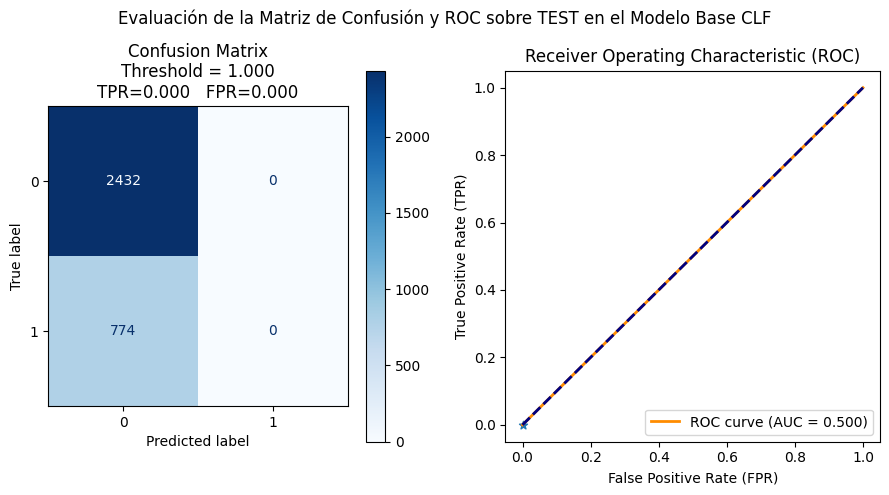

In [299]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve

# Con la estimación de las probabilidades podemos contruir la curva ROC
y_prob = mode_clf_dummy.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

# Posicion del indice que corresponde al umbral 0.5
curr_index = np.abs(thresholds - 0.5).argmin()
y_curr = tpr[curr_index]
x_curr = fpr[curr_index]


y_pred = mode_clf_dummy.predict(X_test)

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(9, 5))
fig.suptitle("Evaluación de la Matriz de Confusión y ROC sobre TEST en el Modelo Base CLF")

# Lado Izquierdo - Matriz de Confusion
ConfusionMatrixDisplay(
    confusion_matrix(y_test, y_pred),
    display_labels=mode_clf_dummy.classes_,
).plot(cmap=plt.cm.Blues, ax=axs[0])
axs[0].set_title(f"Confusion Matrix\nThreshold = {thresholds[curr_index]:0.3f}\nTPR={y_curr:0.3f}   FPR={x_curr:0.3f}")

# Lado Derecho - ROC
axs[1].plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (AUC = {roc_auc:0.3f})")
axs[1].plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
axs[1].set_xlim([-0.05, 1.05])
axs[1].set_ylim([-0.05, 1.05])
axs[1].set_ylabel("True Positive Rate (TPR)")
axs[1].set_xlabel("False Positive Rate (FPR)")
axs[1].set_title("Receiver Operating Characteristic (ROC)")
axs[1].legend(loc="lower right")

axs[1].scatter(
    x=x_curr, y=y_curr, marker="*", label=f"Threshold = {thresholds[curr_index]:0.3f}"
)

fig.tight_layout()
fig.show()

report_clf_base=classification_report(y_test, y_pred)
print(report_clf_base)

La presición obtenida es equivalente a predecir siempre que no lloverá, habría asertado un 76% de los casos según nuestro data set.

El cual podemos verificarlo rápidamente contando la cantidad de cada valor de la variable a predecir.

In [300]:
df.value_counts("RainTomorrow", normalize=True)

RainTomorrow
No     0.766037
Yes    0.233963
dtype: float64

En consecuencia, nuestro modelo dirá todas las predicciones que NO lloverá pero éste tendra una eficiencia del 76%.

## Regresión Logística

El dataset que utilizaremos, `df_class` es el mismo que hemos utilizado para la regresión lineal,
el cual presenta un desbalanceo en su variable dependiente $y$.

Como **NO** haremos un balanceo de las clases en nuestro dataset, tomaremos el recaudo al momento
de separar las instancias de entrenamiento y test mediante `train_test_split` de estratificar las clases para
que se preserven las proporciones tanto en test como en train.

Asi mismo, al momento de instanciar el modelo de regresión logaritmica con `LogisticRegression`,
especificaremos `class_weight="balanced"` para que se ajusten los pesos de entrenamiento de las clases
en forma inversa a la presencia de las mismas.

In [301]:
# Hacemos una copia del df para trabajar exclusivamente con regresion.
df_class=df.copy()

Para poder graficar y ejemplificar los diferentes resultados según vamos seleccionando diferentes caracteristicas,
vamos a crear una función `plot_logreg` para realizar en forma conjunta:
- Graficar la _Matriz de Confusión_ utilizando datos de test:
    - con el umbral por defecto (`0.5`).
    - con el umbral optimizado por la heuristica de la menor distancia al punto de maximo valor de recall y de specificity `(0,1)` en la curva ROC.
        - Esta optimización se logra tomando la menor distancia euclidiana al clasificador perfecto `(0,1)`, el cual nos indica el valor del umbral de clasificación que más balancea los TPR y los FPR hacia éste clasificador.
            - se prefiere aumentar el **recall** para alertar preventivamente casos de lluvia.
$$\min{\text{distance}} = \sqrt{(1-TPR)^2 + FPR^2}$$
- Graficar la curva _Receiver Operating Characteristic (ROC)_ y en esta:
    - el valor de `AUC`
    - identificamos los valores de _TPR_ y _FPR_ para los umbrales `0.5` y óptimo.
- Los valores de las métricas para los umbrales standart `0.5` y optimo:
    - _accuracy_
    - _precision_
    - _recall_
    - _F1 Score_

In [302]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve


def plot_logreg(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)

    # Con la estimación de las probabilidades podemos contruir la curva ROC
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = roc_auc_score(y_test, y_prob)

    # Posicion del indice que corresponde al umbral 0.5
    curr_index = np.abs(thresholds - 0.5).argmin()
    # Posicion del indice que corresponde al umbral que posee los valores mas cercanos a (0,1) para TPR y FPR
    optimal_index = ((1 - tpr**2) + fpr**2).argmin()

    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred)

    # Adaptamos el umbral al ratio optimo
    y_pred_opt = (y_prob >= thresholds[optimal_index]).astype(int)
    report_opt = classification_report(y_test, y_pred_opt)

    # Plotting
    fig, axs = plt.subplots(1, 3, figsize=(13, 5))
    fig.suptitle("Evaluación de la Matriz de Confusión y ROC sobre TEST")
    axs[1].plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (AUC = {roc_auc:0.3f})")
    axs[1].plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
    axs[1].set_xlim([-0.05, 1.05])
    axs[1].set_ylim([-0.05, 1.05])
    axs[1].set_ylabel("True Positive Rate (TPR)")
    axs[1].set_xlabel("False Positive Rate (FPR)")
    axs[1].set_title("Receiver Operating Characteristic (ROC)")
    for i, (t, idx) in enumerate([("Current", curr_index), ("Optimal", optimal_index)]):
        y_opt = tpr[idx]
        x_opt = fpr[idx]
        axs[1].scatter(
            x=x_opt, y=y_opt, marker="*", label=f"{t} Threshold = {thresholds[idx]:0.3f}"
        )
        ConfusionMatrixDisplay(
            confusion_matrix(y_test, y_pred if i == 0 else y_pred_opt),
            display_labels=model.classes_,
        ).plot(cmap=plt.cm.Blues, ax=axs[i * 2])
        axs[i * 2].set_title(f"Confusion Matrix\nThreshold = {thresholds[idx]:0.3f}\nTPR={y_opt:0.3f}   FPR={x_opt:0.3f}")
    axs[1].legend(loc="lower right")
    fig.tight_layout()
    fig.show()

    return report, report_opt, fpr, tpr, thresholds, roc_auc

Exploramos todas las columnas numericas existentes juntas, descartando los valores faltantes y normalizando con el `StandardScaler` los valores.

REPORTE THRESHOLD STANDART (0.5)
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      2261
           1       0.52      0.77      0.62       697

    accuracy                           0.78      2958
   macro avg       0.72      0.77      0.73      2958
weighted avg       0.82      0.78      0.79      2958

REPORTE THRESHOLD OPTIMIZADO
              precision    recall  f1-score   support

           0       0.94      0.66      0.77      2261
           1       0.44      0.87      0.58       697

    accuracy                           0.71      2958
   macro avg       0.69      0.76      0.68      2958
weighted avg       0.82      0.71      0.73      2958



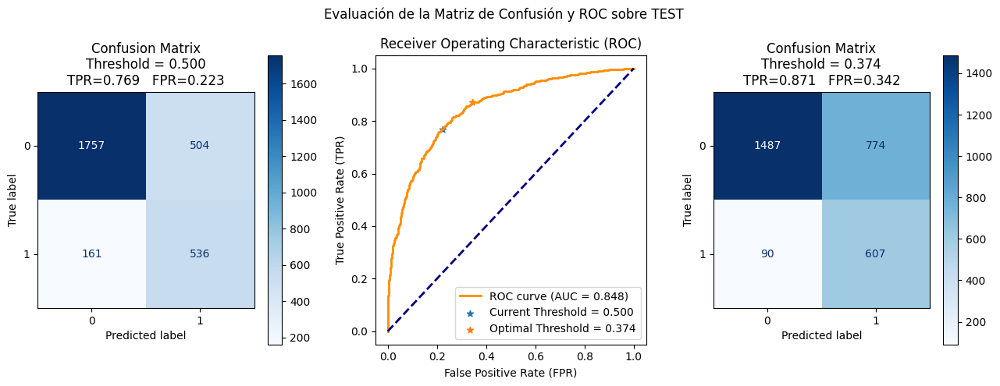

In [303]:
from sklearn.linear_model import LogisticRegression

X = df_class.drop(columns=y_target_name).select_dtypes(np.number).dropna(how="any")
X = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns, index=X.index)
y = df_class.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

# Estratificamos las presencia de la clase minoritaria con `stratify`
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777)

# Ajustamos el peso de las clases con `class_weight`
model_logreg_balanced = LogisticRegression(class_weight="balanced", random_state=777)
report_balanced, report_balanced_opt, *_ = plot_logreg(
    model_logreg_balanced, X_train, X_test, y_train, y_test
)
print("REPORTE THRESHOLD STANDART (0.5)", report_balanced, sep="\n")
print("REPORTE THRESHOLD OPTIMIZADO", report_balanced_opt, sep="\n")

Al contemplar las graficas sobre los datos de **test**, podemos observar:
- Podemos identificar como el área bajo la curva es de `0.848` indicando que nuestro clasificador es "bueno" y ademas visualmente tiene una buena separación con la curva identidad (la cual tiene chances de predicción "random" `50%`).
- A su vez para el threshold standart de `0.5`, podriamos decir que un `76%` de los casos en los que llueve, nuestro modelo nos alertaría y que en un `22%` daría un falso pronostico.
- Cuando miramos el optimizado, el cual tiene un umbral de `0.374`, vemos que hemos tenido una mejoría de las identificaciones de los casos de lluvia `87%`, pero al costo de aumentar los falsos positivos.

Exploramos ahora los resultados obtenidos al incluir **todas** las columnas de nuestro dataset (excepto `Date`).

Al igual que antes, también estandarizamos los valores numericos y eliminamos los valores faltantes.

REPORTE THRESHOLD STANDART (0.5)
              precision    recall  f1-score   support

           0       0.91      0.78      0.84      2261
           1       0.51      0.76      0.61       697

    accuracy                           0.77      2958
   macro avg       0.71      0.77      0.73      2958
weighted avg       0.82      0.77      0.79      2958

REPORTE THRESHOLD OPTIMIZADO
              precision    recall  f1-score   support

           0       0.95      0.60      0.73      2261
           1       0.41      0.90      0.56       697

    accuracy                           0.67      2958
   macro avg       0.68      0.75      0.65      2958
weighted avg       0.82      0.67      0.69      2958



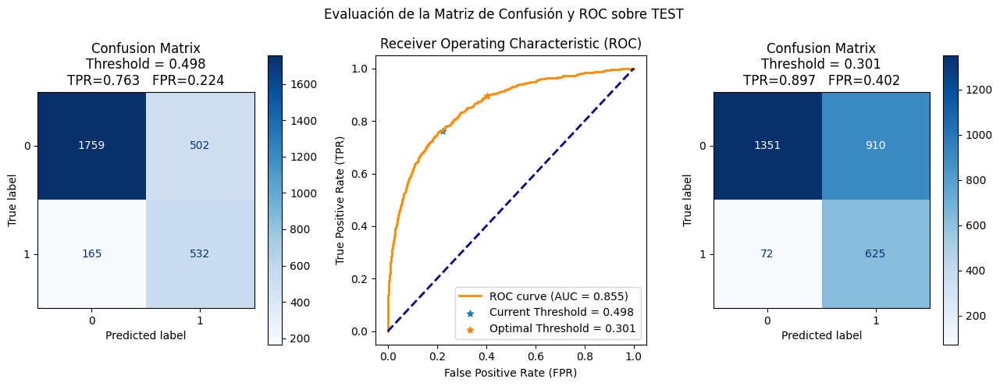

In [304]:
X = df_class.drop(columns=y_target_name + ["Date"])
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns, index=X.index)
X.dropna(how="any", inplace=True)

y = df_class.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777)

model_logreg = LogisticRegression(class_weight="balanced")
report, report_opt, *_ = plot_logreg(model_logreg, X_train, X_test, y_train, y_test)
print("REPORTE THRESHOLD STANDART (0.5)", report, sep="\n")
print("REPORTE THRESHOLD OPTIMIZADO", report_opt, sep="\n")

Lo primero que observamos al incluir todas las caracteristicas $X$ es que el ROC ha aumentado levemente a `0.853`, apenas `0.005` (un `0.5%` practicamente imperceptible).
Podemos apreciar que los valores de TPR y FPR son muy similares con una excepción.

El FPR pasó de `0.34` a `0.43`, lo cual es sensiblemente mayor por sólo conseguir una mejora del `3` puntos en el TPR.

Aqui vemos que tenemos margen de juego para remover características superfluas.

Para identificar que caracteristcas son relevantes vamos a aplicar rápidamente `Lasso`.

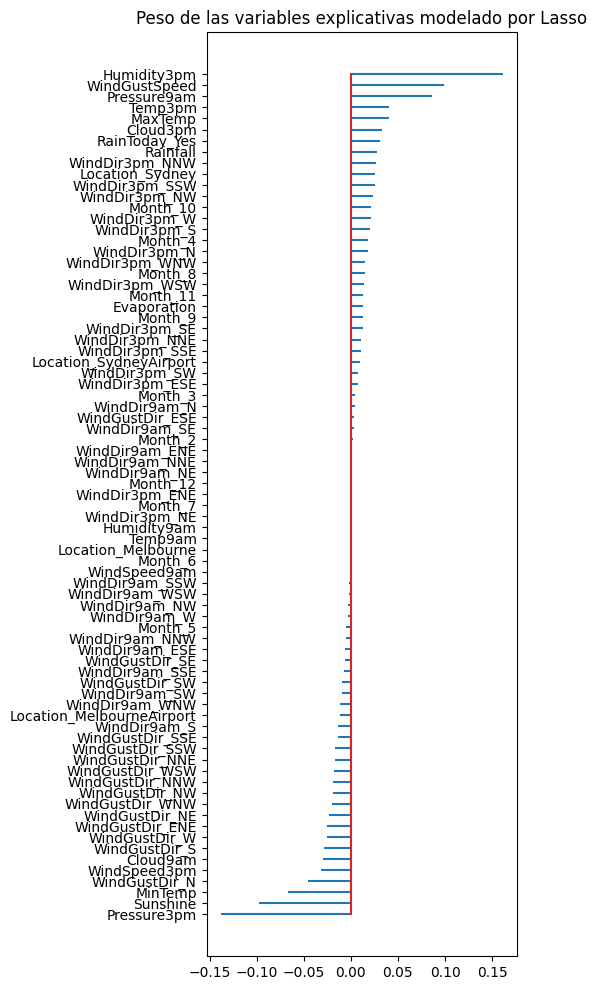

In [305]:
from sklearn.linear_model import LassoCV
model_lasso = LassoCV().fit(X_train,y_train)
y_pred = model_lasso.predict(X_test)
df_stem=pd.Series(model_lasso.coef_.flatten(),index=X_train.columns).sort_values()
plt.figure(figsize=(4,12))
plt.stem(df_stem.index, df_stem, markerfmt=' ', orientation="horizontal")
plt.title("Peso de las variables explicativas modelado por Lasso")
plt.show()

Podemos ahora, identificar cuales son aquellas que mas contribuyen a la variable predictora $y$.

In [306]:
lass_lista=df_stem[(df_stem.abs()>df_stem.abs().quantile(0.80))]
lass_lista

Pressure3pm      -0.138126
Sunshine         -0.097894
MinTemp          -0.066186
WindGustDir_N    -0.045239
WindSpeed3pm     -0.031566
Cloud9am         -0.029488
WindGustDir_S    -0.028631
WindDir3pm_NNW    0.026445
Rainfall          0.027333
RainToday_Yes     0.030661
Cloud3pm          0.032597
MaxTemp           0.040980
Temp3pm           0.041017
Pressure9am       0.086090
WindGustSpeed     0.099059
Humidity3pm       0.161046
dtype: float64

Veamos el performance de estas columnas obteniendo a partir de ellas una nueva matriz de confusión (Una vez más, tanto para el umbral estándar como para el óptimo)

              precision    recall  f1-score   support

           0       0.91      0.79      0.84      2431
           1       0.53      0.76      0.63       774

    accuracy                           0.78      3205
   macro avg       0.72      0.77      0.74      3205
weighted avg       0.82      0.78      0.79      3205

              precision    recall  f1-score   support

           0       0.95      0.56      0.70      2431
           1       0.40      0.91      0.55       774

    accuracy                           0.64      3205
   macro avg       0.67      0.73      0.63      3205
weighted avg       0.82      0.64      0.67      3205



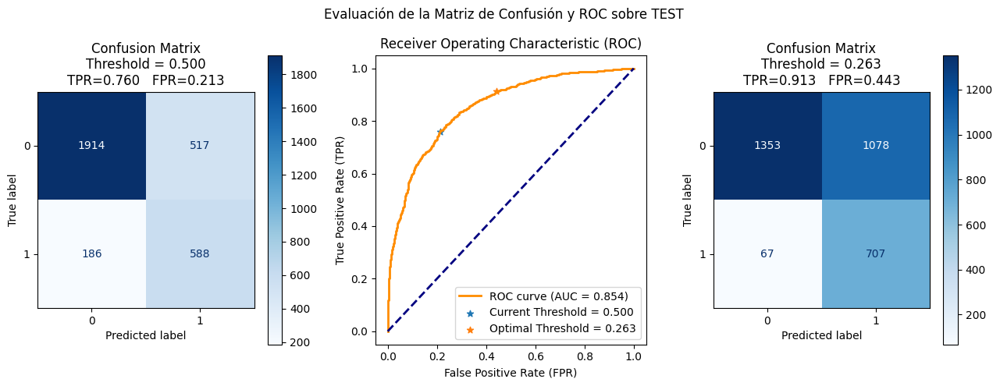

In [307]:
X = df_class[
    ["Cloud3pm","Humidity3pm","MaxTemp","MinTemp","Pressure3pm","Pressure9am",
     "RainToday","Sunshine","WindGustDir","WindGustSpeed","WindSpeed3pm",
    ]]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns, index=X.index)
X.dropna(how="any", inplace=True)

y = df_class.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso = train_test_split(X, y, stratify=y, random_state=777)
model_lasso_reducido = LogisticRegression(class_weight="balanced")
report, report_opt, *_ = plot_logreg(model_lasso_reducido, X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso)
print(report)
print(report_opt)

Podemos ver que hemos "mejorado" apenas el modelo según el ROC pero los valores de TPR y FPR son practicamente iguales a los anteriores.

Podemos contrastar estos hallazgos utilizando los valores de **Shap**.

In [308]:
!python -m shap 2>/dev/null || pip install --quiet shap
import shap
shap.initjs()
# ESTAMOS USANDO EL MODELO EL CUAL CUENTA CON TODAS LAS CARACTERISTICAS!!
explainer = shap.Explainer(model_logreg, X_train)
shap_values = explainer(X_test)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 7.7 MB/s eta 0:00:00


Observemos todas las características juntas, aquí podemos apreciar claramente el aporte que cada una realiza en cuanto a que llueva o no y el valor de las mismas representado con colores.

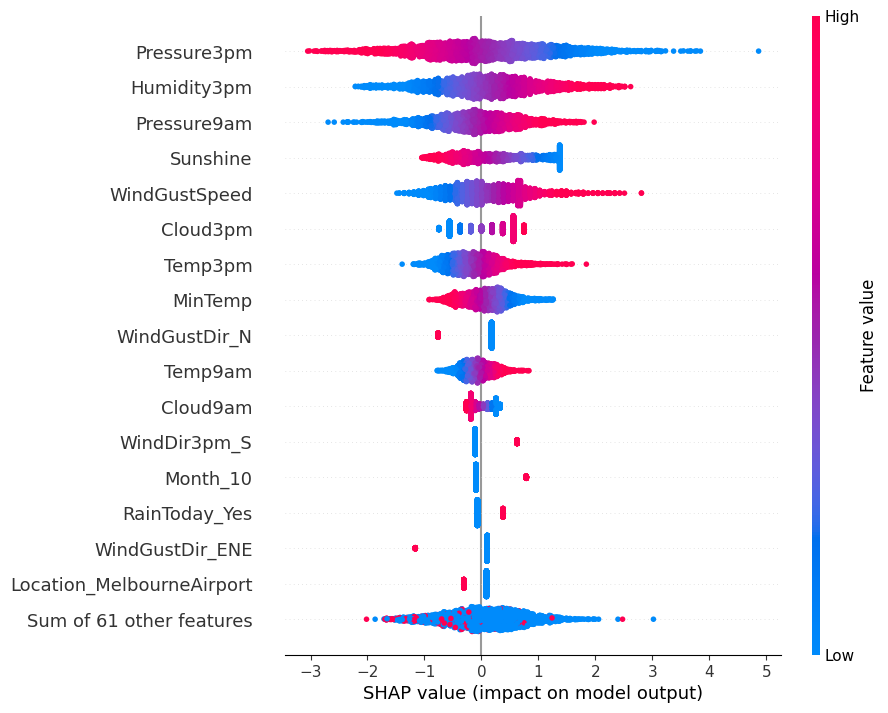

In [309]:
shap.plots.beeswarm(shap_values, max_display=lass_lista.shape[0]+1)

Podemos ver que las columnas, son las mismas que las sugeridas por `Lasso` a excepción principalmente de `Temp9am` y `Temp3pm`.


              precision    recall  f1-score   support

           0       0.91      0.77      0.83      2432
           1       0.51      0.75      0.61       774

    accuracy                           0.77      3206
   macro avg       0.71      0.76      0.72      3206
weighted avg       0.81      0.77      0.78      3206

              precision    recall  f1-score   support

           0       0.95      0.61      0.74      2432
           1       0.42      0.89      0.57       774

    accuracy                           0.68      3206
   macro avg       0.68      0.75      0.66      3206
weighted avg       0.82      0.68      0.70      3206



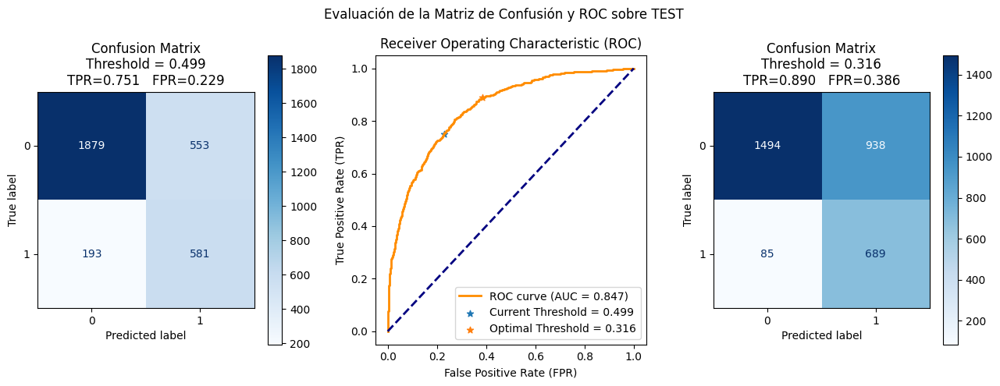

In [310]:
X = df_class[
    [
        "Pressure3pm","Pressure9am","Humidity3pm","Sunshine",
        "WindGustSpeed","Cloud3pm", "MinTemp","Temp9am","Temp3pm",
        "WindGustDir"
    ]]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns, index=X.index)
X.dropna(how="any", inplace=True)

y = df_class.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

X_train_shap, X_test_shap, y_train_shap, y_test_shap = train_test_split(X, y, stratify=y, random_state=777)

model_clf_ml_columns_x_train=X_train_shap.columns

model_shap = LogisticRegression(class_weight="balanced")
model_clf_ml=model_shap

report, report_opt, *_ = plot_logreg(model_shap, X_train_shap, X_test_shap, y_train_shap, y_test_shap)
print(report)
print(report_opt)

Primero podemos ver que el ROC se ha reducido con respecto el modelo sugerido por `Lasso`. Así mismo, el umbral estandar tiene leves empeoramientos con respecto a `Lasso`.
Sin embargo, el TPR tiene 2 puntos menos y el FPR 5 puntos menos.

### Conclusión
Encontramos que dentro de todo hemos obtenidos en general modelos muy buenos, con un ROC superior al `84%`. En algunos casos mejores y peores combinaciones de TPR y FPR.
A lineas generales podemos decir que por simplicidad es conveniente utilizar el modelo entrenado con características numericas y ajustarle el umbral obteniendo un TPR de `87%` y un FPR de `34%`.
Queda pendiente observar como cambiarían estos valores si se balancease el dataset.

## Red Neuronal

Para resolver el problema de clasficación, procederemos a crear una red neuronal utilizando el framework the TensorFlow.

Usaremos para el conjunto de entrenamiento las mismas columnas utilizadas que en el modelo base.

In [311]:
model_clf_nn_columns=[
        "Pressure3pm","Pressure9am","Humidity3pm","Sunshine",
        "WindGustSpeed","Cloud3pm", "MinTemp","Temp9am","Temp3pm",
        "WindGustDir"
    ]
X = df[model_clf_nn_columns]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X.dropna(how="any", inplace=True)

y = df.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

# mitigamos el efecto del desbalanceo de datos estratificando los datos.
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777)

model_clf_nn_columns_X_train=X_train.columns

La arquitectura de nuestra red neuronal queda definida por las siguientes capas:

In [312]:
normalizer = ke.layers.Normalization()
normalizer.adapt(X_train)

# Definimos que la red debe ir SECUENCIALMENTE CAPA POR CAPA
model_clf_nn = ke.models.Sequential()
# Especificamos la cantidad de caracterisitcas que van a ingresar
model_clf_nn.add(ke.Input(shape=X_train.shape[1]))
# Ni bien ingresan las características, las normalizamos para tener mejor rendimiento del modelo.
model_clf_nn.add(normalizer)
# Aplicamos una capa densa (es decir, todas las neuronas de la capa anterior se
# deben conectar con TODAS las neuronas de la capa actual) la funcion de
# activación es relu por simplicidad y performance de computo, en lugar de ser una sigmoide.
model_clf_nn.add(ke.layers.Dense(256, activation='relu'))
# Para evitar el sobre-ajuste de datos, se introduce un dropout, es decir,
# se eliminar aleatoreamente el 5% de las 256 neuronas.
model_clf_nn.add(ke.layers.Dropout(0.05))
# Nueva capa relu con 64 neuronas densas
model_clf_nn.add(ke.layers.Dense(64, activation='relu'))
# Dropout menor que antes
model_clf_nn.add(ke.layers.Dropout(0.02))
# Una última capa oculta con 16 neuronas densas en relu.
model_clf_nn.add(ke.layers.Dense(16, activation='relu'))
# Al tratarse de un modelo de clasificación binaria, necesitamos tener 1 sola
# neurona de salida y una funciuon de activacion como el aplicado en las
# regresiones logisticas, es decir una sigmoide.
model_clf_nn.add(ke.layers.Dense(1, activation='sigmoid'))


# Definimos la configuración para el entrenamiento
model_clf_nn.compile(
    # herramienta para ajustar los parametros de entrenamiento del modelo.
    # define cómo el modelo se actualiza en respuesta al conjunto de datos y a
    # la función de pérdida durante el entrenamiento.
    optimizer=tf.keras.optimizers.Adam(),
    # funcion de perdida, BinaryCrossEntropy es usada cuando tenemos problemas
    # de clasificación BINARIA.
    loss=tf.keras.losses.BinaryCrossentropy(),
    # monitoreamos el modelo fijandonos el recall, no influyen en el entrenamiento
    # es weighted por estar evaluando un conjunto de datos desbalanceados.

    # weighted_metrics=[
    #     tf.keras.metrics.F1Score(average='macro')
        # ]
    weighted_metrics=[
        tf.keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        ]
    )


model_clf_nn.summary()

Model: "sequential_172"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_4 (Normaliza  (None, 24)                49        
 tion)                                                           
                                                                 
 dense_550 (Dense)           (None, 256)               6400      
                                                                 
 dropout_375 (Dropout)       (None, 256)               0         
                                                                 
 dense_551 (Dense)           (None, 64)                16448     
                                                                 
 dropout_376 (Dropout)       (None, 64)                0         
                                                                 
 dense_552 (Dense)           (None, 16)                1040      
                                                    

A lo largo del entrenamiento de nuestro modelo vamos a configurar 23954 parametros.
Este nuemero sale de la sumatoria de todos los parametros de las capas.
A modo de ejemplo el valor 6400 es compuesto por: `caut var entradas * num neuronas + termino indep por cada neurona = 24 * 256 + 256 = 6400`

In [313]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_prc',
    verbose=1,
    patience=10,
    mode='max',
    restore_best_weights=True)

# entrnamos el modelo
history=model_clf_nn.fit(
    # datos de entrada para el entrenamiento
    X_train,
    # las etiquetas target de entrenamiento
    y_train,
    # 1 epoch representa que todos los datos de entrenamiento han tenido la
    # oportunidad de modificar los parametros del modelo. 10 epochs implican
    # que todos los datos, han pasado 10 veces por el entrenamiento del modelo.
    epochs=20,
    # cantidad de muestras a enviar para que juntas actualicen los parametros
    # del modelo. Un tamaño de lote más pequeño significa que el modelo se
    # actualizará con más frecuencia, lo que puede conducir a un entrenamiento
    # más rápido, pero también puede aumentar la variabilidad de las
    # actualizaciones del modelo.
    batch_size=24,
    # datos de validación usados para evaluar el modelo después de cada epoch
    # durante el proceso de entrenamiento.
    # Permite monitorear el rendimiento del modelo en datos no vistos y
    # verificar si hay sobreajuste.
    validation_data=(X_test, y_test),
    # usar toda la capacidad instalada en la pc
    workers=-1,
    # Como nuestros datos se encuentran desbalanceados, debemos indicarle que
    # la clase 0 es menos importante que la clase 1.
    class_weight={0:0.3,1:0.7},
    callbacks=[early_stopping],
    )


Epoch 1/20
401/401 [==============================] - 5s 7ms/step - loss: 0.1949 - prc: 0.8021 - precision: 0.7343 - recall: 0.6782 - val_loss: 0.4474 - val_prc: 0.6875 - val_precision: 0.5417 - val_recall: 0.7300
Epoch 2/20
401/401 [==============================] - 5s 12ms/step - loss: 0.1823 - prc: 0.8277 - precision: 0.7590 - recall: 0.7178 - val_loss: 0.4077 - val_prc: 0.6947 - val_precision: 0.6040 - val_recall: 0.6305
Epoch 3/20
401/401 [==============================] - 3s 8ms/step - loss: 0.1792 - prc: 0.8335 - precision: 0.7603 - recall: 0.7070 - val_loss: 0.3949 - val_prc: 0.6971 - val_precision: 0.6293 - val_recall: 0.6163
Epoch 4/20
401/401 [==============================] - 3s 8ms/step - loss: 0.1764 - prc: 0.8403 - precision: 0.7671 - recall: 0.7182 - val_loss: 0.4317 - val_prc: 0.6965 - val_precision: 0.5550 - val_recall: 0.7235
Epoch 5/20
401/401 [==============================] - 4s 10ms/step - loss: 0.1751 - prc: 0.8421 - precision: 0.7669 - recall: 0.7187 - val_loss

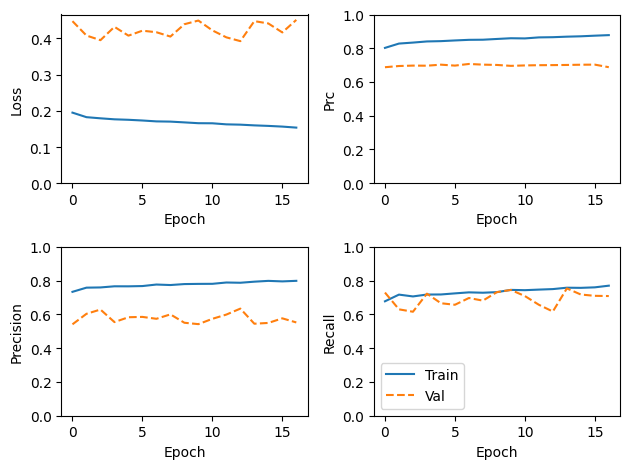

In [314]:
metrics = ['loss', 'prc', 'precision', 'recall']
for n, metric in enumerate(metrics):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(history.epoch, history.history[metric], label='Train')
  plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.8,1])
  else:
    plt.ylim([0,1])

plt.legend()
plt.tight_layout()

101/101 [==============================] - 0s 2ms/step
Y PRED
               precision    recall  f1-score   support

           0       0.90      0.84      0.87      2432
           1       0.57      0.70      0.63       774

    accuracy                           0.80      3206
   macro avg       0.74      0.77      0.75      3206
weighted avg       0.82      0.80      0.81      3206

Y* OPT
               precision    recall  f1-score   support

           0       0.94      0.66      0.77      2432
           1       0.45      0.87      0.59       774

    accuracy                           0.71      3206
   macro avg       0.69      0.76      0.68      3206
weighted avg       0.82      0.71      0.73      3206



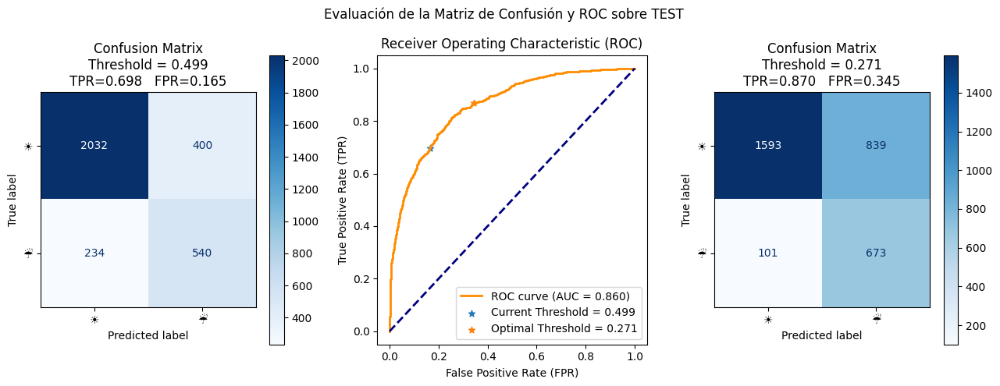

In [315]:
# Con la estimación de las probabilidades podemos contruir la curva ROC
y_prob = model_clf_nn(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

# Posicion del indice que corresponde al umbral 0.5
curr_index = np.abs(thresholds - 0.5).argmin()
# Posicion del indice que corresponde al umbral que posee los valores mas cercanos a (0,1) para TPR y FPR
optimal_index = ((1 - tpr**2) + fpr**2).argmin()

y_pred = model_clf_nn.predict(X_test) >0.5

# Adaptamos el umbral al ratio optimo
y_pred_opt = tf.cast(y_prob >= thresholds[optimal_index], tf.int8)

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(13, 5))
fig.suptitle("Evaluación de la Matriz de Confusión y ROC sobre TEST")
axs[1].plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (AUC = {roc_auc:0.3f})")
axs[1].plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
axs[1].set_xlim([-0.05, 1.05])
axs[1].set_ylim([-0.05, 1.05])
axs[1].set_ylabel("True Positive Rate (TPR)")
axs[1].set_xlabel("False Positive Rate (FPR)")
axs[1].set_title("Receiver Operating Characteristic (ROC)")
for i, (t, idx) in enumerate([("Current", curr_index), ("Optimal", optimal_index)]):
    y_opt = tpr[idx]
    x_opt = fpr[idx]
    axs[1].scatter(
        x=x_opt, y=y_opt, marker="*", label=f"{t} Threshold = {thresholds[idx]:0.3f}"
    )
    ConfusionMatrixDisplay(
        confusion_matrix(y_test, y_pred if i == 0 else y_pred_opt),
        display_labels=["☀️","☔"],
    ).plot(cmap=plt.cm.Blues, ax=axs[i * 2])
    axs[i * 2].set_title(f"Confusion Matrix\nThreshold = {thresholds[idx]:0.3f}\nTPR={y_opt:0.3f}   FPR={x_opt:0.3f}")
axs[1].legend(loc="lower right")
fig.tight_layout()
fig.show()

print("Y PRED\n",classification_report(y_test, y_pred))
print("Y* OPT\n",classification_report(y_test, y_pred_opt))

A la izquierda, el comportamiento del modelo de la red neuronal, ulizando un threshold de 0.5.

Vemos que éste tien un recall de 0.84 para los dias no lluviosos y 0.71 para los dias lluviosos.

A la derecha, está el modelo con el umbral "optimizado" al valor 0.244, decir, si la salida del softmax tiene un valor mayor a éste, entonces correspondera a la predicción de un dia lluvioso.

Podemos ver que su recall, se ha mejora significativamente (0.9) pero a expensas de disminuir el recall de los dias no lluviosos (0.59)

A nivel general nos gusta este modelo porque reduce al minimo la cantidad de dias lluviosos que no son detectados.

In [316]:
# Si lo comparamos con el modelo base:
print(report_clf_base)

              precision    recall  f1-score   support

           0       0.76      1.00      0.86      2432
           1       0.00      0.00      0.00       774

    accuracy                           0.76      3206
   macro avg       0.38      0.50      0.43      3206
weighted avg       0.58      0.76      0.65      3206



Vemos que en el modelo base, la exactitud es mayor, pero ésto era esperable dado que en un dataset desbalanceado, siempre obtendremos una axactitud mayor favoreciendo la clase mayoritaria.

## Optimización de hiperparámetros para la red neuronal de clasificación. Aplicaremos Optuna

In [317]:
import optuna
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, f1_score

X = df[[
        "Pressure3pm","Pressure9am","Humidity3pm","Sunshine",
        "WindGustSpeed","Cloud3pm", "MinTemp","Temp9am","Temp3pm",
        "WindGustDir"
    ]]
X = pd.get_dummies(data=X, columns=X.select_dtypes(exclude=np.number).columns, drop_first=True)
X.dropna(how="any", inplace=True)

y = df.loc[X.index]["RainTomorrow"].map({"Yes": 1, "No": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777)

model_clf_nn_optuna_columns_x_train=X_train.columns

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_prc',
    verbose=1,
    patience=10,
    mode='max',
    restore_best_weights=True)


def objective(trial):
    # Define los hiperparámetros que deseas optimizar
    num_layers = trial.suggest_int('num_layers', 1, 5)

    # Usa una distribución más amplia para la cantidad de neuronas
    num_neurons = [trial.suggest_int(f'num_neurons_layer_{i}', 16, 512) for i in range(num_layers, 0, -1)]

    dropout_rate = trial.suggest_uniform('dropout_rate', 0.0, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)

    normalizer = ke.layers.Normalization()
    normalizer.adapt(X_train)

    # Crea tu modelo de clasificación de redes neuronales con los hiperparámetros sugeridos por Optuna
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Input(shape=X_train.shape[1]))
    model.add(normalizer)

    for i in range(num_layers):
        model.add(tf.keras.layers.Dense(num_neurons[i], activation='relu'))
        model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss=tf.keras.losses.BinaryCrossentropy(),
        weighted_metrics=[
          tf.keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
          tf.keras.metrics.Precision(name='precision'),
          tf.keras.metrics.Recall(name='recall'),
        ]
    )

    # Entrena el modelo
    model.fit(X_train, y_train, epochs=5, batch_size=24, validation_data=(X_test, y_test), verbose=0, workers=-1,
              class_weight={0:0.3,1:0.7},callbacks=[early_stopping])

    # Evalúa el modelo en el conjunto de validación
    y_val_pred = model.predict(X_test)>0.5

    f1 = f1_score(y_test, y_val_pred, average="macro")
    return f1

# Crea un estudio de Optuna y optimiza la función objetivo
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)

# Obtiene los mejores hiperparámetros encontrados por Optuna
best_params = study.best_params
print('Optimal Hyperparameters:', best_params)

normalizer = ke.layers.Normalization()
normalizer.adapt(X_train)

model_clf_nn_optuna = tf.keras.models.Sequential()
model_clf_nn_optuna.add(tf.keras.layers.Input(shape=X_train.shape[1]))
model_clf_nn_optuna.add(normalizer)

for i in range(best_params['num_layers']):
    model_clf_nn_optuna.add(tf.keras.layers.Dense(best_params[f'num_neurons_layer_{i+1}'], activation='relu'))
    model_clf_nn_optuna.add(tf.keras.layers.Dropout(best_params['dropout_rate']))

model_clf_nn_optuna.add(tf.keras.layers.Dense(1, activation='sigmoid'))

model_clf_nn_optuna.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
        loss=tf.keras.losses.BinaryCrossentropy(),
        weighted_metrics=[
          tf.keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
          tf.keras.metrics.Precision(name='precision'),
          tf.keras.metrics.Recall(name='recall'),
        ]
    )

# Entrena el modelo final con los hiperparámetros óptimos
model_clf_nn_optuna.fit(X_train, y_train, epochs=5, batch_size=24, validation_data=(X_test, y_test), verbose=0, workers=-1,
              class_weight={0:0.3,1:0.7},callbacks=[early_stopping])

# Evalúa el modelo final en el conjunto de prueba
y_test_pred = (model_clf_nn_optuna.predict(X_test) > 0.5).astype(int)
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Test Accuracy for the Final Model:", test_accuracy)

[I 2023-12-08 01:07:52,785] A new study created in memory with name: no-name-043aaca8-f604-4e8d-ac03-0cd9b0fbdbd9


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:08:06,484] Trial 0 finished with value: 0.7410638738663525 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 223, 'dropout_rate': 0.24291693134725623, 'learning_rate': 0.0004930448768655805}. Best is trial 0 with value: 0.7410638738663525.


101/101 [==============================] - 1s 4ms/step


[I 2023-12-08 01:08:51,929] Trial 1 finished with value: 0.7536647189467269 and parameters: {'num_layers': 5, 'num_neurons_layer_5': 57, 'num_neurons_layer_4': 335, 'num_neurons_layer_3': 434, 'num_neurons_layer_2': 75, 'num_neurons_layer_1': 137, 'dropout_rate': 0.44864849005819973, 'learning_rate': 0.0018664786654018959}. Best is trial 1 with value: 0.7536647189467269.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:09:11,325] Trial 2 finished with value: 0.7534488133658258 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 304, 'num_neurons_layer_2': 265, 'num_neurons_layer_1': 342, 'dropout_rate': 0.037652488330300826, 'learning_rate': 0.0005152927604330232}. Best is trial 1 with value: 0.7536647189467269.


101/101 [==============================] - 0s 4ms/step


[I 2023-12-08 01:09:55,949] Trial 3 finished with value: 0.7068465460901745 and parameters: {'num_layers': 5, 'num_neurons_layer_5': 125, 'num_neurons_layer_4': 327, 'num_neurons_layer_3': 290, 'num_neurons_layer_2': 406, 'num_neurons_layer_1': 387, 'dropout_rate': 0.376719944307267, 'learning_rate': 1.0879349355777692e-05}. Best is trial 1 with value: 0.7536647189467269.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:10:09,066] Trial 4 finished with value: 0.7537807810382273 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 260, 'dropout_rate': 0.06773054192747902, 'learning_rate': 0.004063643419559596}. Best is trial 4 with value: 0.7537807810382273.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:10:24,152] Trial 5 finished with value: 0.7491619713015008 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 135, 'num_neurons_layer_3': 389, 'num_neurons_layer_2': 98, 'num_neurons_layer_1': 254, 'dropout_rate': 0.2576259914992021, 'learning_rate': 0.0006224949934213171}. Best is trial 4 with value: 0.7537807810382273.


101/101 [==============================] - 0s 3ms/step


[I 2023-12-08 01:10:43,451] Trial 6 finished with value: 0.7469856082081714 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 455, 'num_neurons_layer_1': 372, 'dropout_rate': 0.39150166417572696, 'learning_rate': 0.0007824276670356089}. Best is trial 4 with value: 0.7537807810382273.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:10:56,646] Trial 7 finished with value: 0.755687838714795 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 177, 'num_neurons_layer_1': 252, 'dropout_rate': 0.19914385326288792, 'learning_rate': 0.0006829488142618879}. Best is trial 7 with value: 0.755687838714795.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:11:05,672] Trial 8 finished with value: 0.7425790198956284 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 419, 'dropout_rate': 0.24756377160127985, 'learning_rate': 0.00014981576220300346}. Best is trial 7 with value: 0.755687838714795.


101/101 [==============================] - 0s 3ms/step


[I 2023-12-08 01:11:30,652] Trial 9 finished with value: 0.7503093517706105 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 401, 'num_neurons_layer_3': 260, 'num_neurons_layer_2': 162, 'num_neurons_layer_1': 322, 'dropout_rate': 0.34471565853057917, 'learning_rate': 0.0006499714107609103}. Best is trial 7 with value: 0.755687838714795.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:11:43,967] Trial 10 finished with value: 0.7559230346933037 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 275, 'num_neurons_layer_1': 20, 'dropout_rate': 0.1514178767502421, 'learning_rate': 0.00984292647211085}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:11:57,340] Trial 11 finished with value: 0.7501404373001469 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 267, 'num_neurons_layer_1': 16, 'dropout_rate': 0.13784227322248185, 'learning_rate': 0.008778104630996823}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:12:22,030] Trial 12 finished with value: 0.7295699737313789 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 209, 'num_neurons_layer_1': 507, 'dropout_rate': 0.1576209390580009, 'learning_rate': 0.008900135763817757}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:12:35,383] Trial 13 finished with value: 0.7493844832880255 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 63, 'num_neurons_layer_2': 331, 'num_neurons_layer_1': 33, 'dropout_rate': 0.14785423559837732, 'learning_rate': 0.002272367353963106}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:12:49,456] Trial 14 finished with value: 0.7457141238456744 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 349, 'num_neurons_layer_1': 152, 'dropout_rate': 0.009859333067583742, 'learning_rate': 0.00016284161246325944}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:13:01,906] Trial 15 finished with value: 0.7439530850675429 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 67, 'num_neurons_layer_2': 167, 'num_neurons_layer_1': 116, 'dropout_rate': 0.09576070701291013, 'learning_rate': 0.003437915433652308}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:13:11,019] Trial 16 finished with value: 0.7343814611672326 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 24, 'num_neurons_layer_1': 78, 'dropout_rate': 0.20305943863010917, 'learning_rate': 0.0015346246418972717}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:13:25,056] Trial 17 finished with value: 0.7191899695165288 and parameters: {'num_layers': 4, 'num_neurons_layer_4': 30, 'num_neurons_layer_3': 175, 'num_neurons_layer_2': 211, 'num_neurons_layer_1': 189, 'dropout_rate': 0.11107817670406939, 'learning_rate': 0.009492573797539856}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 3ms/step


[I 2023-12-08 01:14:10,421] Trial 18 finished with value: 0.7194347522471974 and parameters: {'num_layers': 3, 'num_neurons_layer_3': 495, 'num_neurons_layer_2': 506, 'num_neurons_layer_1': 498, 'dropout_rate': 0.1897115439630872, 'learning_rate': 0.003948977350442688}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:14:19,714] Trial 19 finished with value: 0.7310541531154819 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 79, 'dropout_rate': 0.06377638318115503, 'learning_rate': 0.00015972629826295514}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 3ms/step


[I 2023-12-08 01:14:35,396] Trial 20 finished with value: 0.7444535336167343 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 336, 'num_neurons_layer_1': 285, 'dropout_rate': 0.003941181573681007, 'learning_rate': 0.0012408506332583396}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:14:48,621] Trial 21 finished with value: 0.7496575739068865 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 222, 'dropout_rate': 0.08319450213239836, 'learning_rate': 0.0042294787648829305}. Best is trial 10 with value: 0.7559230346933037.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:15:01,730] Trial 22 finished with value: 0.7569302774998032 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 303, 'dropout_rate': 0.047179349171930424, 'learning_rate': 0.00497213250919767}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 3ms/step


[I 2023-12-08 01:15:12,834] Trial 23 finished with value: 0.7464287186463034 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 131, 'num_neurons_layer_1': 319, 'dropout_rate': 0.11608351250155877, 'learning_rate': 0.005855115391130985}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:15:29,791] Trial 24 finished with value: 0.7338054306134276 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 420, 'dropout_rate': 0.0540321283094055, 'learning_rate': 0.002573821201088436}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:15:43,392] Trial 25 finished with value: 0.7511891169864261 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 219, 'num_neurons_layer_1': 201, 'dropout_rate': 0.17519044136817874, 'learning_rate': 0.005896435613344545}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 3ms/step


[I 2023-12-08 01:15:54,730] Trial 26 finished with value: 0.7371179039301311 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 457, 'dropout_rate': 0.11391442645547738, 'learning_rate': 0.0015468393244888578}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:16:18,603] Trial 27 finished with value: 0.7512996724113375 and parameters: {'num_layers': 2, 'num_neurons_layer_2': 299, 'num_neurons_layer_1': 281, 'dropout_rate': 0.04038463868114783, 'learning_rate': 0.006119844240023969}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:16:32,269] Trial 28 finished with value: 0.7501752657142635 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 170, 'dropout_rate': 0.21104151090477297, 'learning_rate': 0.0024824953120199294}. Best is trial 22 with value: 0.7569302774998032.


101/101 [==============================] - 0s 2ms/step


[I 2023-12-08 01:16:43,211] Trial 29 finished with value: 0.7458356767623584 and parameters: {'num_layers': 1, 'num_neurons_layer_1': 93, 'dropout_rate': 0.22215106527784273, 'learning_rate': 0.0010524722504604385}. Best is trial 22 with value: 0.7569302774998032.


Optimal Hyperparameters: {'num_layers': 1, 'num_neurons_layer_1': 303, 'dropout_rate': 0.047179349171930424, 'learning_rate': 0.00497213250919767}
101/101 [==============================] - 0s 2ms/step
Test Accuracy for the Final Model: 0.7950717404865877


De igual forma que con la red neuronal anteior, vamos a observar su tabla de contingencia y métricas.

101/101 [==============================] - 0s 2ms/step
Y PRED OPTUNA + THRESHOLD 0.5
               precision    recall  f1-score   support

           0       0.90      0.83      0.86      2432
           1       0.56      0.70      0.62       774

    accuracy                           0.80      3206
   macro avg       0.73      0.76      0.74      3206
weighted avg       0.82      0.80      0.80      3206

Y PRED OPTUNA + THRESHOLD 0.296 (mas cercano a (1,0)
               precision    recall  f1-score   support

           0       0.96      0.50      0.66      2432
           1       0.37      0.94      0.53       774

    accuracy                           0.60      3206
   macro avg       0.67      0.72      0.59      3206
weighted avg       0.82      0.60      0.63      3206



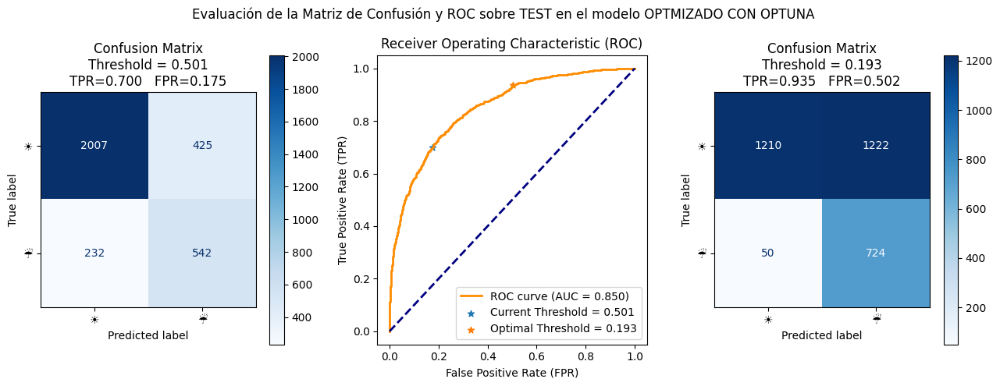

In [318]:
# Con la estimación de las probabilidades podemos contruir la curva ROC
y_prob = model_clf_nn_optuna.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

# Posicion del indice que corresponde al umbral 0.5
curr_index = np.abs(thresholds - 0.5).argmin()
# Posicion del indice que corresponde al umbral que posee los valores mas cercanos a (0,1) para TPR y FPR
optimal_index = ((1 - tpr**2) + fpr**2).argmin()

y_pred = model_clf_nn_optuna.predict(X_test) >0.5

# Adaptamos el umbral al ratio optimo
y_pred_opt = tf.cast(y_prob >= thresholds[optimal_index], tf.int8)

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(13, 5))
fig.suptitle("Evaluación de la Matriz de Confusión y ROC sobre TEST en el modelo OPTMIZADO CON OPTUNA")
axs[1].plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (AUC = {roc_auc:0.3f})")
axs[1].plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
axs[1].set_xlim([-0.05, 1.05])
axs[1].set_ylim([-0.05, 1.05])
axs[1].set_ylabel("True Positive Rate (TPR)")
axs[1].set_xlabel("False Positive Rate (FPR)")
axs[1].set_title("Receiver Operating Characteristic (ROC)")
for i, (t, idx) in enumerate([("Current", curr_index), ("Optimal", optimal_index)]):
    y_opt = tpr[idx]
    x_opt = fpr[idx]
    axs[1].scatter(
        x=x_opt, y=y_opt, marker="*", label=f"{t} Threshold = {thresholds[idx]:0.3f}"
    )
    ConfusionMatrixDisplay(
        confusion_matrix(y_test, y_pred if i == 0 else y_pred_opt),
        display_labels=["☀️","☔"],
    ).plot(cmap=plt.cm.Blues, ax=axs[i * 2])
    axs[i * 2].set_title(f"Confusion Matrix\nThreshold = {thresholds[idx]:0.3f}\nTPR={y_opt:0.3f}   FPR={x_opt:0.3f}")
axs[1].legend(loc="lower right")
fig.tight_layout()
fig.show()

print("Y PRED OPTUNA + THRESHOLD 0.5\n",classification_report(y_test, y_pred))
print("Y PRED OPTUNA + THRESHOLD 0.296 (mas cercano a (1,0)\n",classification_report(y_test, y_pred_opt))

In [319]:
y_pred_final = model_clf_nn_optuna.predict(X_test) > 0.296
print("Reporte Clasifacion Red Neuronal Optimizada con threshold de 0.296:")
print(classification_report(y_test, y_pred_final))

print("Reporte de clasificacion del modelo base")
print(report_clf_base)

101/101 [==============================] - 0s 2ms/step
Reporte Clasifacion Red Neuronal Optimizada con threshold de 0.296:
              precision    recall  f1-score   support

           0       0.93      0.64      0.76      2432
           1       0.43      0.86      0.58       774

    accuracy                           0.69      3206
   macro avg       0.68      0.75      0.67      3206
weighted avg       0.81      0.69      0.72      3206

Reporte de clasificacion del modelo base
              precision    recall  f1-score   support

           0       0.76      1.00      0.86      2432
           1       0.00      0.00      0.00       774

    accuracy                           0.76      3206
   macro avg       0.38      0.50      0.43      3206
weighted avg       0.58      0.76      0.65      3206



# MLOps

Para disponibilizar nuestros modelos en produccion primero debemos serializarlos y exportarlos **junto a los nombres de las features** las cuales son usadas con ellos al ingresar el `X_test`. A su vez, tambien exportaremos el resumen de los estadísticos de las características para poder mostrarlas adecuadamente en la interfaz de streamlit.

La exportación de los modelos la realizaremos con la librería `joblib` el cual nos permite serializar objetos de python. De esta manera evitamos tener que volver a re-entrenar el modelo caundo lo queremos utilizar.

Exportaremos,

Regresion:
  - Dummy
  - Regreion Lineal
  - Red Neuronal

Clasificacion
  - Dummy
  - Regresion Logística
  - Red Neuronal

In [320]:
joblib.dump(model_reg_dummy, "model_reg_dummy.pkl")
joblib.dump(model_reg_ml, "model_reg_ml.pkl")
with open('model_reg_ml_columns_x_train.txt', 'w') as file:
    file.write(';'.join(model_reg_ml_columns_x_train))

In [321]:
# Regresion Dummy
joblib.dump(model_reg_dummy, "model_reg_dummy.pkl")

# Regresion Lineal - ML
joblib.dump(model_reg_ml, "model_reg_ml.pkl")
with open('model_reg_ml_columns_x_train.txt', 'w') as file:
    file.write(';'.join(model_reg_ml_columns_x_train))

# Regresion Red Neuronal
joblib.dump(model_reg_nn, "model_reg_nn.pkl")

with open('model_reg_nn_columns.txt', 'w') as file:
    file.write(';'.join(model_reg_nn_columns))



In [322]:
# Clasificacion Dummy
joblib.dump(mode_clf_dummy, "mode_clf_dummy.pkl")

# Regresion Logistica - ML
joblib.dump(model_clf_ml, "model_clf_ml.pkl")
with open('model_clf_ml_columns_x_train.txt', 'w') as file:
    file.write(';'.join(model_clf_ml_columns_x_train))

# Clasificacion Red Neuronal
joblib.dump(model_clf_nn, "model_clf_nn.pkl")
with open('model_clf_nn_columns_x_train.txt', 'w') as file:
    file.write(';'.join(model_clf_nn_columns_X_train))

# Clasificacion Red Neuronal Optimizado
joblib.dump(model_clf_nn_optuna, "model_clf_nn_optuna.pkl")
with open('model_clf_nn_optuna_columns_x_train.txt', 'w') as file:
    file.write(';'.join(model_clf_nn_optuna_columns_x_train))

In [323]:
from google.colab import files
for f in [
    "mode_clf_dummy.pkl",
"model_clf_ml.pkl",
"model_clf_nn.pkl",
"model_clf_nn_optuna.pkl",
'model_clf_ml_columns_x_train.txt',
'model_clf_nn_columns_x_train.txt',
'model_clf_nn_optuna_columns_x_train.txt',
    "model_reg_dummy.pkl",
    "model_reg_ml.pkl",
    'model_reg_ml_columns_x_train.txt',
    "model_reg_nn.pkl",
   'model_reg_nn_columns.txt',
    ]:
  files.download(f)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Resumen de los estadísticos de las características $X$: `summary.json`.

In [324]:
columns=set(df.columns)-{"RainfallTomorrow", "RainTomorrow", "Date"}
summary = df[columns].describe(include="all")

summary.loc['unique_values'] = np.nan
for col in df[columns].select_dtypes(exclude=np.number).columns:
    unique_values_str = ';'.join(str(v) for v in df[col].unique())
    summary.loc['unique_values', col] = unique_values_str

summary.to_json("summary.json")

summary

,Location,Evaporation,Pressure3pm,Temp3pm,WindSpeed3pm,MinTemp,Sunshine,MaxTemp,WindGustSpeed,RainToday,...,WindGustDir,Month,WindDir9am,Pressure9am,Humidity9am,Cloud9am,WindSpeed9am,Cloud3pm,Humidity3pm,WindDir3pm
count,15199,13505.000000,14954.000000,15183.000000,14950.000000,15189.000000,15199.000000,15193.000000,14970.000000,15036,...,13754,15199.0,14521,14946.000000,15111.000000,13158.000000,14939.000000,12917.000000,15154.000000,14910
unique,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,...,16,12.0,16,NaN,NaN,NaN,NaN,NaN,NaN,16
top,Canberra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,...,N,5.0,N,NaN,NaN,NaN,NaN,NaN,NaN,S
freq,3417,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11541,...,1983,1401.0,2311,NaN,NaN,NaN,NaN,NaN,NaN,1860
mean,NaN,4.869108,1016.079898,20.260304,21.746622,11.606057,6.932003,21.784203,42.431730,NaN,...,NaN,NaN,NaN,1018.334022,68.884918,4.738486,16.479617,4.735852,51.238683,NaN
std,NaN,3.057514,7.264708,5.858891,9.529054,5.877294,3.620907,6.055148,15.825381,NaN,...,NaN,NaN,NaN,7.398337,15.645965,2.731410,10.282170,2.593568,17.735612,NaN
min,NaN,0.000000,985.500000,3.700000,0.000000,-8.000000,0.000000,4.100000,0.000000,NaN,...,NaN,NaN,NaN,986.700000,11.000000,0.000000,0.000000,0.000000,3.000000,NaN
25%,NaN,2.600000,1011.200000,16.000000,15.000000,7.900000,4.400000,17.200000,31.000000,NaN,...,NaN,NaN,NaN,1013.400000,59.000000,2.000000,9.000000,2.000000,39.000000,NaN
50%,NaN,4.200000,1016.300000,19.800000,20.000000,11.600000,7.600000,21.300000,41.000000,NaN,...,NaN,NaN,NaN,1018.500000,70.000000,6.000000,15.000000,6.000000,51.000000,NaN
75%,NaN,6.600000,1021.000000,24.200000,28.000000,15.900000,9.700000,25.800000,52.000000,NaN,...,NaN,NaN,NaN,1023.300000,80.000000,7.000000,22.000000,7.000000,62.000000,NaN


A continuacion, dispondremos de los modelos utilizanod el framework `Streamlit` el cual no permite armar una interfaz visual web muy sencilla con Python.

Aqui importamos los modelos exportados anteriormente con `joblib` y tambien leeremos las columnas que cada modelo esta utilizando para predecir sus valores.

In [326]:
pip install streamlit


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.0 MB/s eta 0:00:00


In [ ]:
from joblib import load
import numpy as np
import pandas as pd
import streamlit as st


# CAPA DATOS
def load_columns(path):
    with open(path, "r") as f:
        return f.read().split(";")


modelos = {
    "Dummy": {
        "regresion": {
            "model": load("modelos/model_reg_dummy.pkl"),
            "columns_x_train": [],
        },
        "clasificacion": {
            "model": load("modelos/model_clf_dummy.pkl"),
            "columns_x_train": [],
        },
    },
    "ml": {
        "regresion": {
            "model": load("modelos/model_reg_ml.pkl"),
            "columns_x_train": load_columns("modelos/model_reg_ml_columns_x_train.txt"),
        },
        "clasificacion": {
            "model": load("modelos/model_clf_ml.pkl"),
            "columns_x_train": load_columns("modelos/model_clf_ml_columns_x_train.txt"),
        },
    },
    "NN": {
        # "regresion": {
        #     "model": load("modelos/model_reg_nn.pkl"),
        #     "columns_x_train": load_columns("modelos/model_reg_nn_columns_x_train.txt"),
        # },
        # "clasificacion": {
        #     "model": load("modelos/model_clf_nn.pkl"),
        #     "columns_x_train": load_columns("modelos/model_clf_nn_columns_x_train.txt"),
        # },
    },
    "NN*": {
        # "regresion": {
        #     "model": load("modelos/model_clf_nn_optuna.pkl"),
        #     "columns_x_train": load_columns("modelos/model_reg_nn_optuna_columns_x_train.txt"),
        # },
        "clasificacion": {
            "model": load("modelos/model_clf_nn_optuna.pkl"),
            "columns_x_train": load_columns("modelos/model_clf_nn_optuna_columns_x_train.txt"),
        },
    },
}

df = pd.read_json("summary.json")
columns_of_interest = [
    ("Generales", ["Location", "RainToday", "Rainfall", "Evaporation", "Sunshine"]),
    ("Temperatura", ["MaxTemp", "MinTemp", "Temp3pm", "Temp9am"]),
    ("Nubosidad", ["Cloud3pm", "Cloud9am"]),
    ("Presion", ["Pressure3pm", "Pressure9am"]),
    ("Humedad", ["Humidity3pm", "Humidity9am"]),
    ("Velocidad del Viento", ["WindGustSpeed", "WindSpeed3pm", "WindSpeed9am"]),
    ("Direccion del Viento", ["WindDir3pm", "WindDir9am", "WindGustDir"]),
]


# CAPA VISTA
st.set_page_config(
    page_title="Llueve sobre mojado",
    page_icon=":sun_with_face:",
    layout="wide",
)

st.title("Predicción de lluvia en Australia")


values = {}
st.header("Ajuste de paramétros", divider="grey")
cols = st.columns(len(columns_of_interest))
for i, (header_titlte, col_group) in enumerate(columns_of_interest):
    cols[i].subheader(header_titlte)
    for col_name in sorted(col_group):
        if pd.api.types.is_numeric_dtype(df[col_name]):
            max_v = df.loc["max", col_name]
            min_v = df.loc["min", col_name]
            values[col_name] = cols[i].slider(
                label=col_name,
                help=f"{min_v} <= {col_name} <= {max_v}",
                value=df.loc["mean", col_name],
                min_value=min_v,
                max_value=max_v,
            )
        else:
            unique_values = df.loc["unique_values", col_name].split(";")
            values[col_name] = cols[i].selectbox(
                label=col_name,
                options=unique_values,
                index=unique_values.index(df.loc["top", col_name]),
            )


def eval_models(values):
    result = {}
    for model_name in modelos:
        result[model_name] = {}
        for model_type in modelos[model_name]:
            model = modelos[model_name][model_type]["model"]
            columns_x_train = modelos[model_name][model_type]["columns_x_train"]
            x_test = []
            for col in columns_x_train:
                if "_" not in col:
                    x_test.append(values[col])
                else:
                    col_name, col_value = col.split("_")
                    x_test.append(values[col_name] == col_value)

            print("Evalando", model_name, model_type)
            prediction_arr = model.predict([x_test])

            prediction=prediction_arr[0] if np.isscalar(prediction_arr[0]) else prediction_arr[0][0]

            result[model_name][model_type] = prediction if model_type == "regresion" else ":rain_cloud:" if prediction>0.5 else ":sun_with_face:"
    return result


with st.container():
    st.header("Predicción", divider="rainbow")
    with st.spinner("Ejecutando modelos..."):
        evaluated_models = eval_models(values)
        for i, model_name in enumerate(evaluated_models):
            st.container()
            cols = st.columns(len(modelos[model_name]) + 1, gap="small")
            cols[0].subheader(model_name)
            for i, v in enumerate(
                [evaluated_models[model_name][mt] for mt in evaluated_models[model_name]]
            ):
                cols[i + 1].write(v)


In [329]:
# la aplicación de streamlit se puede iniciar con el siguiente comando:
# como estamos en colab no tiene efecto, pero si descargamos los modelos y las
# tablas podremos probarlo localmente.
!streamlit run app.py

Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: app.py


# <font color="orange">Conclusion</font>

Arrancamos analizando nuestra base de datos, para eliminar valores innecesarios, analizar qué hacer con los valores faltantes, y realizando el tratamiento previo a los outliers que encontrásemos para poder trabajar.

Una vez realizado el tratamiento procedimos con la creación de distintos modelos con los cuales obtuvimos predicciones sobre si llovía o no al día siguiente y qué cantidad llovía. (es decir, las variables RainTomorrow y RainfallTomorrow).

Al comparar con los modelos base, notamos que si bien un modelo que siempre prediga que no lloverá es más acertado, no nos proporciona información útil. Es decir, dado que la base de datos estaba muy desbalanceada favoreciendo los días que no llovía, si siempre decimos que no va a llover, acertaríamos más del 75% de las veces.

Sin embargo esto no es de utilidad, dado que lo interesante sería que podamos acertar la mayor cantidad de veces cuando si va a llover. Por lo tanto, conseguir que de 10 veces que predigamos lluvia, acertemos 5, nos pareció más interesante que asegurar que no va a llover nunca, aunque eso nos diera un porcentaje de aciertos mayor.

En base a esto, intentamos optimizar los modelos con el recall en mente, dado que esta métrica es la que nos indica cuántas veces de las que predijimos un positivo, efectivamente lo fue.

Optamos por usar Optuna para optimizar hiperparámetros, mejorando así el rendimiento de nuestros modelos. Y aplicamos SHAP para la explicabilidad.

Por último creamos una aplicación interactiva mediante Streamlit.
